## Team 10 Code

Members: Pooja Adiseshu, Eric Greenberg Goldy, Chengzhang (Jenny) Jiang, Haoyang (Luis) Sang

Code Structure:
1. Data preprocessing
2. Descriptive analysis and customer segmentation
3. Decide the brand and promote to customers

Some descriptive analysis will be made in Tableau and comments will be put in the notebook to direct readers to Tableau workbook.

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import matplotlib.cm as cm

import warnings
warnings.filterwarnings("ignore")

### 1. Data preprocessing

- Filter out customers who
1) Have never bought shampoo and conditioner for now
2) Buy private label
- Exclude baby products

In [2]:
# read data
trans = pd.read_csv('transaction_table.csv')
prod = pd.read_csv('product_table.csv')

trans['tran_dt'] = pd.to_datetime(trans['tran_dt'])
trans.drop('tran_id', axis = 1, inplace = True)

In [3]:
trans.cust_id.nunique()

7920

In [3]:
# remake tran_id
trans['tran_id'] = trans['tran_dt'].astype('str').str.cat(trans['cust_id'].astype('str'),sep="_")
trans['tran_id'] = trans['tran_id'].str.cat(trans['store_id'].astype('str'),sep="_")

In [4]:
# filter out 'private brard'
prod = prod[prod.brand_desc != 'PRIVATE LABEL']

# restrict to 'HAIR CONDITIONERS', 'SHAMPOO'
prod = prod[prod.category_desc_eng.isin(['HAIR CONDITIONERS', 'SHAMPOO'])]

target = pd.merge(prod[['prod_id', 'brand_desc', 'category_desc_eng']], trans, on = 'prod_id', how = 'inner')

### 2. Descriptive Analysis
- Understand brands (narrow down the brands to be selected to the top 6 brands with highest revenue)
- Understand customers
- Roughly segment the customers

#### 2.1 Understand brands

##### 2.1.1 Brand Overview

In [5]:
# Products
## What are the products each brand has?
target.groupby('brand_desc').category_desc_eng.unique()

brand_desc
ELVIVE                  [HAIR CONDITIONERS, SHAMPOO]
FRUCTIS                 [SHAMPOO, HAIR CONDITIONERS]
GLISS                   [SHAMPOO, HAIR CONDITIONERS]
HEAD&SHOULDERS                             [SHAMPOO]
HERBAL                  [SHAMPOO, HAIR CONDITIONERS]
LE PETIT MARSEILLAIS    [SHAMPOO, HAIR CONDITIONERS]
LINIC                                      [SHAMPOO]
MOMENTS                                    [SHAMPOO]
NATURAL HONEY           [SHAMPOO, HAIR CONDITIONERS]
NIVEA                   [SHAMPOO, HAIR CONDITIONERS]
PANTENE                 [HAIR CONDITIONERS, SHAMPOO]
REVLON                  [SHAMPOO, HAIR CONDITIONERS]
SKALA                            [HAIR CONDITIONERS]
SYOSS                   [SHAMPOO, HAIR CONDITIONERS]
TRESEMME                [HAIR CONDITIONERS, SHAMPOO]
ULTRA SUAVE             [HAIR CONDITIONERS, SHAMPOO]
Name: category_desc_eng, dtype: object

brand_desc
ULTRA SUAVE             59
ELVIVE                  45
PANTENE                 42
GLISS                   33
TRESEMME                28
FRUCTIS                 28
HEAD&SHOULDERS          13
SYOSS                   12
NIVEA                   12
LINIC                   11
LE PETIT MARSEILLAIS     8
NATURAL HONEY            4
HERBAL                   4
REVLON                   3
SKALA                    2
MOMENTS                  2
Name: prod_id, dtype: int64


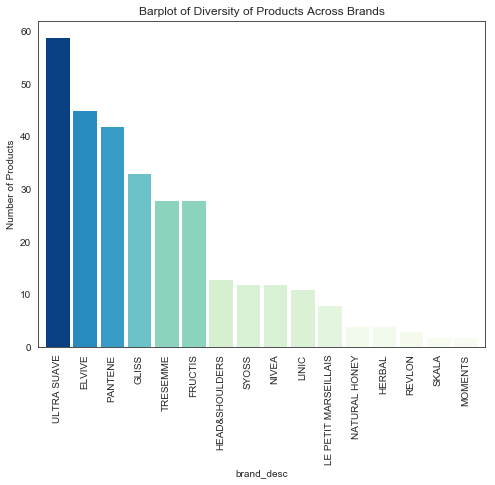

In [6]:
## How many products are there in each brand?
sns.set_style("white")
t = target.groupby('brand_desc').prod_id.nunique().sort_values(ascending = False)

norm = mpl.colors.Normalize(vmin=t.min(), vmax=t.max())
cmap = cm.GnBu
x = t.values
m = cm.ScalarMappable(norm=norm, cmap=cmap)
c = m.to_rgba(x)

t.plot(kind='bar', color = c, figsize=(8, 6), grid=False, width = 0.9)
plt.title('Barplot of Diversity of Products Across Brands')
plt.ylabel('Number of Products')
print(t)
plt.show()

brand_desc
ELVIVE                  90497.32
PANTENE                 89759.62
ULTRA SUAVE             88112.92
TRESEMME                50591.62
FRUCTIS                 40833.22
GLISS                   40307.58
HEAD&SHOULDERS          27956.89
LINIC                   26126.87
NIVEA                   16056.43
SYOSS                   14658.65
LE PETIT MARSEILLAIS     9026.76
NATURAL HONEY            3064.80
HERBAL                   2898.49
REVLON                   2092.47
SKALA                    1192.40
MOMENTS                  1122.34
Name: tran_prod_paid_amt, dtype: float64


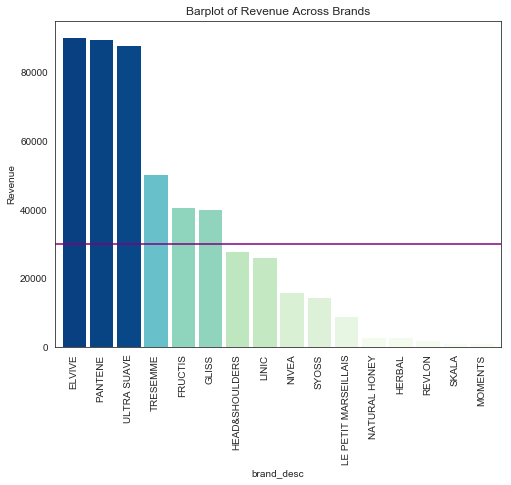

In [7]:
# Revenue
sns.set_style("white")
target_revenue = target.groupby('brand_desc').tran_prod_paid_amt.sum().sort_values(ascending = False)

norm = mpl.colors.Normalize(vmin=target_revenue.min(), vmax=target_revenue.max())
cmap = cm.GnBu
x = target_revenue.values
m = cm.ScalarMappable(norm=norm, cmap=cmap)
c = m.to_rgba(x)

target_revenue.plot(kind='bar', color = c, figsize=(8, 6), grid=False, width = 0.9)
plt.title('Barplot of Revenue Across Brands')
plt.ylabel('Revenue')
plt.axhline(y=30000, color='purple')
print(target_revenue)
plt.show()

In [8]:
## Narrow down the brands to be selected to brands with 30000+ revenue, we have top 6 brands
target_brands = target[target.brand_desc.isin(target_revenue[target_revenue.values > 30000].index)]

brand_desc
ULTRA SUAVE    5091
PANTENE        4637
ELVIVE         4550
GLISS          3574
FRUCTIS        3411
TRESEMME       2824
Name: cust_id, dtype: int64


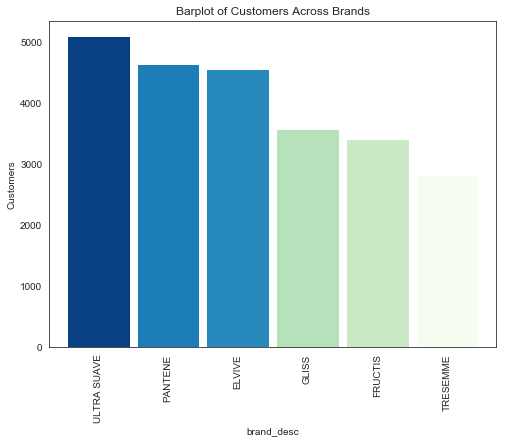

In [9]:
# Customers
sns.set_style("white")
target_cust = target_brands.groupby('brand_desc').cust_id.nunique().sort_values(ascending = False)

norm = mpl.colors.Normalize(vmin=target_cust.min(), vmax=target_cust.max())
cmap = cm.GnBu
x = target_cust.values
m = cm.ScalarMappable(norm=norm, cmap=cmap)
c = m.to_rgba(x)

target_cust.plot(kind='bar', color = c, figsize=(8, 6), grid=False, width = 0.9)
plt.title('Barplot of Customers Across Brands')
plt.ylabel('Customers')
print(target_cust)
plt.show()

##### 2.1.2 Performance over time

In [10]:
target_brands.to_csv('target_brands.csv', index = False)

For this section, please refer to Tableau file.
<br>
**2.1.2 Performance over time** shows quantities sold and revenue performance over time; there is an downward trend for ELVIVE.

##### 2.1.3 Price range

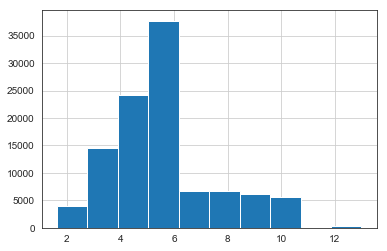

In [11]:
# Distribution regardless of brands
target_brands.prod_unit_price.hist() # most scans are from products between 4 to 6

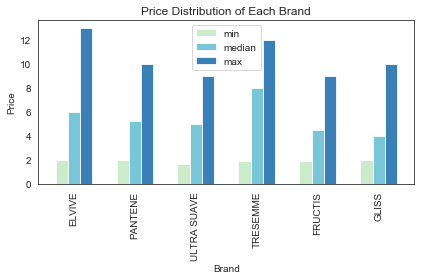

In [12]:
# Distribution within each brand
t = target_brands.groupby('brand_desc').prod_unit_price.agg({'min': 'min', 'median': 'median', 'max': 'max'})
reorderlist = target_revenue[target_revenue.values > 30000].index
t = t.reindex(reorderlist)

# data to plot
norm = mpl.colors.Normalize(vmin=0, vmax=1)
m = cm.ScalarMappable(norm=norm, cmap=cmap)

n_groups = 6
min_p = t['min'].values
median_p = t['median'].values
max_p = t['max'].values
 
# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.2
opacity = 0.8

rects1 = plt.bar(index, min_p, bar_width,
alpha=opacity,
color= m.to_rgba(0.3), 
label='min')
 
rects2 = plt.bar(index + bar_width, median_p, bar_width,
alpha=opacity,
color=m.to_rgba(0.6),
label='median')

rects3 = plt.bar(index + 2*bar_width, max_p, bar_width,
alpha=opacity,
color=m.to_rgba(0.9),
label='max')
 
plt.xlabel('Brand')
plt.ylabel('Price')
plt.title('Price Distribution of Each Brand')
plt.xticks(index + bar_width, t.index, rotation = 90)
plt.legend()

plt.tight_layout()
plt.show()

TRESEMME is a relatively high-end brand.
<br>
The others are similar except for ELVIVE which has most expensive products.
<br>
Three price levels are set: <4 (low), between 4 and 6 (medium), >6 (expensive)

In [13]:
# how much revenue is generated from each price level?

please refer to Tableau for this question.
<br>
**2.1.3 Price range ratio** shows for each brand, how many units are sold and how much revenue comes from different price levels.
<br>
- ELVIVE and PANTENE gained most revenue from medium-priced products;
- ULTRA SUAVE and FRUCTIS relied on both cheapest and medium-priced products;
- TRESEMME is a luxury brand and most expensive products dominated its revenue;
- GLISS was focused on cheapest products.

In [14]:
# What is the relationship between promotions, price level and units sold (demand)?

please refer to Tableau for this question.
<br>
**2.1.3 Price range promotion** shows for each brand, shows change in demand over time when the discount level for a specific price level drops or increases.
<br>
- from March to May in 2017, it is abnormal that the discount level is 0 for every product.
- It makes sense when the discount is increased, the demand for products go up as well.
- Generally even small changes in the discount value will cause rapid fluctuations for products with medium prices.

#### 2.2 Understand customers

##### 2.2.1 Number of brands

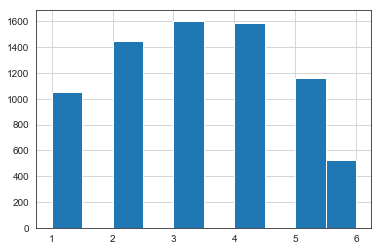

In [15]:
# How many brands does each customer buy?
target_brands.groupby('cust_id').brand_desc.nunique().hist()

In [16]:
target_brands.category_desc_eng.unique()

array(['HAIR CONDITIONERS', 'SHAMPOO'], dtype=object)

##### 2.2.2 Shampoo and Conditioner transactions

In [17]:
print('All:', target_brands.tran_id.nunique()) # 83385 are all the transactions with shampoos or conditioners

# Among all the transactions, how many contain shampoos?
print('Shampoo transactions:', target_brands.loc[target_brands.category_desc_eng == 'SHAMPOO', ].tran_id.nunique())

# Among all the transactions, how many contain conditioners?
print('Conditioner transactions:', target_brands.loc[target_brands.category_desc_eng == 'HAIR CONDITIONERS', ].tran_id.nunique())

# Among all the transactions, how many contain both shampoos and conditioners?
t = target_brands.groupby('tran_id').category_desc_eng.nunique()
t = t[t.values == 2]
print('Both shampoo and conditioner transactions:', t.shape[0])

All: 83385
Shampoo transactions: 60460
Conditioner transactions: 37489
Both shampoo and conditioner transactions: 14564


##### 2.2.3 Transactions and promotions

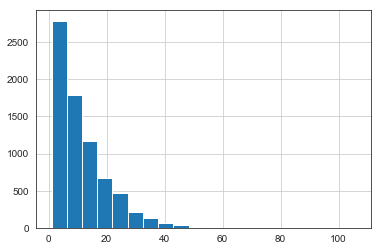

In [18]:
# How many transactions each customer has with shampoos or conditioners?
trans = target_brands.groupby('cust_id').tran_id.nunique()
trans.hist(bins = 20)

In [19]:
target_brands.head()

,prod_id,brand_desc,category_desc_eng,cust_id,tran_dt,store_id,prod_unit,tran_prod_sale_amt,tran_prod_sale_qty,tran_prod_discount_amt,tran_prod_offer_cts,tran_prod_paid_amt,prod_unit_price,tran_id
0,999153511,ULTRA SUAVE,HAIR CONDITIONERS,369985,2017-12-15,192,CT,2.64,1.0,0.00,0,2.64,2.64,2017-12-15_369985_192
1,999153511,ULTRA SUAVE,HAIR CONDITIONERS,559947,2017-07-11,301,CT,2.64,1.0,0.00,0,2.64,2.64,2017-07-11_559947_301
2,999153511,ULTRA SUAVE,HAIR CONDITIONERS,559947,2017-08-18,301,CT,2.64,1.0,0.00,0,2.64,2.64,2017-08-18_559947_301
3,999153511,ULTRA SUAVE,HAIR CONDITIONERS,589766,2017-07-14,509,CT,2.64,1.0,0.00,0,2.64,2.64,2017-07-14_589766_509
4,999153511,ULTRA SUAVE,HAIR CONDITIONERS,879894,2017-08-14,504,CT,5.29,1.0,-2.65,1,2.64,5.29,2017-08-14_879894_504


In [20]:
# How many scans each customer has with promotions?
promo_scans = target_brands.loc[target_brands.tran_prod_offer_cts > 0, ].groupby('cust_id').size().to_frame('promo').reset_index()
all_scans = target_brands.groupby('cust_id').size().to_frame('all').reset_index()
cust_scans = pd.merge(all_scans, promo_scans, on = 'cust_id', how = 'left').fillna(0)

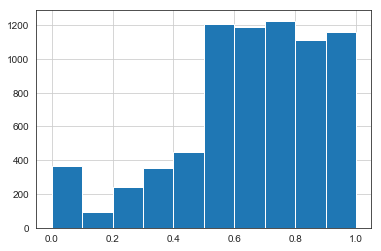

In [21]:
cust_scans['promo_ratio'] = cust_scans['promo']/cust_scans['all']
cust_scans['promo_ratio'].hist()

#### 2.4 Roughly segment the customers

roughly segment the customers with the attributes below:
<br>
attributes: trans, number of brands, shampoo units, conditioner units, low price units, medium price units, high price units, promo ratio in scans

**Objective**: we want to target customers who favor promotions instead of those who do not require promotions to buy the products. 
<br>

**Practice**: we use a few attributes to first segment customers. The features we utilize include number of transactions, number of brands, shampoo units, conditioner units, low-price item units, medium-price item units, high-price item units and their propensity to buying on-sale products from scan history. This method captures customers' similarity with their normal behavior. Otherwise, if we promote products to customers who do not require discounts to buy it, they may not be interested in this deal at all or take advantage of the discounts because they will buy it anyway. Either way will bring no benefits to the company.

In [22]:
# make a dataframe
## trans and number of brands

t = target_brands.groupby('cust_id').agg({'tran_id':'nunique', 'brand_desc':'nunique'}).reset_index()
t.columns = ['cust_id', 'trans', 'brands']
t = t.set_index('cust_id')

In [23]:
target_brands.columns

Index(['prod_id', 'brand_desc', 'category_desc_eng', 'cust_id', 'tran_dt',
       'store_id', 'prod_unit', 'tran_prod_sale_amt', 'tran_prod_sale_qty',
       'tran_prod_discount_amt', 'tran_prod_offer_cts', 'tran_prod_paid_amt',
       'prod_unit_price', 'tran_id'],
      dtype='object')

In [24]:
## shampoo units and conditioner units

units_category = target_brands.groupby(['cust_id', 'category_desc_eng']).tran_prod_sale_qty.sum()
units_category = units_category.unstack(level = -1).fillna(0)
units_category = units_category[['SHAMPOO', 'HAIR CONDITIONERS']]
units_category.columns = ['shampoo_units', 'conditioner_units']
units_category = units_category.reset_index()
units_category = units_category.set_index('cust_id')

In [25]:
## price units
### a small problem: a product could has multiple prices.

## this is based on price distribution
target_brands.loc[target_brands.prod_unit_price < 3.99, 'price_level'] = 'Low' 
target_brands.loc[(target_brands.prod_unit_price >= 3.99) & (target_brands.prod_unit_price <= 6), 'price_level'] = 'Medium'
target_brands.loc[target_brands.prod_unit_price > 6, 'price_level'] = 'High'

units_price = target_brands.groupby(['cust_id', 'price_level']).tran_prod_sale_qty.sum()
units_price = units_price.unstack(level = -1).fillna(0)
units_price = units_price[['Low', 'Medium', 'High']]
units_price.columns = ['low_units', 'medium_units', 'high_units']
units_price = units_price.reset_index()
units_price = units_price.set_index('cust_id')

In [26]:
## promo ratio
cust_scans = cust_scans.set_index('cust_id')

In [27]:
## combine all three tables
df = pd.concat([t, units_category, units_price, cust_scans[['promo_ratio']]], axis = 1)

In [28]:
df

,trans,brands,shampoo_units,conditioner_units,low_units,medium_units,high_units,promo_ratio
cust_id,,,,,,,,
29568,12,2,12.0,8.0,11.0,8.0,1.0,0.631579
29909,19,3,14.0,5.0,2.0,17.0,0.0,0.684211
39774,17,6,9.0,17.0,2.0,9.0,15.0,0.739130
39856,3,2,3.0,1.0,0.0,4.0,0.0,1.000000
109693,17,3,14.0,10.0,9.0,10.0,5.0,0.590909
119781,5,1,5.0,0.0,3.0,2.0,0.0,0.400000
139662,10,2,10.0,0.0,6.0,4.0,0.0,0.100000
169587,3,2,1.0,2.0,2.0,0.0,1.0,0.666667
169648,6,2,6.0,0.0,1.0,4.0,1.0,0.666667


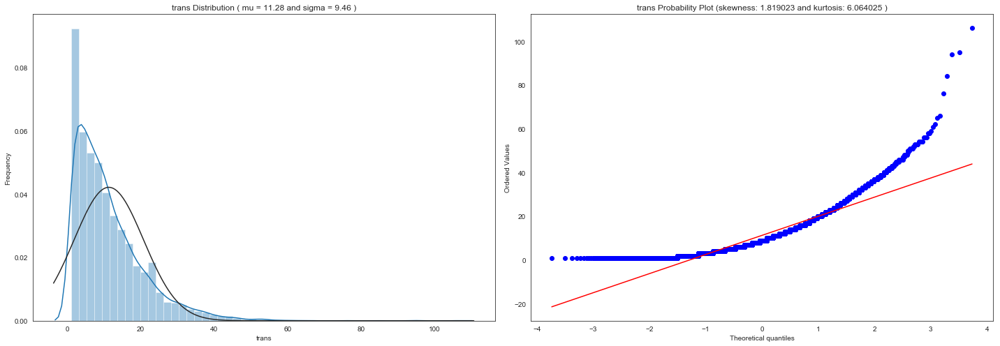

None


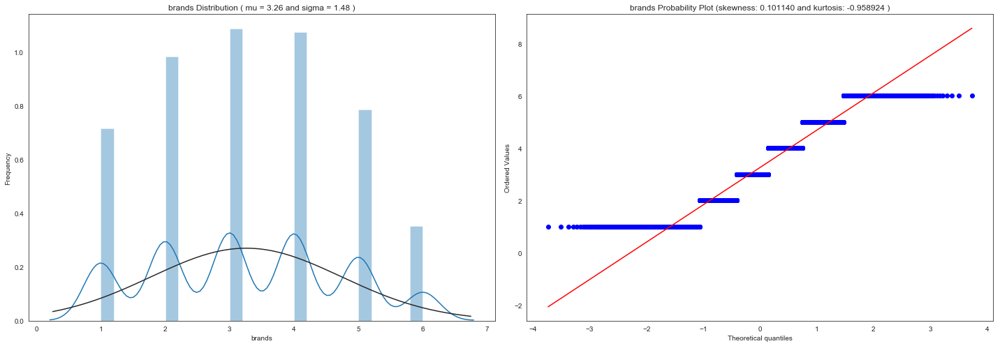

None


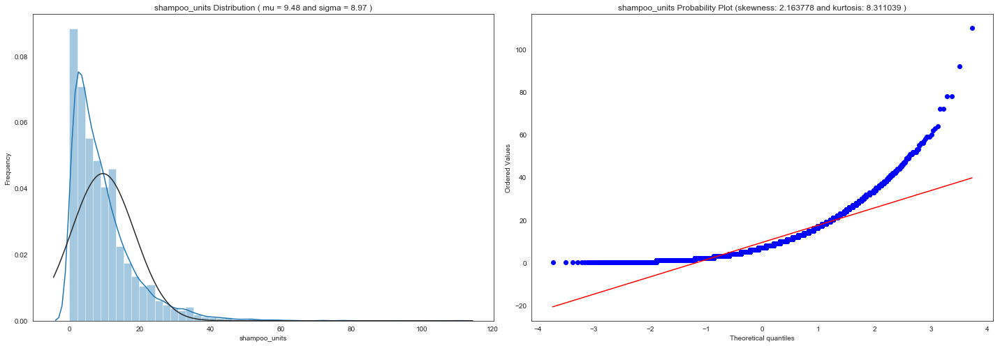

None


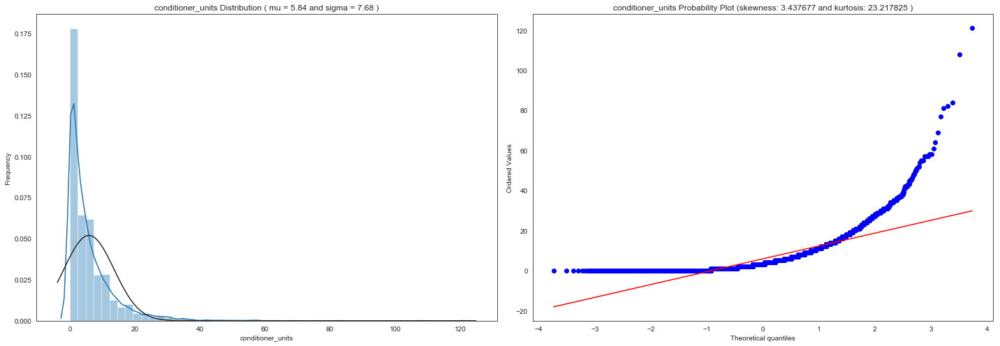

None


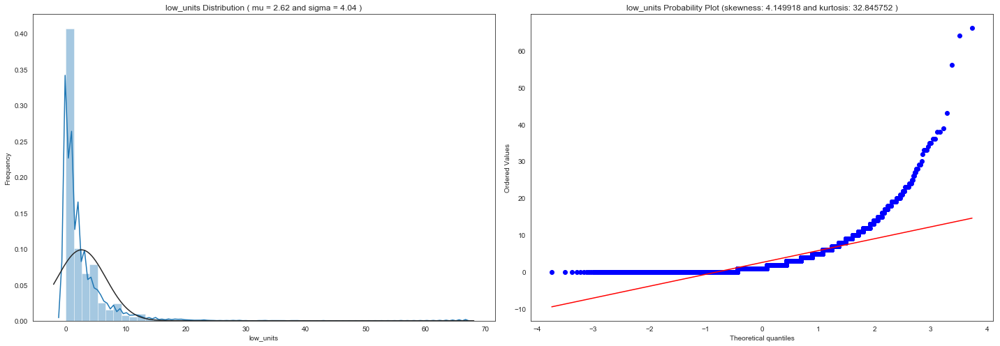

None


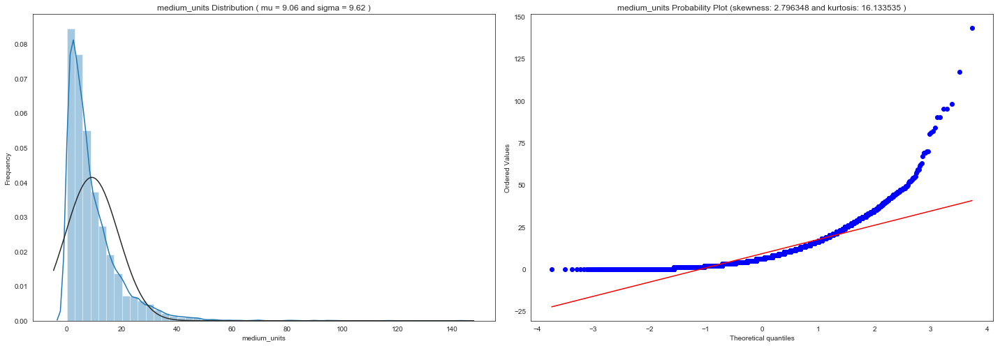

None


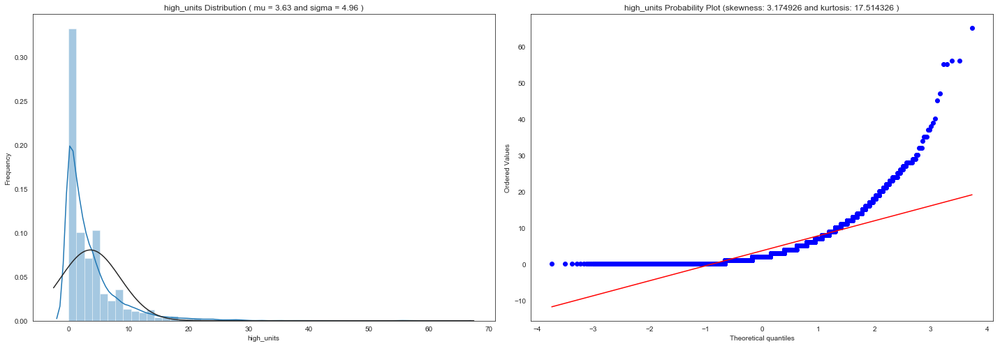

None


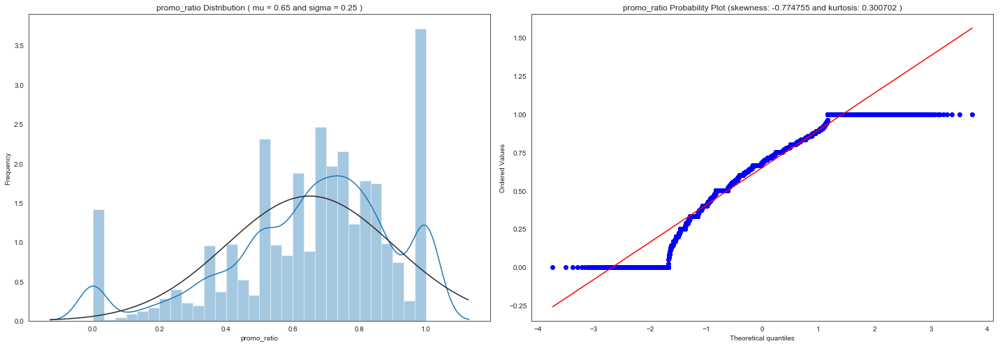

None


In [29]:
# Clustering analysis
## PLot a distribution and Q-Q plot to identify departures from normality
## K means++ can adjust skewness by itself

import matplotlib.pyplot as plt
from scipy.stats import skew, norm, probplot, boxcox
import seaborn as sns

def QQ_plot(data, measure):
    fig = plt.figure(figsize=(20,7))

    #Get the fitted parameters used by the function
    (mu, sigma) = norm.fit(data)

    #Kernel Density plot
    fig1 = fig.add_subplot(121)
    sns.distplot(data, fit=norm)
    fig1.set_title(measure + ' Distribution ( mu = {:.2f} and sigma = {:.2f} )'.format(mu, sigma), loc='center')
    fig1.set_xlabel(measure)
    fig1.set_ylabel('Frequency')

    #QQ plot
    fig2 = fig.add_subplot(122)
    res = probplot(data, plot=fig2)
    fig2.set_title(measure + ' Probability Plot (skewness: {:.6f} and kurtosis: {:.6f} )'.format(data.skew(), data.kurt()), loc='center')

    plt.tight_layout()
    plt.show()

for i in df.columns:
    print(QQ_plot(df[i], i))

In [30]:
## Standardization
features = df.columns.tolist()

## standarize all columns
from sklearn import preprocessing

features_std = [feature for feature in features]
scaler = preprocessing.StandardScaler().fit(df[features_std])
df_std = scaler.transform(df[features_std])

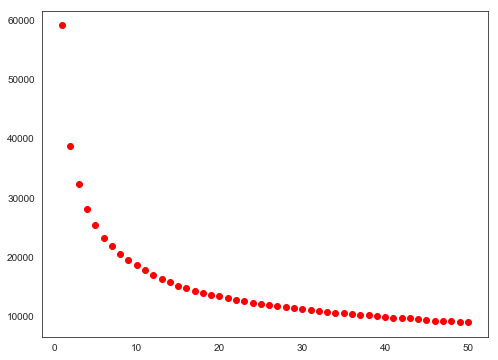

The best K suggest:  4


In [31]:
## K Clustering

from sklearn.cluster import KMeans

cl = 50
# set threshold at 10%, if as k increases
corte = 0.1
# set a number for cost function
anterior = 100000000000000
cost = [] 
K_best = cl

for k in range (1, cl+1):
    # Create a kmeans model on our data, using k clusters.  random_state helps ensure that the algorithm returns the same results each time.
    model = KMeans(
        n_clusters=k, 
        # start with k-means++
        init='k-means++', #'random',
        n_init=10,
        max_iter=300,
        tol=1e-04,
        random_state=101)

    model = model.fit(df_std)

    # These are our fitted labels for clusters -- the first cluster has label 0, and the second has label 1.
    labels = model.labels_
 
    # Sum of distances of samples to their closest cluster center
    # Elbow method for selecting the optimal number of clusters
    interia = model.inertia_
    if (K_best == cl) and (((anterior - interia)/anterior) < corte): 
        K_best = k - 1
    cost.append(interia)
    anterior = interia

plt.figure(figsize=(8, 6))
plt.scatter(range (1, cl+1), cost, c='red')
plt.show()

print('The best K suggest: ', K_best)

In [32]:
## silhouette_score
from sklearn.metrics import silhouette_samples, silhouette_score
model = KMeans(n_clusters=K_best, init='k-means++', n_init=10, max_iter=300, tol=1e-04, random_state=41)
model = model.fit(df_std)

labels = model.labels_

silhouette_score(X = df_std, labels = model.fit_predict(df_std))

0.2388180243883516

In [33]:
## centroids
import numpy as np

print("Centers of each cluster:")
cent_transformed = scaler.inverse_transform(model.cluster_centers_)
print(pd.DataFrame(cent_transformed,columns=df.columns))

Centers of each cluster:
       trans    brands  shampoo_units  conditioner_units  low_units  \
0  32.123209  4.694842      27.455587          21.001433   8.924069   
1  15.354371  4.314387      12.914935           7.652685   3.308114   
2   5.465320  2.465701       4.508384           2.353659   0.876905   
3   4.912986  2.197759       4.055372           1.827950   1.595913   

   medium_units  high_units  promo_ratio  
0     28.426934   11.106017     0.671305  
1     12.173657    5.085849     0.676982  
2      4.169207    1.815930     0.825590  
3      3.393540    0.893869     0.295759  


In [34]:
## how many customers are there in each cluster
pd.Series(labels).value_counts()

2    2624
1    2551
3    1517
0     698
dtype: int64

In [35]:
## go back to brands
labels = pd.DataFrame(labels).set_index(df.index)
labels = labels.reset_index()
labels.columns = ['cust_id', 'cust_label']

In [36]:
target_brands = pd.merge(target_brands, labels, on = 'cust_id')

In [37]:
target_brands.groupby(['brand_desc', 'cust_label']).cust_id.nunique().unstack(level = -1).reindex(reorderlist)

cust_label,0,1,2,3
brand_desc,,,,
ELVIVE,607,2110,1174,659
PANTENE,596,2044,1301,696
ULTRA SUAVE,648,2188,1415,840
TRESEMME,426,1376,769,253
FRUCTIS,491,1599,813,508
GLISS,509,1689,998,378


### 3. Decide the brand and promote to customers

- Target Segment 0 with promotions
- Apply User-based collaborative filtering to predict 'probability' (the ratio of similar customers who ever bought the product when the product is onsale)
- Based on transaction history, decide on discount level and make assumptions about pocket margin to get COGS
- Based on transaction history, get the normal price of each product
- Estimate expected profit from each product on promotion by (normal_price * 0.5 - COGS) * pred
- Get a list of top one product for each customer that will bring most expected profits
- Group by brands, sum up expected profits for each brand to choose a brand
- In the scope of this brand, decide on the product to be promoted to each customer
- Estimate redemption cost and incremental volumes

#### 3.1 Target Segment 0 with promotions

We decide to target segment 0 which is made up of 698 customers. This is because

- They are the most loyal customers in the shampoo and conditioners category to the store especially from their transactions (centroid: 32), the shampoo and conditioner units they bought (centroid: shampoo: 27; conditioner: 21). It is worthwhile to retain these customers by offering promotions to them.
<br>
- They have on average (approximately from centroid) bought about 4.7 brands, which means they like to explore different brands, try different products. We could provide them with promotions on products they have never used which they might be likely to try. This will in turn bring incremental sales.
<br>
- Promo_ratio, which represents times of scans with promotions out of all the scans in their transaction history, is about 67.1% for them. These customers have most of their scans attached with promotions. Therefore, promoting products to these customers will be efficient.


In [38]:
# How has brands promoted their products?
target_brands['promo_level'] = -target_brands['tran_prod_discount_amt']/target_brands['tran_prod_sale_amt']

In [43]:
section_0 = target_brands.loc[target_brands.cust_label == 0, ]

section_0['buy_if_promo'] = section_0['tran_prod_offer_cts'] > 0
section_0['buy_if_promo'] = section_0['buy_if_promo'].astype('int')

#### 3.2 User-based collaborative filtering

Before picking a brand, we need to estimate probabilities of each customer buying a specific product. User-based KNN collaborative filtering is utilized with the package 'surprise' in Python. This method is mostly used in rating predictions. To accommodate the method in our problem, the value we put in the model will be 1 for a customer having ever bought a product on sale and 0 otherwise. In this segment, we think the customers are similar in the regards of the attributes we use for segmentation. Among these customers, for each of them, we find the 25 (approximately the square root of number of customers) nearest neighbors who resemble this customer in terms of their preference of specific products. In order to predict whether a customer will buy a particular product, we will take the fraction of his neighbors who have ever bought the product on sale out of 25. We assume that if enough similar customers ever bought this product on sale, the target customer will be likely to buy it on sale as well. The number we get is not probability by nature, but it can be used as a proxy in terms of how likely a customer will buy this product.
	
We tried both KNNBasic and KNNWithMeans, KNNWithMeans works better to recall enough customers who actually bought this product for at least once. If we use a threshold of 0.2, out of all the combinations of customers and products with value being 1, the model can recall more than 99% of this combinations. With regard to combinations with value being 0 in the input, meaning the customer has never bought this product on sale, we predict that about 2% of these combinations will turn 1 later.

In [45]:
# build the structure of cust + prod, use cross join
cust = pd.DataFrame({'cust_id' : section_0.cust_id.unique(), 'key' : np.repeat(1, len(section_0.cust_id.unique()))})
prod = pd.DataFrame({'prod_id' : section_0.prod_id.unique(), 'key' : np.repeat(1, len(section_0.prod_id.unique()))})

cust_prod = pd.merge(cust, prod, how = 'inner', on = 'key')

cust_prod.drop('key', axis = 1, inplace = True)

matrix_0 = pd.merge(cust_prod, 
                     section_0.groupby(['cust_id', 'prod_id']).buy_if_promo.max().to_frame('ever_buy_on_sale').reset_index(),
                     how = 'left',
                     on = ['cust_id', 'prod_id']).fillna(0)

In [46]:
# there are 698 customers in segment 0
tmp = matrix_0

# use packeage 'surprise'

from surprise import NormalPredictor
from surprise import Dataset
from surprise import Reader
from surprise.model_selection import cross_validate

# A reader is still needed but only the rating_scale param is requiered.
reader = Reader(rating_scale=(0, 1))

# The columns must correspond to user id, item id and ratings (in that order).
data = Dataset.load_from_df(tmp[['cust_id', 'prod_id', 'ever_buy_on_sale']], reader)

from surprise import KNNWithMeans
from surprise import Dataset

# Retrieve the trainset, the full data set
trainset = data.build_full_trainset()

# Build an algorithm, and train it.
algo = KNNWithMeans(k=25, sim_options={'name': 'pearson_baseline', 'user_based': True}) # 25 is approximately square root of n
algo.fit(trainset)

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.


In [47]:
# predict probabilities

res_section_0 = matrix_0.copy()
for uid in matrix_0.cust_id.unique():
    for iid in matrix_0.prod_id.unique():
        pred = algo.predict(uid, iid, verbose=True)
        res_section_0.loc[(res_section_0.cust_id == uid) & (res_section_0.prod_id == iid), 'pred'] = pred.est

user: 559947     item: 999153511  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999153512  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999160499  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999160568  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999164154  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999176962  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999178741  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999180001  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999181337  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999183935  r_ui = None   est = 0.47   {'actual_k':

user: 559947     item: 999184923  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999184925  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999186272  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999197196  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999203397  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999233972  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999233974  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999267451  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999275965  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 559947     item: 999367340  r_ui = None   est = 0.14   {'actual_k':

user: 1179654    item: 999246830  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999250161  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999250162  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999264512  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999273557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999273558  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999308269  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999308270  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999391026  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999391035  r_ui = None   est = 0.00   {'actual_k':

user: 1179654    item: 999153661  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999166161  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999178726  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999183934  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999226067  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999236843  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999238892  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999241750  r_ui = None   est = 0.03   {'actual_k':

user: 1179654    item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999239820  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999269464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999328062  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999391038  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999154430  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1179654    item: 999571195  r_ui = None   est = 0.13   {'actual_k':

user: 1309902    item: 999327519  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999391027  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999153662  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999161697  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999163928  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999178715  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999178720  r_ui = None   est = 0.02   {'actual_k':

user: 1309902    item: 999294936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999257748  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999239818  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999327325  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999158691  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999180573  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1309902    item: 999248700  r_ui = None   est = 0.00   {'actual_k':

user: 2039621    item: 999250162  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999264512  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999273557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999273558  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999308269  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999308270  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999391026  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999391035  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999391039  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999476721  r_ui = None   est = 0.15   {'actual_k':

user: 2039621    item: 999476718  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999508823  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999161694  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999186556  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999186557  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999193811  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999246832  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999250164  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999253979  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999346503  r_ui = None   est = 0.05   {'actual_k':

user: 2039621    item: 999170234  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999195412  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999391021  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999178698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999234259  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999266408  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999155422  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999327524  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999239870  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 2039621    item: 999233737  r_ui = None   est = 0.02   {'actual_k':

user: 3879781    item: 999239800  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999239806  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999241462  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999248701  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999272007  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999273562  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999273573  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999337516  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999338182  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999427912  r_ui = None   est = 0.16   {'actual_k':

user: 3879781    item: 999273572  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999512604  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999168518  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999195411  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999327531  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999163934  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999163942  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999170233  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999184916  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 3879781    item: 999273564  r_ui = None   est = 0.02   {'actual_k':

user: 4139823    item: 999179444  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999186271  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999239819  r_ui = None   est = 0.75   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999239869  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999241465  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999250165  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999266493  r_ui = None   est = 0.83   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999273559  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999273570  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999273571  r_ui = None   est = 0.14   {'actual_k':

user: 4139823    item: 999176963  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999224761  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999254032  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999254033  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999269459  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999272001  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999329220  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999338184  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999378960  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 4139823    item: 999459175  r_ui = None   est = 0.13   {'actual_k':

user: 4179994    item: 999153512  r_ui = None   est = 0.62   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999160568  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999176962  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999178741  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999180001  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999181337  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999183935  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999183936  r_ui = None   est = 0.14   {'actual_k':

user: 4179994    item: 999184923  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999184925  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999186272  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999197196  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999203397  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999233972  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999233974  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999275965  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999367340  r_ui = None   est = 0.03   {'actual_k':

user: 4179994    item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999273564  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999155421  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4179994    item: 999269464  r_ui = None   est = 0.03   {'actual_k':

user: 6069830    item: 999193886  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999224762  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999234011  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999234289  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999239808  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999239857  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999240850  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999246829  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999327324  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999327519  r_ui = None   est = 0.01   {'actual_k':

user: 6069830    item: 999236956  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999269460  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999269465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999294936  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999257748  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999269463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999226727  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999239818  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999327325  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 6069830    item: 999158691  r_ui = None   est = 0.01   {'actual_k':

user: 8279980    item: 999239813  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999239817  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999239858  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999239868  r_ui = None   est = 0.77   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999240254  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999240851  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999240852  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999241749  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999246830  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999250161  r_ui = None   est = 0.52   {'actual_k':

user: 8279980    item: 999241750  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999266409  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999273565  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999476718  r_ui = None   est = 0.62   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999508823  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999161694  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999186556  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999186557  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999193811  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999246832  r_ui = None   est = 0.10   {'actual_k':

user: 8279980    item: 999266408  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999155422  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999327524  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999239870  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999233737  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999471488  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999266418  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999155420  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999163935  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 8279980    item: 999164156  r_ui = None   est = 0.09   {'actual_k':

user: 8329909    item: 999178715  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999178720  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999178742  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999184259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999184922  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999186282  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999226767  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999236867  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999239765  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999239800  r_ui = None   est = 0.00   {'actual_k':

user: 8329909    item: 999308268  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999391023  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999391040  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999180036  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999241463  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999241464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999273574  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8329909    item: 999391022  r_ui = None   est = 0.05   {'actual_k':

user: 8399671    item: 999264512  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999273557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999273558  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999308269  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999308270  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999391026  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999391035  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999391039  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999476721  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999561029  r_ui = None   est = 0.07   {'actual_k':

user: 8399671    item: 999476718  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999508823  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999161694  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999186557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999193811  r_ui = None   est = 0.60   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999250164  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999253979  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999346503  r_ui = None   est = 0.05   {'actual_k':

user: 8399671    item: 999328062  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999391038  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999154430  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999224567  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999371323  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999571195  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999571194  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8399671    item: 999186274  r_ui = None   est = 0.00   {'actual_k':

user: 9019954    item: 999178742  r_ui = None   est = 0.58   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999184259  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999184922  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999186282  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999226767  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999236867  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999239765  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999239800  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999239806  r_ui = None   est = 0.62   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999241462  r_ui = None   est = 0.05   {'actual_k':

user: 9019954    item: 999272008  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999343193  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999184917  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999246780  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999246781  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999273561  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999273572  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999512604  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999168518  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9019954    item: 999195411  r_ui = None   est = 0.11   {'actual_k':

user: 9339837    item: 999267451  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999367340  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999459174  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999459254  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999942289  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999153661  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999166161  r_ui = None   est = 0.43   {'actual_k':

user: 9339837    item: 999328062  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999391038  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999154430  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999224567  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999371323  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999571195  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999571194  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9339837    item: 999186274  r_ui = None   est = 0.00   {'actual_k':

user: 9469815    item: 999154976  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999161697  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999163254  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999163928  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999164128  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999178715  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999178720  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999178742  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999184259  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999184922  r_ui = None   est = 0.48   {'actual_k':

user: 9469815    item: 999236956  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999269460  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999269465  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999294936  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999257748  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999269463  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999226727  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999239818  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999327325  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 9469815    item: 999158691  r_ui = None   est = 0.29   {'actual_k':

user: 9949606    item: 999153511  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999153512  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999160499  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999160568  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999164154  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999176962  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999178741  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999180001  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999181337  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999183935  r_ui = None   est = 0.02   {'actual_k':

user: 9949606    item: 999154972  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999154978  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999164152  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999164153  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999183933  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999184923  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999184925  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999186272  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999197196  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999203397  r_ui = None   est = 0.11   {'actual_k':

user: 9949606    item: 999180036  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999241463  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999241464  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999273574  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999391022  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999161698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999272008  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999343193  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999184917  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 9949606    item: 999246780  r_ui = None   est = 0.08   {'actual_k':

user: 10499784   item: 999273557  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999273558  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999308269  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999308270  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999391026  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999391035  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999391039  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999476721  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999561029  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999163815  r_ui = None   est = 0.07   {'actual_k':

user: 10499784   item: 999164130  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999166161  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999178726  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999183934  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999226067  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999236843  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999238892  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999241750  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999266409  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999273565  r_ui = None   est = 0.04   {'actual_k':

user: 10499784   item: 999186273  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999266417  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999186274  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999159785  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999159786  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999179433  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999234241  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999234253  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999186280  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10499784   item: 999391024  r_ui = None   est = 0.04   {'actual_k':

user: 11609958   item: 999193886  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999224762  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999234011  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999234289  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999239808  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999239857  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999240850  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999246829  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999327324  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999327519  r_ui = None   est = 0.07   {'actual_k':

user: 11609958   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999236956  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999294936  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999257748  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999269463  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999226727  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 11609958   item: 999239818  r_ui = None   est = 0.16   {'actual_k':

user: 12189975   item: 999183936  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999239775  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999239795  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999239813  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999239817  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999239858  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999239868  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999240254  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999240851  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999240852  r_ui = None   est = 0.10   {'actual_k':

user: 12189975   item: 999942289  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999153661  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999160507  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999164130  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999166161  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999178726  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999183934  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999226067  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999236843  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999238892  r_ui = None   est = 0.04   {'actual_k':

user: 12189975   item: 999371323  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999571195  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999571194  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999186273  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999266417  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999186274  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999159785  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999159786  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999179433  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12189975   item: 999234241  r_ui = None   est = 0.01   {'actual_k':

user: 12389800   item: 999184918  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999184924  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999224762  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999234011  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999234289  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999239808  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999239857  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999240850  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999246829  r_ui = None   est = 0.29   {'actual_k':

user: 12389800   item: 999329220  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999338184  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999378960  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999459175  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999471439  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999476720  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999186270  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999236956  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 12389800   item: 999269460  r_ui = None   est = 0.01   {'actual_k':

user: 13439986   item: 999239775  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999239795  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999239813  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999239817  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999239858  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999239868  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999240254  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999240851  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999240852  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999241749  r_ui = None   est = 0.19   {'actual_k':

user: 13439986   item: 999942289  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999153661  r_ui = None   est = 0.73   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999160507  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999166161  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999178726  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999183934  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999226067  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999236843  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999238892  r_ui = None   est = 0.00   {'actual_k':

user: 13439986   item: 999571194  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999186273  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999159785  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999159786  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999179433  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999234241  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999234253  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13439986   item: 999186280  r_ui = None   est = 0.02   {'actual_k':

user: 13559579   item: 999236867  r_ui = None   est = 0.60   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999239765  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999239800  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999239806  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999241462  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999248701  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999272007  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999273562  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999273573  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999337516  r_ui = None   est = 0.01   {'actual_k':

user: 13559579   item: 999239826  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999248700  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999262036  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999308268  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999391023  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999391040  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999155424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999177880  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999180036  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13559579   item: 999241463  r_ui = None   est = 0.08   {'actual_k':

user: 13889806   item: 999308269  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999308270  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999391026  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999391035  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999391039  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999476721  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999561029  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999163815  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999173662  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999179444  r_ui = None   est = 0.12   {'actual_k':

user: 13889806   item: 999164130  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999166161  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999178726  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999183934  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999226067  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999236843  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999238892  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999241750  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999266409  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999273565  r_ui = None   est = 0.05   {'actual_k':

user: 13889806   item: 999273569  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999234010  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999239821  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999155421  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999170232  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999239820  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999269464  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999294784  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999328062  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13889806   item: 999391038  r_ui = None   est = 0.08   {'actual_k':

user: 14999933   item: 999241465  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999250165  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999266493  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999273559  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999273570  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999273571  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999327528  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999571192  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999161696  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999173631  r_ui = None   est = 0.39   {'actual_k':

user: 14999933   item: 999186556  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999186557  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999193811  r_ui = None   est = 0.67   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999246832  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999250164  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999253979  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999346503  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999346504  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999161699  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999176964  r_ui = None   est = 0.61   {'actual_k':

user: 14999933   item: 999154430  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999224567  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999371323  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999571195  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999571194  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999186273  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999266417  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999186274  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999159785  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 14999933   item: 999159786  r_ui = None   est = 0.04   {'actual_k':

user: 16709903   item: 999184918  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999184924  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999193886  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999224762  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999234011  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999234289  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999239808  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999239857  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999240850  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999246829  r_ui = None   est = 0.14   {'actual_k':

user: 16709903   item: 999176963  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999224761  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999254032  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999254033  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999269459  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999272001  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999329220  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999338184  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999378960  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999459175  r_ui = None   est = 0.00   {'actual_k':

user: 16709903   item: 999163935  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999233973  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16709903   item: 999239809  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999153511  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999153512  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999160499  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999160568  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999164154  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999176962  r_ui = None   est = 0.13   {'actual_k':

user: 17829579   item: 999186272  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999197196  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999203397  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999233972  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999233974  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999267451  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999275965  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999367340  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999459174  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999459254  r_ui = None   est = 0.14   {'actual_k':

user: 17829579   item: 999184917  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999246780  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999246781  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999273561  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999512604  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999195411  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999327531  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 17829579   item: 999163934  r_ui = None   est = 0.02   {'actual_k':

user: 19199994   item: 999239819  r_ui = None   est = 0.71   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999239869  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999241465  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999250165  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999266493  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999273559  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999273570  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999273571  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999327528  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999571192  r_ui = None   est = 0.12   {'actual_k':

user: 19199994   item: 999195412  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999391021  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999178698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999234259  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999266408  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999155422  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999327524  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999239870  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999233737  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 19199994   item: 999471488  r_ui = None   est = 0.03   {'actual_k':

user: 21439812   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999163254  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999163928  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999178715  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999178720  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999178742  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999184259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999184922  r_ui = None   est = 0.12   {'actual_k':

user: 21439812   item: 999391040  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999155424  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999180036  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999241463  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999241464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999273574  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999391022  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21439812   item: 999272008  r_ui = None   est = 0.02   {'actual_k':

user: 21889600   item: 999179444  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999186271  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999239819  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999239869  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999241465  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999250165  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999266493  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999273559  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999273570  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999273571  r_ui = None   est = 0.08   {'actual_k':

user: 21889600   item: 999224761  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999254032  r_ui = None   est = 0.58   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999254033  r_ui = None   est = 0.62   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999269459  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999272001  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999329220  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999338184  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999378960  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999459175  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999471439  r_ui = None   est = 0.05   {'actual_k':

user: 21889600   item: 999163935  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999164156  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999233973  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21889600   item: 999239809  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 25579896   item: 999153511  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 25579896   item: 999153512  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 25579896   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 25579896   item: 999160568  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 25579896   item: 999164154  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25579896   item: 999176962  r_ui = None   est = 0.41   {'actual_k':

user: 25579896   item: 999248700  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 25579896   item: 999262036  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 25579896   item: 999308268  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 25579896   item: 999391023  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 25579896   item: 999391040  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25579896   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 25579896   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 25579896   item: 999180036  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 25579896   item: 999241463  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 25579896   item: 999241464  r_ui = None   est = 0.00   {'actual_k':

user: 26949543   item: 999308270  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999391026  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999391035  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999391039  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999476721  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999561029  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999163815  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999173662  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999179444  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999186271  r_ui = None   est = 0.14   {'actual_k':

user: 26949543   item: 999195411  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999327531  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999163934  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999163942  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999170233  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999184916  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999273564  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999273569  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999234010  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 26949543   item: 999239821  r_ui = None   est = 0.11   {'actual_k':

user: 27109826   item: 999273570  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999273571  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999327528  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999571192  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999161696  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999173631  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999180553  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999184918  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999184924  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999193886  r_ui = None   est = 0.10   {'actual_k':

user: 27109826   item: 999246832  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999250164  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999253979  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999346503  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999346504  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999161699  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999176964  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999186283  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999226066  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999234003  r_ui = None   est = 0.05   {'actual_k':

user: 27109826   item: 999234253  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999186280  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999391024  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999170234  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999195412  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999391021  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999178698  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999234259  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999266408  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27109826   item: 999155422  r_ui = None   est = 0.01   {'actual_k':

user: 29779920   item: 999186282  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999226767  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999236867  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999239765  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999239800  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999239806  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999241462  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999248701  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999272007  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999273562  r_ui = None   est = 0.03   {'actual_k':

user: 29779920   item: 999391040  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999155424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999177880  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999180036  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999241463  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999241464  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999273574  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999391022  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999161698  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 29779920   item: 999272008  r_ui = None   est = 0.43   {'actual_k':

user: 30279834   item: 999264512  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999273557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999273558  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999308269  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999308270  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999391026  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999391035  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999391039  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999476721  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999561029  r_ui = None   est = 0.12   {'actual_k':

user: 30279834   item: 999250164  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999253979  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999346503  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999346504  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999161699  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999176964  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999186283  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999226066  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999234003  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999234012  r_ui = None   est = 0.19   {'actual_k':

user: 30279834   item: 999195412  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999391021  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999178698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999234259  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999266408  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999155422  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999327524  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999239870  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999233737  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30279834   item: 999471488  r_ui = None   est = 0.02   {'actual_k':

user: 30619950   item: 999184259  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999184922  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999186282  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999226767  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999236867  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999239765  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999239800  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999239806  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999241462  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999248701  r_ui = None   est = 0.13   {'actual_k':

user: 30619950   item: 999177880  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999180036  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999241463  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999241464  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999273574  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999391022  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999161698  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999272008  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999343193  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 30619950   item: 999184917  r_ui = None   est = 0.10   {'actual_k':

user: 31239906   item: 999391035  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999391039  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999476721  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999561029  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999163815  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999173662  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999186271  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999239819  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999239869  r_ui = None   est = 0.10   {'actual_k':

user: 31239906   item: 999161699  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999176964  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999186283  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999226066  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999234012  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999161695  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999176963  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999224761  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999254032  r_ui = None   est = 0.00   {'actual_k':

user: 31239906   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31239906   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999153511  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999153512  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999176962  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999178741  r_ui = None   est = 0.00   {'actual_k':

user: 32749805   item: 999184923  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999186272  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999203397  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999233972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999233974  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999367340  r_ui = None   est = 0.00   {'actual_k':

user: 32749805   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999327531  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999163942  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999273564  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32749805   item: 999239821  r_ui = None   est = 0.00   {'actual_k':

user: 34519809   item: 999273570  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999273571  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999327528  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999571192  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999173631  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999180553  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999184918  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999184924  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999193886  r_ui = None   est = 0.02   {'actual_k':

user: 34519809   item: 999254032  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999254033  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999269459  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999272001  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999329220  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999338184  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999378960  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999459175  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34519809   item: 999476720  r_ui = None   est = 0.06   {'actual_k':

user: 35559612   item: 999164154  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999176962  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999178741  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999180001  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999181337  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999183935  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999183936  r_ui = None   est = 0.65   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999239775  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999239795  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999239813  r_ui = None   est = 0.04   {'actual_k':

user: 35559612   item: 999184925  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999186272  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999197196  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999203397  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999233972  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999233974  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999267451  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999367340  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999459174  r_ui = None   est = 0.09   {'actual_k':

user: 35559612   item: 999184917  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999246780  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999246781  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999273561  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999512604  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999195411  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999327531  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35559612   item: 999163934  r_ui = None   est = 0.03   {'actual_k':

user: 35909717   item: 999239819  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999239869  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999241465  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999250165  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999266493  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999273559  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999273570  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999273571  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999327528  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999571192  r_ui = None   est = 0.09   {'actual_k':

user: 35909717   item: 999161694  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999186556  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999186557  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999193811  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999246832  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999250164  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999253979  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999346503  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999346504  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999161699  r_ui = None   est = 0.09   {'actual_k':

user: 35909717   item: 999170234  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999195412  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999391021  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999178698  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999234259  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999266408  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999155422  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999327524  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999239870  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35909717   item: 999233737  r_ui = None   est = 0.10   {'actual_k':

user: 38249885   item: 999391027  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999153662  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999154976  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999161697  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999163254  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999163928  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999164128  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999178715  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999178720  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999178742  r_ui = None   est = 0.07   {'actual_k':

user: 38249885   item: 999272001  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999329220  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999338184  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999378960  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999459175  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999471439  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999476720  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999571193  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999186270  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 38249885   item: 999236956  r_ui = None   est = 0.07   {'actual_k':

user: 39369790   item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999176962  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999178741  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999180001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999181337  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999183935  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999183936  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999239775  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999239795  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999239813  r_ui = None   est = 0.03   {'actual_k':

user: 39369790   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999367340  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999459174  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999459254  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999942289  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999153661  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999160507  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999164130  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999166161  r_ui = None   est = 0.34   {'actual_k':

user: 39369790   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999186274  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999234241  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999234253  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39369790   item: 999170234  r_ui = None   est = 0.00   {'actual_k':

user: 41049975   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999239806  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999241462  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999272007  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999273562  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999273573  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999427912  r_ui = None   est = 0.07   {'actual_k':

user: 41049975   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999180036  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999241463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999241464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999161698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999272008  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999343193  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41049975   item: 999184917  r_ui = None   est = 0.10   {'actual_k':

user: 41469905   item: 999250162  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999264512  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999273557  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999273558  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999308269  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999308270  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999391026  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999391035  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999391039  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999476721  r_ui = None   est = 0.11   {'actual_k':

user: 41469905   item: 999266409  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999273565  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999476718  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999508823  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999186557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999193811  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999250164  r_ui = None   est = 0.23   {'actual_k':

user: 41469905   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999327524  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999239870  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999233737  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999471488  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41469905   item: 999164156  r_ui = None   est = 0.00   {'actual_k':

user: 41519646   item: 999528424  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999154972  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999154978  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999164152  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999164153  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999183933  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999184923  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999184925  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999186272  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999197196  r_ui = None   est = 0.13   {'actual_k':

user: 41519646   item: 999184916  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999273564  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999273569  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999234010  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999239821  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999155421  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999170232  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999239820  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999269464  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 41519646   item: 999294784  r_ui = None   est = 0.05   {'actual_k':

user: 42419817   item: 999184918  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999184924  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999193886  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999224762  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999234011  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999234289  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999239808  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999239857  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999240850  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999246829  r_ui = None   est = 0.10   {'actual_k':

user: 42419817   item: 999236956  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999269460  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999269465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999294936  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999257748  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999269463  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999226727  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999239818  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999327325  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 42419817   item: 999158691  r_ui = None   est = 0.07   {'actual_k':

user: 42969786   item: 999239858  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999239868  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999240254  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999240851  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999240852  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999241749  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999246830  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999250161  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999250162  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999264512  r_ui = None   est = 0.45   {'actual_k':

user: 42969786   item: 999203397  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999233972  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999233974  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999267451  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999275965  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999367340  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999459174  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999459254  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999942289  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999153661  r_ui = None   est = 0.56   {'actual_k':

user: 42969786   item: 999512604  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999168518  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999195411  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999327531  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999163934  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999163942  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999170233  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999184916  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999273564  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 42969786   item: 999273569  r_ui = None   est = 0.06   {'actual_k':

user: 43049623   item: 999179444  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999186271  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999239819  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999239869  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999241465  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999250165  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999266493  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999273559  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999273570  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999273571  r_ui = None   est = 0.35   {'actual_k':

user: 43049623   item: 999273565  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999476718  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999508823  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999161694  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999186556  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999186557  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999193811  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999246832  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999250164  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999253979  r_ui = None   est = 0.04   {'actual_k':

user: 43049623   item: 999571195  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999571194  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999186273  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999266417  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999186274  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999159785  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999159786  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999179433  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999234241  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 43049623   item: 999234253  r_ui = None   est = 0.04   {'actual_k':

user: 47519827   item: 999224762  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999234011  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999234289  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999239808  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999239857  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999240850  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999246829  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999327324  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999327519  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999391027  r_ui = None   est = 0.12   {'actual_k':

user: 47519827   item: 999176963  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999224761  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999254032  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999254033  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999269459  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999272001  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999329220  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999338184  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999378960  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999459175  r_ui = None   est = 0.07   {'actual_k':

user: 47519827   item: 999471488  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999266418  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999155420  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999163935  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999164156  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999233973  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 47519827   item: 999239809  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999153511  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999153512  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999160499  r_ui = None   est = 0.26   {'actual_k':

user: 47779590   item: 999239800  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999239806  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999241462  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999272007  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999273562  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999273573  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999338182  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999427912  r_ui = None   est = 0.18   {'actual_k':

user: 47779590   item: 999262036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999308268  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999391023  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999391040  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999180036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999241463  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999241464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47779590   item: 999273574  r_ui = None   est = 0.06   {'actual_k':

user: 48489598   item: 999308270  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999391026  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999391035  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999391039  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999476721  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999561029  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999163815  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999173662  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999179444  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999186271  r_ui = None   est = 0.20   {'actual_k':

user: 48489598   item: 999346504  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999161699  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999176964  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999186283  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999226066  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999234003  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999234012  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999161695  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999176963  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999224761  r_ui = None   est = 0.14   {'actual_k':

user: 48489598   item: 999391024  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999170234  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999195412  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999391021  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999178698  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999234259  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999266408  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999155422  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999327524  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 48489598   item: 999239870  r_ui = None   est = 0.31   {'actual_k':

user: 48739676   item: 999226767  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999236867  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999239765  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999239800  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999239806  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999241462  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999248701  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999272007  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999273562  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999273573  r_ui = None   est = 0.04   {'actual_k':

user: 48739676   item: 999158691  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999180573  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999239826  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999248700  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999262036  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999308268  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999391023  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999391040  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999155424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48739676   item: 999177880  r_ui = None   est = 0.01   {'actual_k':

user: 48909989   item: 999239795  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999239813  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999239817  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999239858  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999239868  r_ui = None   est = 0.58   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999240254  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999240851  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999240852  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999241749  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999246830  r_ui = None   est = 0.04   {'actual_k':

user: 48909989   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999186272  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999197196  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999203397  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999233972  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999233974  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999267451  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999275965  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999367340  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999459174  r_ui = None   est = 0.00   {'actual_k':

user: 48909989   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999195411  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999327531  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999163942  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999170233  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999184916  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999273564  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48909989   item: 999234010  r_ui = None   est = 0.07   {'actual_k':

user: 49929593   item: 999476721  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999561029  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999163815  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999173662  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999179444  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999186271  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999239819  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999239869  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999241465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999250165  r_ui = None   est = 0.15   {'actual_k':

user: 49929593   item: 999193811  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999250164  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999176964  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999186283  r_ui = None   est = 0.74   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999226066  r_ui = None   est = 0.06   {'actual_k':

user: 49929593   item: 999195412  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999391021  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999327524  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999239870  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999233737  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 49929593   item: 999471488  r_ui = None   est = 0.06   {'actual_k':

user: 49929918   item: 999164128  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999178715  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999178720  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999178742  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999184259  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999184922  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999186282  r_ui = None   est = 0.58   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999226767  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999236867  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999239765  r_ui = None   est = 0.07   {'actual_k':

user: 49929918   item: 999269460  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999269465  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999294936  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999257748  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999269463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999226727  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999239818  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999327325  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999158691  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49929918   item: 999180573  r_ui = None   est = 0.11   {'actual_k':

user: 53139937   item: 999180001  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999181337  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999183935  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999183936  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999239775  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999239795  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999239813  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999239817  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999239858  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999239868  r_ui = None   est = 0.05   {'actual_k':

user: 53139937   item: 999184925  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999186272  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999197196  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999203397  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999233972  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999233974  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999267451  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999275965  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999367340  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999459174  r_ui = None   est = 0.08   {'actual_k':

user: 53139937   item: 999272008  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999343193  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999184917  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999246780  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999246781  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999273561  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999273572  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999512604  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999168518  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53139937   item: 999195411  r_ui = None   est = 0.05   {'actual_k':

user: 53799867   item: 999391026  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999391035  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999391039  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999476721  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999561029  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999163815  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999173662  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999179444  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999186271  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999239819  r_ui = None   est = 0.07   {'actual_k':

user: 53799867   item: 999160507  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999164130  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999166161  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999178726  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999183934  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999226067  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999236843  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999238892  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999241750  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999266409  r_ui = None   est = 0.06   {'actual_k':

user: 53799867   item: 999239820  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999269464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999294784  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999328062  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999391038  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999154430  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999224567  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999371323  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999571195  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53799867   item: 999571194  r_ui = None   est = 0.02   {'actual_k':

user: 55129810   item: 999161696  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999173631  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999180553  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999184918  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999184924  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999193886  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999224762  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999234011  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999234289  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999239808  r_ui = None   est = 0.44   {'actual_k':

user: 55129810   item: 999161699  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999176964  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999186283  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999226066  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999234003  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999234012  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999161695  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999176963  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999224761  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999254032  r_ui = None   est = 0.03   {'actual_k':

user: 55129810   item: 999179433  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999234241  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999234253  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999186280  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999391024  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999170234  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999195412  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999391021  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999178698  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 55129810   item: 999234259  r_ui = None   est = 0.06   {'actual_k':

user: 59719949   item: 999153662  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999154976  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999161697  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999163254  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999163928  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999164128  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999178715  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999178720  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999178742  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999184259  r_ui = None   est = 0.02   {'actual_k':

user: 59719949   item: 999269465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999294936  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999257748  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999269463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999226727  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999239818  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999327325  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999158691  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999180573  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59719949   item: 999239826  r_ui = None   est = 0.05   {'actual_k':

user: 61469801   item: 999183936  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999239775  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999239795  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999239813  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999239817  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999239858  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999239868  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999240254  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999240851  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999240852  r_ui = None   est = 0.06   {'actual_k':

user: 61469801   item: 999160507  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999164130  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999166161  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999178726  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999183934  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999226067  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999236843  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999238892  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999241750  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999266409  r_ui = None   est = 0.04   {'actual_k':

user: 61469801   item: 999224567  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999371323  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999571195  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999571194  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999186274  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999159785  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999159786  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 61469801   item: 999179433  r_ui = None   est = 0.00   {'actual_k':

user: 62829619   item: 999178715  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999178720  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999178742  r_ui = None   est = 0.70   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999184259  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999184922  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999186282  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999226767  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999236867  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999239765  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999239800  r_ui = None   est = 0.04   {'actual_k':

user: 62829619   item: 999571193  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999186270  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999236956  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999269460  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999269465  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999294936  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999257748  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999269463  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999226727  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 62829619   item: 999239818  r_ui = None   est = 0.60   {'actual_k':

user: 63869936   item: 999180001  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999181337  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999183935  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999183936  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999239775  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999239795  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999239813  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999239817  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999239858  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999239868  r_ui = None   est = 0.67   {'actual_k':

user: 63869936   item: 999427912  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999528424  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999154972  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999164152  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999164153  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999183933  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999184923  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999184925  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999186272  r_ui = None   est = 0.08   {'actual_k':

user: 63869936   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999163942  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999170233  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999273564  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999234010  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999155421  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63869936   item: 999170232  r_ui = None   est = 0.00   {'actual_k':

user: 65029956   item: 999234011  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999234289  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999239808  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999239857  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999240850  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999246829  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999327324  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999327519  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999391027  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999153662  r_ui = None   est = 0.29   {'actual_k':

user: 65029956   item: 999161695  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999176963  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999224761  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999254032  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999254033  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999269459  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999272001  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999329220  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999338184  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999378960  r_ui = None   est = 0.09   {'actual_k':

user: 65029956   item: 999170234  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999195412  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999391021  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999178698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999234259  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999266408  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999155422  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999327524  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999239870  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65029956   item: 999233737  r_ui = None   est = 0.01   {'actual_k':

user: 66389810   item: 999272007  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999273562  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999273573  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999338182  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999427912  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999528424  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999154972  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999154978  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999164152  r_ui = None   est = 0.07   {'actual_k':

user: 66389810   item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999163942  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999170233  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999184916  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999273564  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66389810   item: 999155421  r_ui = None   est = 0.03   {'actual_k':

user: 66569958   item: 999476721  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999561029  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999163815  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999173662  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999179444  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999186271  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999239819  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999239869  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999241465  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999250165  r_ui = None   est = 0.21   {'actual_k':

user: 66569958   item: 999186283  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999226066  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999234003  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999234012  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999161695  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999176963  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999224761  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999254032  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999254033  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999269459  r_ui = None   est = 0.06   {'actual_k':

user: 66569958   item: 999233973  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66569958   item: 999239809  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999153511  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999153512  r_ui = None   est = 0.62   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999160499  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999160568  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999164154  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999176962  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999178741  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999180001  r_ui = None   est = 0.55   {'actual_k':

user: 66779592   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999203397  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999233972  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999233974  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999267451  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999275965  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999367340  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999459174  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999459254  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 66779592   item: 999942289  r_ui = None   est = 0.00   {'actual_k':

user: 67709946   item: 999250161  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999250162  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999264512  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999273557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999273558  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999308269  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999308270  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999391026  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999391035  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999391039  r_ui = None   est = 0.03   {'actual_k':

user: 67709946   item: 999273565  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999476718  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999508823  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999186556  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999186557  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999193811  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999246832  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999250164  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999253979  r_ui = None   est = 0.04   {'actual_k':

user: 67709946   item: 999234241  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999234253  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999186280  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999391021  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999178698  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67709946   item: 999266408  r_ui = None   est = 0.00   {'actual_k':

user: 67779997   item: 999273562  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999273573  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999337516  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999338182  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999427912  r_ui = None   est = 0.62   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999528424  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999154972  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999154978  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999164152  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999164153  r_ui = None   est = 0.05   {'actual_k':

user: 67779997   item: 999163934  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999163942  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999170233  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999184916  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999273564  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999273569  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999234010  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999239821  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999155421  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 67779997   item: 999170232  r_ui = None   est = 0.02   {'actual_k':

user: 68399724   item: 999224762  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999234011  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999234289  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999239808  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999239857  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999240850  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999246829  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999327324  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999327519  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999391027  r_ui = None   est = 0.05   {'actual_k':

user: 68399724   item: 999239818  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999327325  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999158691  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999180573  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999239826  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999248700  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999262036  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999308268  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999391023  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 68399724   item: 999391040  r_ui = None   est = 0.08   {'actual_k':

user: 69299705   item: 999176962  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999178741  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999180001  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999181337  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999183935  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999183936  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999239775  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999239795  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999239813  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999239817  r_ui = None   est = 0.09   {'actual_k':

user: 69299705   item: 999184925  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999186272  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999197196  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999203397  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999233972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999233974  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999267451  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999367340  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 69299705   item: 999459174  r_ui = None   est = 0.03   {'actual_k':

user: 69379845   item: 999273558  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999308269  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999308270  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999391026  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999391035  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999391039  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999476721  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999561029  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999163815  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999173662  r_ui = None   est = 0.16   {'actual_k':

user: 69379845   item: 999508823  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999161694  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999186556  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999186557  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999193811  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999246832  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999250164  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999253979  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999346503  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999346504  r_ui = None   est = 0.09   {'actual_k':

user: 69379845   item: 999195412  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999391021  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999178698  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999234259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999266408  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999155422  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999327524  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999239870  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999233737  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 69379845   item: 999471488  r_ui = None   est = 0.10   {'actual_k':

user: 69919596   item: 999241462  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999272007  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999273562  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999337516  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999427912  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999528424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999154972  r_ui = None   est = 0.03   {'actual_k':

user: 69919596   item: 999184917  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999246780  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999246781  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999273561  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999273572  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999512604  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999195411  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999327531  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 69919596   item: 999163934  r_ui = None   est = 0.03   {'actual_k':

user: 72799724   item: 999239869  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999241465  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999250165  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999266493  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999273559  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999273570  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999273571  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999327528  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999571192  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999161696  r_ui = None   est = 0.04   {'actual_k':

user: 72799724   item: 999226066  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999234003  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999234012  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999161695  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999176963  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999224761  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999254032  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999254033  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999269459  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999272001  r_ui = None   est = 0.13   {'actual_k':

user: 72799724   item: 999155422  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999327524  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999239870  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999233737  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999471488  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999266418  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999155420  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999163935  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999164156  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 72799724   item: 999233973  r_ui = None   est = 0.07   {'actual_k':

user: 73159973   item: 999239765  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999239800  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999239806  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999241462  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999248701  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999272007  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999273562  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999273573  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999337516  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999338182  r_ui = None   est = 0.01   {'actual_k':

user: 73159973   item: 999241464  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999273574  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999391022  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999161698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999272008  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999343193  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999184917  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999246780  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999246781  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 73159973   item: 999273561  r_ui = None   est = 0.44   {'actual_k':

user: 73649581   item: 999391039  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999476721  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999561029  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999163815  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999173662  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999186271  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999239819  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999239869  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999241465  r_ui = None   est = 0.00   {'actual_k':

user: 73649581   item: 999266409  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999273565  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999476718  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999508823  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999186556  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999186557  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999193811  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999246832  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999250164  r_ui = None   est = 0.10   {'actual_k':

user: 73649581   item: 999179433  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999234241  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999234253  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999186280  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999391024  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999391021  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73649581   item: 999234259  r_ui = None   est = 0.00   {'actual_k':

user: 76039920   item: 999163928  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999164128  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999178715  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999178720  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999178742  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999184259  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999184922  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999186282  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999226767  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999236867  r_ui = None   est = 0.15   {'actual_k':

user: 76039920   item: 999239826  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999248700  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999262036  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999308268  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999391023  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999391040  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999155424  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999177880  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999180036  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 76039920   item: 999241463  r_ui = None   est = 0.05   {'actual_k':

user: 77539710   item: 999264512  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999273557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999273558  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999308269  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999308270  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999391026  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999391035  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999391039  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999476721  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999561029  r_ui = None   est = 0.64   {'actual_k':

user: 77539710   item: 999193811  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999246832  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999250164  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999253979  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999346503  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999346504  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999161699  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999176964  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999186283  r_ui = None   est = 0.74   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999226066  r_ui = None   est = 0.02   {'actual_k':

user: 77539710   item: 999195412  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999391021  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999178698  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999234259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999266408  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999155422  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999327524  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999239870  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999233737  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 77539710   item: 999471488  r_ui = None   est = 0.09   {'actual_k':

user: 79309678   item: 999239765  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999239806  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999241462  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999248701  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999272007  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999273562  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999273573  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999338182  r_ui = None   est = 0.00   {'actual_k':

user: 79309678   item: 999180573  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999248700  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999262036  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999308268  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999391023  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999391040  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999155424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999177880  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 79309678   item: 999180036  r_ui = None   est = 0.10   {'actual_k':

user: 87629985   item: 999239795  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999239813  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999239817  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999239858  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999239868  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999240254  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999240851  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999240852  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999241749  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999246830  r_ui = None   est = 0.11   {'actual_k':

user: 87629985   item: 999183934  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999226067  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999236843  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999238892  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999241750  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999266409  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999273565  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999476718  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999508823  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999161694  r_ui = None   est = 0.29   {'actual_k':

user: 87629985   item: 999371323  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999571195  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999571194  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999186273  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999266417  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999186274  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999159785  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999159786  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999179433  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 87629985   item: 999234241  r_ui = None   est = 0.01   {'actual_k':

user: 88329996   item: 999391027  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999153662  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999154976  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999161697  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999163254  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999163928  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999164128  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999178715  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999178720  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999178742  r_ui = None   est = 0.07   {'actual_k':

user: 88329996   item: 999257748  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999269463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999226727  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999239818  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999327325  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999158691  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999180573  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999239826  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999248700  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 88329996   item: 999262036  r_ui = None   est = 0.08   {'actual_k':

user: 89159979   item: 999239813  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999239817  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999239858  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999239868  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999240254  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999240851  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999240852  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999241749  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999246830  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999250161  r_ui = None   est = 0.84   {'actual_k':

user: 89159979   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999184916  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999273564  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999155421  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999170232  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89159979   item: 999239820  r_ui = None   est = 0.00   {'actual_k':

user: 89829571   item: 999173631  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999180553  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999184918  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999184924  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999193886  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999224762  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999234011  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999234289  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999239808  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999239857  r_ui = None   est = 0.09   {'actual_k':

user: 89829571   item: 999269460  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999269465  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999294936  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999257748  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999269463  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999226727  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999239818  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999327325  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999158691  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89829571   item: 999180573  r_ui = None   est = 0.08   {'actual_k':

user: 90719945   item: 999183936  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999239775  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999239795  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999239813  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999239817  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999239858  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999239868  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999240254  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999240851  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999240852  r_ui = None   est = 0.05   {'actual_k':

user: 90719945   item: 999459174  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999459254  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999942289  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999153661  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999160507  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999164130  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999166161  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999178726  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999183934  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999226067  r_ui = None   est = 0.03   {'actual_k':

user: 90719945   item: 999266417  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999186274  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999159785  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999159786  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999179433  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999234241  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999234253  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999186280  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999391024  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90719945   item: 999170234  r_ui = None   est = 0.03   {'actual_k':

user: 91939823   item: 999184259  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999184922  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999186282  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999226767  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999236867  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999239765  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999239800  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999239806  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999241462  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999248701  r_ui = None   est = 0.06   {'actual_k':

user: 91939823   item: 999308268  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999391023  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999391040  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999155424  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999177880  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999180036  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999241463  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999241464  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999273574  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 91939823   item: 999391022  r_ui = None   est = 0.02   {'actual_k':

user: 91959948   item: 999308269  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999308270  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999391026  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999391035  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999391039  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999476721  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999561029  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999163815  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999173662  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999179444  r_ui = None   est = 0.01   {'actual_k':

user: 91959948   item: 999161694  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999186556  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999186557  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999193811  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999246832  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999250164  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999253979  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999346503  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999346504  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999161699  r_ui = None   est = 0.07   {'actual_k':

user: 91959948   item: 999234259  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999266408  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999155422  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999327524  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999239870  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999233737  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999471488  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999266418  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999155420  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91959948   item: 999163935  r_ui = None   est = 0.04   {'actual_k':

user: 93119860   item: 999273562  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999273573  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999337516  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999338182  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999427912  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999528424  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999154978  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999164153  r_ui = None   est = 0.03   {'actual_k':

user: 93119860   item: 999273561  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999512604  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93119860   item: 999184916  r_ui = None   est = 0.06   {'actual_k':

user: 95009958   item: 999571192  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999161696  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999180553  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999184918  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999184924  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999224762  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999234011  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999234289  r_ui = None   est = 0.11   {'actual_k':

user: 95009958   item: 999186270  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999236956  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999269460  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999269465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999294936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999257748  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999239818  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95009958   item: 999327325  r_ui = None   est = 0.08   {'actual_k':

user: 95229569   item: 999239813  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999239817  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999239858  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999239868  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999240254  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999240851  r_ui = None   est = 0.69   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999240852  r_ui = None   est = 0.78   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999241749  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999246830  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999250161  r_ui = None   est = 0.66   {'actual_k':

user: 95229569   item: 999236843  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999238892  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999241750  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999266409  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999273565  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999476718  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999508823  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999161694  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999186556  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999186557  r_ui = None   est = 0.12   {'actual_k':

user: 95229569   item: 999186274  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999159785  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999159786  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999179433  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999234241  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999234253  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999186280  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999391024  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999170234  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95229569   item: 999195412  r_ui = None   est = 0.05   {'actual_k':

user: 96779824   item: 999178742  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999184259  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999184922  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999186282  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999226767  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999236867  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999239765  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999239806  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999241462  r_ui = None   est = 0.04   {'actual_k':

user: 96779824   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999248700  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999262036  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999308268  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999391023  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999391040  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999180036  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 96779824   item: 999241463  r_ui = None   est = 0.03   {'actual_k':

user: 97319671   item: 999239817  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999239858  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999239868  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999240254  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999240851  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999240852  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999241749  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999246830  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999250161  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999250162  r_ui = None   est = 0.09   {'actual_k':

user: 97319671   item: 999203397  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999233972  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999233974  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999267451  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999367340  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999459174  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999459254  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999942289  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999153661  r_ui = None   est = 0.15   {'actual_k':

user: 97319671   item: 999512604  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999163934  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999184916  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999273564  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 97319671   item: 999273569  r_ui = None   est = 0.07   {'actual_k':

user: 97399960   item: 999273571  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999327528  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999571192  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999161696  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999173631  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999180553  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999184918  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999184924  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999193886  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999224762  r_ui = None   est = 0.43   {'actual_k':

user: 97399960   item: 999224761  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999254032  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999254033  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999269459  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999272001  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999329220  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999338184  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999378960  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999459175  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999471439  r_ui = None   est = 0.08   {'actual_k':

user: 97399960   item: 999195412  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999391021  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999178698  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999234259  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999266408  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999155422  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999327524  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999239870  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999233737  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 97399960   item: 999471488  r_ui = None   est = 0.10   {'actual_k':

user: 99569587   item: 999161697  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999163254  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999163928  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999164128  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999178715  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999178720  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999178742  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999184259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999184922  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999186282  r_ui = None   est = 0.09   {'actual_k':

user: 99569587   item: 999257748  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999269463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999226727  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999239818  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999327325  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999158691  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999180573  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999239826  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999248700  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99569587   item: 999262036  r_ui = None   est = 0.07   {'actual_k':

user: 99839533   item: 999180001  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999181337  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999183935  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999183936  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999239775  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999239795  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999239813  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999239817  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999239858  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999239868  r_ui = None   est = 0.12   {'actual_k':

user: 99839533   item: 999275965  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999367340  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999459174  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999459254  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999942289  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999153661  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999160507  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999164130  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999166161  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999178726  r_ui = None   est = 0.34   {'actual_k':

user: 99839533   item: 999163942  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999170233  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999184916  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999273564  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999273569  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999234010  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999239821  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999155421  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999170232  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99839533   item: 999239820  r_ui = None   est = 0.05   {'actual_k':

user: 2009681    item: 999173631  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999180553  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999184918  r_ui = None   est = 0.65   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999184924  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999193886  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999224762  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999234011  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999234289  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999239808  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999239857  r_ui = None   est = 0.05   {'actual_k':

user: 2009681    item: 999161699  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999176964  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999186283  r_ui = None   est = 0.77   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999226066  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999234003  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999234012  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999161695  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999176963  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999224761  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999254032  r_ui = None   est = 0.05   {'actual_k':

user: 2009681    item: 999159786  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999179433  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999234241  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999234253  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999186280  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999391024  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999170234  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999195412  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999391021  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 2009681    item: 999178698  r_ui = None   est = 0.01   {'actual_k':

user: 2569835    item: 999241462  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999248701  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999273562  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999338182  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999427912  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999528424  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999154972  r_ui = None   est = 0.02   {'actual_k':

user: 2569835    item: 999273572  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999512604  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999195411  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999327531  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999163934  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999163942  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999170233  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999184916  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 2569835    item: 999273564  r_ui = None   est = 0.02   {'actual_k':

user: 4559994    item: 999184918  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999184924  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999193886  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999224762  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999234011  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999234289  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999239808  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999240850  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999246829  r_ui = None   est = 0.06   {'actual_k':

user: 4559994    item: 999236956  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999269460  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999294936  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999239818  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999327325  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 4559994    item: 999158691  r_ui = None   est = 0.00   {'actual_k':

user: 5009580    item: 999178741  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999180001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999181337  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999183935  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999183936  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999239775  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999239795  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999239813  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999239817  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999239858  r_ui = None   est = 0.04   {'actual_k':

user: 5009580    item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999203397  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999233972  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999233974  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999267451  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999275965  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999367340  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999459174  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999459254  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999942289  r_ui = None   est = 0.02   {'actual_k':

user: 5009580    item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999512604  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999163934  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999163942  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999184916  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 5009580    item: 999273564  r_ui = None   est = 0.00   {'actual_k':

user: 5109957    item: 999476721  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999561029  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999163815  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999173662  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999179444  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999186271  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999239819  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999239869  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999241465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999250165  r_ui = None   est = 0.10   {'actual_k':

user: 5109957    item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999346503  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999346504  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999161699  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999176964  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999186283  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999226066  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999234012  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999161695  r_ui = None   est = 0.03   {'actual_k':

user: 5109957    item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999195412  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999178698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999266408  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999155422  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999327524  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 5109957    item: 999239870  r_ui = None   est = 0.00   {'actual_k':

user: 6409830    item: 999186282  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999226767  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999236867  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999239765  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999239800  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999239806  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999241462  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999248701  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999272007  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999273562  r_ui = None   est = 0.61   {'actual_k':

user: 6409830    item: 999180573  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999239826  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999248700  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999262036  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999308268  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999391023  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999391040  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999155424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999177880  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 6409830    item: 999180036  r_ui = None   est = 0.01   {'actual_k':

user: 7669833    item: 999246830  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999250161  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999250162  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999264512  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999273557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999273558  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999308269  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999308270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999391026  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999391035  r_ui = None   est = 0.00   {'actual_k':

user: 7669833    item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999186557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999193811  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999250164  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999253979  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999346503  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999346504  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999161699  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999176964  r_ui = None   est = 0.03   {'actual_k':

user: 7669833    item: 999154430  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999224567  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999571195  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999571194  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999186274  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999159785  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7669833    item: 999159786  r_ui = None   est = 0.05   {'actual_k':

user: 12899871   item: 999163254  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999163928  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999164128  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999178715  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999178720  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999178742  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999184259  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999184922  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999186282  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999226767  r_ui = None   est = 0.01   {'actual_k':

user: 12899871   item: 999308268  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999391023  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999391040  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999155424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999177880  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999180036  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999241463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999241464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999273574  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12899871   item: 999391022  r_ui = None   est = 0.04   {'actual_k':

user: 13129651   item: 999391039  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999476721  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999561029  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999163815  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999173662  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999179444  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999186271  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999239819  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999239869  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999241465  r_ui = None   est = 0.03   {'actual_k':

user: 13129651   item: 999176964  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999186283  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999226066  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999234003  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999234012  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999161695  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999176963  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999224761  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999254032  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 13129651   item: 999254033  r_ui = None   est = 0.15   {'actual_k':

user: 13169822   item: 999153511  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999153512  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999160568  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999164154  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999176962  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999178741  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999180001  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999181337  r_ui = None   est = 0.87   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999183935  r_ui = None   est = 0.03   {'actual_k':

user: 13169822   item: 999239806  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999241462  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999272007  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999273562  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999337516  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999427912  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999528424  r_ui = None   est = 0.09   {'actual_k':

user: 13169822   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999180573  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999248700  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999262036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999308268  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999391023  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999391040  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13169822   item: 999177880  r_ui = None   est = 0.00   {'actual_k':

user: 16329990   item: 999391026  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999391035  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999391039  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999476721  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999561029  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999163815  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999173662  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999186271  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999239819  r_ui = None   est = 0.00   {'actual_k':

user: 16329990   item: 999266409  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999273565  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999476718  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999508823  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999186557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999193811  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999250164  r_ui = None   est = 0.07   {'actual_k':

user: 16329990   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999234241  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999234253  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999391024  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999195412  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 16329990   item: 999391021  r_ui = None   est = 0.03   {'actual_k':

user: 16979906   item: 999246829  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999327324  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999327519  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999391027  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999153662  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999154976  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999161697  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999163254  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999163928  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999164128  r_ui = None   est = 0.02   {'actual_k':

user: 16979906   item: 999269460  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999269465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999294936  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999257748  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999269463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999226727  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999239818  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999327325  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999158691  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16979906   item: 999180573  r_ui = None   est = 0.11   {'actual_k':

user: 21309958   item: 999240254  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999240851  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999240852  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999241749  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999246830  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999250161  r_ui = None   est = 0.70   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999250162  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999264512  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999273557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999273558  r_ui = None   est = 0.09   {'actual_k':

user: 21309958   item: 999476718  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999508823  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999161694  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999186556  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999186557  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999193811  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999246832  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999250164  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999253979  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999346503  r_ui = None   est = 0.08   {'actual_k':

user: 21309958   item: 999170234  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999195412  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999391021  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999178698  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999234259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999266408  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999155422  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999327524  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999239870  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21309958   item: 999233737  r_ui = None   est = 0.02   {'actual_k':

user: 21529951   item: 999184922  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999186282  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999226767  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999236867  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999239765  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999239800  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999239806  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999241462  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999248701  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999272007  r_ui = None   est = 0.02   {'actual_k':

user: 21529951   item: 999241463  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999241464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999273574  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999391022  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999161698  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999272008  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999343193  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999184917  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999246780  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21529951   item: 999246781  r_ui = None   est = 0.12   {'actual_k':

user: 22219604   item: 999239869  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999241465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999250165  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999266493  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999273559  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999273570  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999273571  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999327528  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999571192  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999161696  r_ui = None   est = 0.04   {'actual_k':

user: 22219604   item: 999253979  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999346503  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999346504  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999161699  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999176964  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999186283  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999226066  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999234003  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999234012  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999161695  r_ui = None   est = 0.05   {'actual_k':

user: 22219604   item: 999266418  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999155420  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999163935  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999164156  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999233973  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 22219604   item: 999239809  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999153511  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999153512  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999160499  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999160568  r_ui = None   est = 0.11   {'actual_k':

user: 25759842   item: 999272007  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999273562  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999273573  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999337516  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999338182  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999427912  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999528424  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999154972  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999154978  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999164152  r_ui = None   est = 0.05   {'actual_k':

user: 25759842   item: 999239826  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999248700  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999262036  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999308268  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999391023  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999391040  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999155424  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999177880  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999180036  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 25759842   item: 999241463  r_ui = None   est = 0.05   {'actual_k':

user: 28999606   item: 999273558  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999308269  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999308270  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999391026  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999391035  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999391039  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999476721  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999561029  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999163815  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999173662  r_ui = None   est = 0.04   {'actual_k':

user: 28999606   item: 999186556  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999186557  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999193811  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999246832  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999250164  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999176964  r_ui = None   est = 0.05   {'actual_k':

user: 28999606   item: 999159785  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999159786  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999179433  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999234241  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999234253  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999186280  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999391024  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999170234  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999195412  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 28999606   item: 999391021  r_ui = None   est = 0.42   {'actual_k':

user: 30869590   item: 999239857  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999240850  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999246829  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999327324  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999327519  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999391027  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999153662  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999154976  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999161697  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999163254  r_ui = None   est = 0.04   {'actual_k':

user: 30869590   item: 999224761  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999254032  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999254033  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999269459  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999272001  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999329220  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999338184  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999378960  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999459175  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999471439  r_ui = None   est = 0.41   {'actual_k':

user: 30869590   item: 999195412  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999391021  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999178698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999234259  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999266408  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999155422  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999327524  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999239870  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999233737  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30869590   item: 999471488  r_ui = None   est = 0.41   {'actual_k':

user: 33249934   item: 999528424  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999154972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999154978  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999164152  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999164153  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999183933  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999184923  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999184925  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999186272  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999197196  r_ui = None   est = 0.01   {'actual_k':

user: 33249934   item: 999273569  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999234010  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999239821  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999155421  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999170232  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999239820  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999269464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999294784  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999328062  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 33249934   item: 999391038  r_ui = None   est = 0.01   {'actual_k':

user: 33829740   item: 999239857  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999240850  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999246829  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999327324  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999327519  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999391027  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999153662  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999154976  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999161697  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999163254  r_ui = None   est = 0.03   {'actual_k':

user: 33829740   item: 999224761  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999254032  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999254033  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999269459  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999272001  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999329220  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999338184  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999378960  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999459175  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 33829740   item: 999471439  r_ui = None   est = 0.03   {'actual_k':

user: 33829740   item: 999239809  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999153511  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999153512  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999160499  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999160568  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999164154  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999176962  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999178741  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999180001  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999181337  r_ui = None   est = 0.69   {'actual_k':

user: 35079602   item: 999186272  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999197196  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999203397  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999233972  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999233974  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999267451  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999275965  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999367340  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999459174  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999459254  r_ui = None   est = 0.11   {'actual_k':

user: 35079602   item: 999234010  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999239821  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999155421  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999170232  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999239820  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999269464  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999294784  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999328062  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999391038  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 35079602   item: 999154430  r_ui = None   est = 0.10   {'actual_k':

user: 38709981   item: 999250165  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999266493  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999273559  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999273570  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999273571  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999327528  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999571192  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999173631  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999180553  r_ui = None   est = 0.07   {'actual_k':

user: 38709981   item: 999253979  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999346503  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999346504  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999176964  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999186283  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999226066  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999234012  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999161695  r_ui = None   est = 0.00   {'actual_k':

user: 38709981   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999327524  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999471488  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38709981   item: 999163935  r_ui = None   est = 0.00   {'actual_k':

user: 39769980   item: 999239800  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999239806  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999241462  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999248701  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999272007  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999273562  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999273573  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999337516  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999338182  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999427912  r_ui = None   est = 0.10   {'actual_k':

user: 39769980   item: 999391023  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999391040  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999155424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999177880  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999180036  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999241463  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999241464  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999273574  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999391022  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39769980   item: 999161698  r_ui = None   est = 0.03   {'actual_k':

user: 40169835   item: 999250162  r_ui = None   est = 0.69   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999264512  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999273557  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999273558  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999308269  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999308270  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999391026  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999391035  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999391039  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999476721  r_ui = None   est = 0.14   {'actual_k':

user: 40169835   item: 999508823  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999161694  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999186556  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999186557  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999193811  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999246832  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999250164  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999253979  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999346503  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999346504  r_ui = None   est = 0.14   {'actual_k':

user: 40169835   item: 999178698  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999234259  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999266408  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999155422  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999327524  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999239870  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999233737  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999471488  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999266418  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40169835   item: 999155420  r_ui = None   est = 0.06   {'actual_k':

user: 41189997   item: 999273573  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999337516  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999338182  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999427912  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999528424  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999154972  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999154978  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999183933  r_ui = None   est = 0.01   {'actual_k':

user: 41189997   item: 999246780  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999246781  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999273561  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999512604  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999195411  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999327531  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999163934  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 41189997   item: 999163942  r_ui = None   est = 0.01   {'actual_k':

user: 44339934   item: 999273559  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999273570  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999273571  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999327528  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999571192  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999161696  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999173631  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999180553  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999184918  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999184924  r_ui = None   est = 0.15   {'actual_k':

user: 44339934   item: 999176963  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999224761  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999254032  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999254033  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999269459  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999272001  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999329220  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999338184  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999378960  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 44339934   item: 999459175  r_ui = None   est = 0.03   {'actual_k':

user: 45489867   item: 999160568  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999164154  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999176962  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999178741  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999180001  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999181337  r_ui = None   est = 0.73   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999183935  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999183936  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999239775  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999239795  r_ui = None   est = 0.07   {'actual_k':

user: 45489867   item: 999275965  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999367340  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999459174  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999459254  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999942289  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999153661  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999160507  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999164130  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999166161  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999178726  r_ui = None   est = 0.02   {'actual_k':

user: 45489867   item: 999154430  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999224567  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999371323  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999571195  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999571194  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999186273  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999266417  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999186274  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999159785  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45489867   item: 999159786  r_ui = None   est = 0.05   {'actual_k':

user: 47409814   item: 999163254  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999163928  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999164128  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999178715  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999178720  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999178742  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999184259  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999184922  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999186282  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999226767  r_ui = None   est = 0.01   {'actual_k':

user: 47409814   item: 999180573  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999239826  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999248700  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999262036  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999308268  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999391023  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999391040  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999155424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999177880  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 47409814   item: 999180036  r_ui = None   est = 0.10   {'actual_k':

user: 47409871   item: 999391035  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999391039  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999476721  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999561029  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999163815  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999173662  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999179444  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999186271  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999239819  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999239869  r_ui = None   est = 0.18   {'actual_k':

user: 47409871   item: 999186556  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999186557  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999193811  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999246832  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999250164  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999253979  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999346503  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999346504  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999161699  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999176964  r_ui = None   est = 0.10   {'actual_k':

user: 47409871   item: 999178698  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999234259  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999266408  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999155422  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999327524  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999239870  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999233737  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999471488  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999266418  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409871   item: 999155420  r_ui = None   est = 0.01   {'actual_k':

user: 50219938   item: 999273562  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999427912  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999528424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999154972  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999154978  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999164153  r_ui = None   est = 0.03   {'actual_k':

user: 50219938   item: 999327531  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999163934  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999163942  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999170233  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999273564  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999234010  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999239821  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50219938   item: 999155421  r_ui = None   est = 0.00   {'actual_k':

user: 50799826   item: 999224762  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999234011  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999234289  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999239808  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999239857  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999240850  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999246829  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999327324  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999327519  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999391027  r_ui = None   est = 0.25   {'actual_k':

user: 50799826   item: 999269465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999294936  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999257748  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999269463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999226727  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999239818  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999327325  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999158691  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999180573  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50799826   item: 999239826  r_ui = None   est = 0.01   {'actual_k':

user: 51489647   item: 999264512  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999273557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999273558  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999308269  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999308270  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999391026  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999391035  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999391039  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999476721  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999561029  r_ui = None   est = 0.21   {'actual_k':

user: 51489647   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999186557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999193811  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999246832  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999250164  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999253979  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999346503  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999346504  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999161699  r_ui = None   est = 0.05   {'actual_k':

user: 51489647   item: 999327524  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999471488  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999163935  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51489647   item: 999239809  r_ui = None   est = 0.00   {'actual_k':

user: 51589608   item: 999186282  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999226767  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999236867  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999239765  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999239806  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999241462  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999273562  r_ui = None   est = 0.60   {'actual_k':

user: 51589608   item: 999294936  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999239818  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999327325  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999158691  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999180573  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51589608   item: 999248700  r_ui = None   est = 0.00   {'actual_k':

user: 52189993   item: 999153511  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999153512  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999160499  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999160568  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999164154  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999176962  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999178741  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999180001  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999181337  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999183935  r_ui = None   est = 0.16   {'actual_k':

user: 52189993   item: 999164153  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999183933  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999184923  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999184925  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999186272  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999197196  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999203397  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999233972  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999233974  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52189993   item: 999267451  r_ui = None   est = 0.01   {'actual_k':

user: 54629593   item: 999391026  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999391035  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999391039  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999476721  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999561029  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999163815  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999173662  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999179444  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999186271  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999239819  r_ui = None   est = 0.07   {'actual_k':

user: 54629593   item: 999234010  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999239821  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999155421  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999170232  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999239820  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999269464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999294784  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999328062  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999391038  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54629593   item: 999154430  r_ui = None   est = 0.11   {'actual_k':

user: 54979969   item: 999273559  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999273570  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999273571  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999327528  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999571192  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999173631  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999180553  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999184918  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999184924  r_ui = None   est = 0.14   {'actual_k':

user: 54979969   item: 999176963  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999224761  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999254032  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999254033  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999269459  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999272001  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999329220  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999338184  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999378960  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999459175  r_ui = None   est = 0.00   {'actual_k':

user: 54979969   item: 999195412  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999234259  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999266408  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999155422  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999327524  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54979969   item: 999471488  r_ui = None   est = 0.09   {'actual_k':

user: 55169787   item: 999239765  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999239800  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999239806  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999241462  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999248701  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999272007  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999273562  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999273573  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999337516  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999338182  r_ui = None   est = 0.01   {'actual_k':

user: 55169787   item: 999155424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999177880  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999180036  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999241463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999241464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999273574  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999391022  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999161698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999272008  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55169787   item: 999343193  r_ui = None   est = 0.05   {'actual_k':

user: 64659992   item: 999308269  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999308270  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999391026  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999391035  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999391039  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999476721  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999561029  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999163815  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999173662  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999179444  r_ui = None   est = 0.00   {'actual_k':

user: 64659992   item: 999193811  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999250164  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999346504  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999176964  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999186283  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999226066  r_ui = None   est = 0.02   {'actual_k':

user: 64659992   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999233737  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999471488  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999155420  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64659992   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999153511  r_ui = None   est = 0.03   {'actual_k':

user: 70789997   item: 999154978  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999184923  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999184925  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999186272  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999197196  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999203397  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999233972  r_ui = None   est = 0.10   {'actual_k':

user: 70789997   item: 999327531  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999273564  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999234010  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70789997   item: 999155421  r_ui = None   est = 0.00   {'actual_k':

user: 71989811   item: 999561029  r_ui = None   est = 0.85   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999163815  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999173662  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999186271  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999239819  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999239869  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999241465  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999250165  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999266493  r_ui = None   est = 0.00   {'actual_k':

user: 71989811   item: 999176963  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999224761  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999254032  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999254033  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999269459  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999272001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999329220  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999338184  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999378960  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999459175  r_ui = None   est = 0.04   {'actual_k':

user: 71989811   item: 999170234  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999178698  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999327524  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999239870  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 71989811   item: 999233737  r_ui = None   est = 0.00   {'actual_k':

user: 72129899   item: 999236867  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999239765  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999239800  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999239806  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999241462  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999248701  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999272007  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999273562  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999273573  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999337516  r_ui = None   est = 0.07   {'actual_k':

user: 72129899   item: 999241464  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999273574  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999391022  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999161698  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999272008  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999343193  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999184917  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999246780  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999246781  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 72129899   item: 999273561  r_ui = None   est = 0.13   {'actual_k':

user: 72709931   item: 999241465  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999250165  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999266493  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999273559  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999273570  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999273571  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999327528  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999571192  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999173631  r_ui = None   est = 0.02   {'actual_k':

user: 72709931   item: 999250164  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999253979  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999186283  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999226066  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999234012  r_ui = None   est = 0.00   {'actual_k':

user: 72709931   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999327524  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999471488  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72709931   item: 999164156  r_ui = None   est = 0.01   {'actual_k':

user: 72849610   item: 999248701  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999272007  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999273562  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999337516  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999338182  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999427912  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999528424  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999154972  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999154978  r_ui = None   est = 0.00   {'actual_k':

user: 72849610   item: 999180036  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999241463  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999241464  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999161698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999272008  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999343193  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999184917  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 72849610   item: 999246780  r_ui = None   est = 0.00   {'actual_k':

user: 73119924   item: 999250161  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999250162  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999264512  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999273557  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999273558  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999308269  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999308270  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999391026  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999391035  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999391039  r_ui = None   est = 0.08   {'actual_k':

user: 73119924   item: 999367340  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999459174  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999459254  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999942289  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999153661  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999160507  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999166161  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999178726  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999183934  r_ui = None   est = 0.06   {'actual_k':

user: 73119924   item: 999239821  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999239820  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999269464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999328062  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999391038  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999154430  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 73119924   item: 999224567  r_ui = None   est = 0.02   {'actual_k':

user: 73139771   item: 999239857  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999240850  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999246829  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999327324  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999327519  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999391027  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999153662  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999163254  r_ui = None   est = 0.03   {'actual_k':

user: 73139771   item: 999254032  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999254033  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999269459  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999272001  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999329220  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999338184  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999378960  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999459175  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999476720  r_ui = None   est = 0.06   {'actual_k':

user: 73139771   item: 999233973  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73139771   item: 999239809  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999153511  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999153512  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999160499  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999160568  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999164154  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999176962  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999178741  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999180001  r_ui = None   est = 0.12   {'actual_k':

user: 73819802   item: 999154978  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999164152  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999164153  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999183933  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999184923  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999184925  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999186272  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999197196  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999203397  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999233972  r_ui = None   est = 0.12   {'actual_k':

user: 73819802   item: 999163934  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999163942  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999170233  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999184916  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999273564  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999273569  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999234010  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999239821  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999155421  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 73819802   item: 999170232  r_ui = None   est = 0.08   {'actual_k':

user: 75319661   item: 999193886  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999224762  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999234011  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999234289  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999239808  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999239857  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999240850  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999246829  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999327324  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999327519  r_ui = None   est = 0.11   {'actual_k':

user: 75319661   item: 999269459  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999272001  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999329220  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999338184  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999378960  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999459175  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999471439  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999476720  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999571193  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999186270  r_ui = None   est = 0.02   {'actual_k':

user: 75319661   item: 999164156  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999233973  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 75319661   item: 999239809  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999153511  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999153512  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999160499  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999160568  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999164154  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999176962  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999178741  r_ui = None   est = 0.05   {'actual_k':

user: 75559630   item: 999186272  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999197196  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999203397  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999233972  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999233974  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999267451  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999275965  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999367340  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999459174  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999459254  r_ui = None   est = 0.66   {'actual_k':

user: 75559630   item: 999273564  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999273569  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999234010  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999239821  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999155421  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999170232  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999239820  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999269464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999294784  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75559630   item: 999328062  r_ui = None   est = 0.13   {'actual_k':

user: 76219912   item: 999240850  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999246829  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999327324  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999327519  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999391027  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999153662  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999154976  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999161697  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999163254  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999163928  r_ui = None   est = 0.02   {'actual_k':

user: 76219912   item: 999158691  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999180573  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999239826  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999248700  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999262036  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999308268  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999391023  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999391040  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999155424  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76219912   item: 999177880  r_ui = None   est = 0.08   {'actual_k':

user: 77849956   item: 999264512  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999273557  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999273558  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999308269  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999308270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999391026  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999391035  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999391039  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999476721  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999561029  r_ui = None   est = 0.68   {'actual_k':

user: 77849956   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999250164  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999346503  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999346504  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999161699  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999186283  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999226066  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999234003  r_ui = None   est = 0.06   {'actual_k':

user: 77849956   item: 999571194  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999186274  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999234241  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999234253  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 77849956   item: 999186280  r_ui = None   est = 0.00   {'actual_k':

user: 78359952   item: 999184259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999184922  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999186282  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999226767  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999236867  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999239765  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999239800  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999239806  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999241462  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999248701  r_ui = None   est = 0.06   {'actual_k':

user: 78359952   item: 999262036  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999308268  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999391023  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999391040  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999155424  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999177880  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999180036  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999241463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999241464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 78359952   item: 999273574  r_ui = None   est = 0.02   {'actual_k':

user: 81199915   item: 999179444  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999186271  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999239819  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999239869  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999241465  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999250165  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999266493  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999273559  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999273570  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999273571  r_ui = None   est = 0.15   {'actual_k':

user: 81199915   item: 999246832  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999250164  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999253979  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999346503  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999346504  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999161699  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999176964  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999186283  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999226066  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999234003  r_ui = None   est = 0.02   {'actual_k':

user: 81199915   item: 999571195  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999571194  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999186273  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999266417  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999186274  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999159785  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999159786  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999179433  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999234241  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 81199915   item: 999234253  r_ui = None   est = 0.07   {'actual_k':

user: 81259764   item: 999234011  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999234289  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999239808  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999239857  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999240850  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999246829  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999327324  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999327519  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999391027  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999153662  r_ui = None   est = 0.12   {'actual_k':

user: 81259764   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999239818  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999327325  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999180573  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999239826  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999248700  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999262036  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 81259764   item: 999308268  r_ui = None   est = 0.07   {'actual_k':

user: 81429816   item: 999241749  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999246830  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999250161  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999250162  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999264512  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999273557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999273558  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999308269  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999308270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999391026  r_ui = None   est = 0.03   {'actual_k':

user: 81429816   item: 999186556  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999186557  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999193811  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999246832  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999250164  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999346503  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999346504  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999161699  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999176964  r_ui = None   est = 0.48   {'actual_k':

user: 81429816   item: 999159786  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999179433  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999234241  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999234253  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81429816   item: 999178698  r_ui = None   est = 0.00   {'actual_k':

user: 83429871   item: 999239857  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999240850  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999246829  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999327324  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999327519  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999391027  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999153662  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999154976  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999161697  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999163254  r_ui = None   est = 0.05   {'actual_k':

user: 83429871   item: 999571193  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999186270  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999236956  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999269460  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999269465  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999294936  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999257748  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999269463  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999226727  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 83429871   item: 999239818  r_ui = None   est = 0.13   {'actual_k':

user: 84379915   item: 999164154  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999176962  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999178741  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999180001  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999181337  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999183935  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999183936  r_ui = None   est = 0.68   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999239775  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999239795  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999239813  r_ui = None   est = 0.07   {'actual_k':

user: 84379915   item: 999273562  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999273573  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999337516  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999338182  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999427912  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999528424  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999154972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999154978  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999164152  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999164153  r_ui = None   est = 0.10   {'actual_k':

user: 84379915   item: 999308268  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999391023  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999391040  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999155424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999177880  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999180036  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999241463  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999241464  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999273574  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84379915   item: 999391022  r_ui = None   est = 0.21   {'actual_k':

user: 86799975   item: 999240852  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999241749  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999246830  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999250161  r_ui = None   est = 0.73   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999250162  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999264512  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999273557  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999273558  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999308269  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999308270  r_ui = None   est = 0.49   {'actual_k':

user: 86799975   item: 999367340  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999459174  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999459254  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999942289  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999153661  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999160507  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999164130  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999166161  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999178726  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999183934  r_ui = None   est = 0.14   {'actual_k':

user: 86799975   item: 999234010  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999239821  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999155421  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999170232  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999239820  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999269464  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999294784  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999328062  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999391038  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86799975   item: 999154430  r_ui = None   est = 0.01   {'actual_k':

user: 87959858   item: 999234011  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999234289  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999239808  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999239857  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999240850  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999246829  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999327324  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999327519  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999391027  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999153662  r_ui = None   est = 0.12   {'actual_k':

user: 87959858   item: 999378960  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999459175  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999471439  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999476720  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999571193  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999186270  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999236956  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999269460  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999269465  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 87959858   item: 999294936  r_ui = None   est = 0.03   {'actual_k':

user: 92059945   item: 999239795  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999239813  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999239817  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999239858  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999239868  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999240254  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999240851  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999240852  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999241749  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999246830  r_ui = None   est = 0.74   {'actual_k':

user: 92059945   item: 999166161  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999178726  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999183934  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999226067  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999236843  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999238892  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999241750  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999266409  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999273565  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999476718  r_ui = None   est = 0.00   {'actual_k':

user: 92059945   item: 999266417  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999179433  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999234241  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999234253  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999186280  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999391024  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 92059945   item: 999170234  r_ui = None   est = 0.00   {'actual_k':

user: 92139922   item: 999234289  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999239808  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999240850  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999246829  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999327324  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999327519  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999391027  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999153662  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999154976  r_ui = None   est = 0.00   {'actual_k':

user: 92139922   item: 999459175  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999476720  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999571193  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999236956  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999269460  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999269465  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999294936  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 92139922   item: 999257748  r_ui = None   est = 0.00   {'actual_k':

user: 92259875   item: 999153511  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999153512  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999176962  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999178741  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999180001  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999181337  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999183935  r_ui = None   est = 0.05   {'actual_k':

user: 92259875   item: 999248701  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999272007  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999273562  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999337516  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999427912  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999528424  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999154972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 92259875   item: 999154978  r_ui = None   est = 0.07   {'actual_k':

user: 96579930   item: 999239813  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999239817  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999239858  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999239868  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999240254  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999240851  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999240852  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999241749  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999246830  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999250161  r_ui = None   est = 0.05   {'actual_k':

user: 96579930   item: 999186272  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999203397  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999233972  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999233974  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999275965  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999367340  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999459174  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999459254  r_ui = None   est = 0.10   {'actual_k':

user: 96579930   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999269464  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999294784  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999328062  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999391038  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999154430  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999571195  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96579930   item: 999571194  r_ui = None   est = 0.03   {'actual_k':

user: 98939712   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999173631  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999180553  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999184918  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999184924  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999193886  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999224762  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999234011  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999234289  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999239808  r_ui = None   est = 0.02   {'actual_k':

user: 98939712   item: 999254033  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999269459  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999272001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999329220  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999338184  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999378960  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999459175  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999471439  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999476720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98939712   item: 999571193  r_ui = None   est = 0.00   {'actual_k':

user: 98969898   item: 999160568  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999176962  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999178741  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999180001  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999181337  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999183935  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999183936  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999239775  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999239795  r_ui = None   est = 0.55   {'actual_k':

user: 98969898   item: 999459254  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999942289  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999153661  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999160507  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999164130  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999166161  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999178726  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999183934  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999226067  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999236843  r_ui = None   est = 0.01   {'actual_k':

user: 98969898   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999328062  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999391038  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999154430  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999571195  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999571194  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98969898   item: 999266417  r_ui = None   est = 0.00   {'actual_k':

user: 839964     item: 999163928  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999164128  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999178715  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999178720  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999178742  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999184259  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999184922  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999186282  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999226767  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999236867  r_ui = None   est = 0.07   {'actual_k':

user: 839964     item: 999571193  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999186270  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999236956  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999269460  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999269465  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999294936  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999257748  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999269463  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999226727  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999239818  r_ui = None   est = 0.10   {'actual_k':

user: 839964     item: 999233973  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 839964     item: 999239809  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999153511  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999153512  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999160499  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999160568  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999164154  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999176962  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999178741  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999180001  r_ui = None   est = 0.37   {'actual_k':

user: 969802     item: 999273573  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999337516  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999338182  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999427912  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999528424  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999154972  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999154978  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999164152  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999164153  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999183933  r_ui = None   est = 0.02   {'actual_k':

user: 969802     item: 999512604  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999168518  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999195411  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999327531  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999163934  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999163942  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999170233  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999184916  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999273564  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 969802     item: 999273569  r_ui = None   est = 0.08   {'actual_k':

user: 1629576    item: 999173631  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999180553  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999184918  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999184924  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999193886  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999224762  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999234011  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999234289  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999239808  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999239857  r_ui = None   est = 0.01   {'actual_k':

user: 1629576    item: 999476720  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999571193  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999186270  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999236956  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999269460  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999269465  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999294936  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999257748  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999269463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999226727  r_ui = None   est = 0.01   {'actual_k':

user: 1629576    item: 999155420  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999163935  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999164156  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999233973  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 1629576    item: 999239809  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999153511  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999153512  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999160499  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999160568  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999164154  r_ui = None   est = 0.06   {'actual_k':

user: 9169797    item: 999186282  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999226767  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999236867  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999239765  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999239800  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999239806  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999241462  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999272007  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999273562  r_ui = None   est = 0.00   {'actual_k':

user: 9169797    item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999272008  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999343193  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999184917  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999246780  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999246781  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999273561  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999273572  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999512604  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9169797    item: 999168518  r_ui = None   est = 0.00   {'actual_k':

user: 9289880    item: 999264512  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999273557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999273558  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999308269  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999308270  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999391026  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999391035  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999391039  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999476721  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999561029  r_ui = None   est = 0.09   {'actual_k':

user: 9289880    item: 999153661  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999160507  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999164130  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999166161  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999178726  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999183934  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999226067  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999236843  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999238892  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999241750  r_ui = None   est = 0.09   {'actual_k':

user: 9289880    item: 999163934  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999163942  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999170233  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999184916  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999273564  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999273569  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999234010  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999239821  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999155421  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 9289880    item: 999170232  r_ui = None   est = 0.03   {'actual_k':

user: 9489849    item: 999186271  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999239819  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999239869  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999241465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999250165  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999266493  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999273559  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999273570  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999273571  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999327528  r_ui = None   est = 0.08   {'actual_k':

user: 9489849    item: 999476718  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999508823  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999161694  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999186556  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999186557  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999193811  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999246832  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999250164  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999253979  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999346503  r_ui = None   est = 0.07   {'actual_k':

user: 9489849    item: 999224567  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999371323  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999571195  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999571194  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999186273  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999266417  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999186274  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999159785  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999159786  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9489849    item: 999179433  r_ui = None   est = 0.01   {'actual_k':

user: 14189592   item: 999180553  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999184918  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999184924  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999193886  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999224762  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999234011  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999234289  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999239808  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999239857  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999240850  r_ui = None   est = 0.03   {'actual_k':

user: 14189592   item: 999186283  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999226066  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999234003  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999234012  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999176963  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999224761  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999254032  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999254033  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999269459  r_ui = None   est = 0.00   {'actual_k':

user: 14189592   item: 999234241  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999234253  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999391024  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999195412  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999391021  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999178698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999234259  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 14189592   item: 999266408  r_ui = None   est = 0.00   {'actual_k':

user: 17319652   item: 999327324  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999327519  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999391027  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999153662  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999161697  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999163254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999164128  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999178715  r_ui = None   est = 0.07   {'actual_k':

user: 17319652   item: 999338184  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999378960  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999459175  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999476720  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999571193  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999236956  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999269465  r_ui = None   est = 0.04   {'actual_k':

user: 17319652   item: 999239870  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999233737  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999471488  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999155420  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999163935  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999164156  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17319652   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999153511  r_ui = None   est = 0.05   {'actual_k':

user: 17419739   item: 999184922  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999186282  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999226767  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999236867  r_ui = None   est = 0.67   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999239765  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999239800  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999239806  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999241462  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999248701  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999272007  r_ui = None   est = 0.08   {'actual_k':

user: 17419739   item: 999257748  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999269463  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999226727  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999239818  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999327325  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999158691  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999180573  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999239826  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999248700  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17419739   item: 999262036  r_ui = None   est = 0.06   {'actual_k':

user: 18259955   item: 999178741  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999180001  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999181337  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999183935  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999183936  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999239775  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999239795  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999239813  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999239817  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999239858  r_ui = None   est = 0.07   {'actual_k':

user: 18259955   item: 999338182  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999427912  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999528424  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999154972  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999154978  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999164152  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999164153  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999183933  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999184923  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999184925  r_ui = None   est = 0.04   {'actual_k':

user: 18259955   item: 999241463  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999241464  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999273574  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999391022  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999161698  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999272008  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999343193  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999184917  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999246780  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18259955   item: 999246781  r_ui = None   est = 0.13   {'actual_k':

user: 18409719   item: 999240851  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999240852  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999241749  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999246830  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999250161  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999250162  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999264512  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999273557  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999273558  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999308269  r_ui = None   est = 0.06   {'actual_k':

user: 18409719   item: 999476718  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999508823  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999161694  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999186556  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999186557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999193811  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999246832  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999250164  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999253979  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999346503  r_ui = None   est = 0.09   {'actual_k':

user: 18409719   item: 999155422  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999327524  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999239870  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999233737  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999471488  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999266418  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999155420  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999163935  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999164156  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 18409719   item: 999233973  r_ui = None   est = 0.02   {'actual_k':

user: 18629833   item: 999528424  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999154972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999154978  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999164152  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999164153  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999183933  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999184923  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999184925  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999186272  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999197196  r_ui = None   est = 0.01   {'actual_k':

user: 18629833   item: 999184916  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999273564  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999273569  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999234010  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999239821  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999155421  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999170232  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999239820  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999269464  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18629833   item: 999294784  r_ui = None   est = 0.01   {'actual_k':

user: 20519831   item: 999234011  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999234289  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999239808  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999240850  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999246829  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999327324  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999327519  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999391027  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999153662  r_ui = None   est = 0.70   {'actual_k':

user: 20519831   item: 999294936  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999257748  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999239818  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999327325  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999180573  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999239826  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20519831   item: 999248700  r_ui = None   est = 0.16   {'actual_k':

user: 22149725   item: 999264512  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999273557  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999273558  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999308269  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999308270  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999391026  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999391035  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999391039  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999476721  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999561029  r_ui = None   est = 0.11   {'actual_k':

user: 22149725   item: 999253979  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999346503  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999346504  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999161699  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999176964  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999186283  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999226066  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999234003  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999234012  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999161695  r_ui = None   est = 0.06   {'actual_k':

user: 22149725   item: 999163935  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999164156  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999233973  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22149725   item: 999239809  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999153511  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999153512  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999160499  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999160568  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999164154  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999176962  r_ui = None   est = 0.15   {'actual_k':

user: 31529975   item: 999203397  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999233972  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999233974  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999267451  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999275965  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999367340  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999459174  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999459254  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999942289  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999153661  r_ui = None   est = 0.59   {'actual_k':

user: 31529975   item: 999170232  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999239820  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999269464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999294784  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999328062  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999391038  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999154430  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999224567  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999371323  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 31529975   item: 999571195  r_ui = None   est = 0.02   {'actual_k':

user: 32239576   item: 999273559  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999273570  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999273571  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999327528  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999571192  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999180553  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999184918  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999184924  r_ui = None   est = 0.05   {'actual_k':

user: 32239576   item: 999272001  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999329220  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999338184  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999378960  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999459175  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999471439  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999476720  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999571193  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32239576   item: 999236956  r_ui = None   est = 0.01   {'actual_k':

user: 36559554   item: 999180001  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999181337  r_ui = None   est = 0.71   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999183935  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999183936  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999239775  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999239795  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999239813  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999239817  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999239858  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999239868  r_ui = None   est = 0.22   {'actual_k':

user: 36559554   item: 999178726  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999183934  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999226067  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999236843  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999238892  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999241750  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999266409  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999273565  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999476718  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999508823  r_ui = None   est = 0.06   {'actual_k':

user: 36559554   item: 999234253  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999170234  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999391021  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999178698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36559554   item: 999155422  r_ui = None   est = 0.04   {'actual_k':

user: 38489746   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999272007  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999273562  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999273573  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999337516  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999338182  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999427912  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999528424  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999154978  r_ui = None   est = 0.02   {'actual_k':

user: 38489746   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999327531  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999184916  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999273564  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38489746   item: 999234010  r_ui = None   est = 0.02   {'actual_k':

user: 38699661   item: 999180553  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999184918  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999184924  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999193886  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999224762  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999234011  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999234289  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999239808  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999239857  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999240850  r_ui = None   est = 0.02   {'actual_k':

user: 38699661   item: 999459175  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999471439  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999476720  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999571193  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999186270  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999236956  r_ui = None   est = 0.58   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999269460  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999269465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999294936  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 38699661   item: 999257748  r_ui = None   est = 0.05   {'actual_k':

user: 39209838   item: 999153511  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999153512  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999160499  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999160568  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999164154  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999176962  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999178741  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999180001  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999181337  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999183935  r_ui = None   est = 0.48   {'actual_k':

user: 39209838   item: 999186272  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999197196  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999203397  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999233972  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999233974  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999267451  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999275965  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999367340  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999459174  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999459254  r_ui = None   est = 0.06   {'actual_k':

user: 39209838   item: 999343193  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999184917  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999246780  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999246781  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999273561  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999512604  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999195411  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39209838   item: 999327531  r_ui = None   est = 0.00   {'actual_k':

user: 40739934   item: 999241465  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999250165  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999266493  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999273559  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999273570  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999273571  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999327528  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999571192  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999161696  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999173631  r_ui = None   est = 0.03   {'actual_k':

user: 40739934   item: 999226066  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999234003  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999234012  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999161695  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999176963  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999224761  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999254032  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999254033  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999269459  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999272001  r_ui = None   est = 0.05   {'actual_k':

user: 40739934   item: 999164156  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999233973  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40739934   item: 999239809  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999153511  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999153512  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999164154  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999176962  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999178741  r_ui = None   est = 0.14   {'actual_k':

user: 41089967   item: 999273562  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999273573  r_ui = None   est = 0.62   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999427912  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999528424  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999154978  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999164153  r_ui = None   est = 0.03   {'actual_k':

user: 41089967   item: 999512604  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999195411  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999327531  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999163934  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999163942  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999273564  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 41089967   item: 999273569  r_ui = None   est = 0.06   {'actual_k':

user: 45719537   item: 999184918  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 45719537   item: 999184924  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 45719537   item: 999193886  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 45719537   item: 999224762  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 45719537   item: 999234011  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 45719537   item: 999234289  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 45719537   item: 999239808  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 45719537   item: 999239857  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 45719537   item: 999240850  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 45719537   item: 999246829  r_ui = None   est = 0.10   {'actual_k':

user: 45719537   item: 999266418  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 45719537   item: 999155420  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 45719537   item: 999163935  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 45719537   item: 999164156  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 45719537   item: 999233973  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 45719537   item: 999239809  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999153511  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999153512  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999160499  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999160568  r_ui = None   est = 0.01   {'actual_k':

user: 46149799   item: 999236867  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999239765  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999239800  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999239806  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999241462  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999248701  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999272007  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999273562  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999273573  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999337516  r_ui = None   est = 0.01   {'actual_k':

user: 46149799   item: 999269463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999226727  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999239818  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999327325  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999158691  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999180573  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999239826  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999248700  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999262036  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 46149799   item: 999308268  r_ui = None   est = 0.51   {'actual_k':

user: 48429907   item: 999239817  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999239858  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999239868  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999240254  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999240851  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999240852  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999241749  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999246830  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999250161  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999250162  r_ui = None   est = 0.12   {'actual_k':

user: 48429907   item: 999459174  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999459254  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999942289  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999153661  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999160507  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999164130  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999166161  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999178726  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999183934  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999226067  r_ui = None   est = 0.05   {'actual_k':

user: 48429907   item: 999294784  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999328062  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999391038  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999154430  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999224567  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999371323  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999571195  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999571194  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999186273  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48429907   item: 999266417  r_ui = None   est = 0.05   {'actual_k':

user: 48939821   item: 999273571  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999327528  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999571192  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999161696  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999180553  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999184918  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999184924  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999193886  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999224762  r_ui = None   est = 0.12   {'actual_k':

user: 48939821   item: 999272001  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999329220  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999338184  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999378960  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999459175  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999471439  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999476720  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999571193  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939821   item: 999236956  r_ui = None   est = 0.02   {'actual_k':

user: 51109607   item: 999239813  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999239817  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999239858  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999239868  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999240254  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999240851  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999240852  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999241749  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999246830  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999250161  r_ui = None   est = 0.03   {'actual_k':

user: 51109607   item: 999226067  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999236843  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999238892  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999241750  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999266409  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999273565  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999476718  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999508823  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999186556  r_ui = None   est = 0.05   {'actual_k':

user: 51109607   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999195412  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999266408  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999327524  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51109607   item: 999239870  r_ui = None   est = 0.06   {'actual_k':

user: 54969865   item: 999273562  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999273573  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999337516  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999338182  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999427912  r_ui = None   est = 0.65   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999528424  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999154972  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999154978  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999164152  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999164153  r_ui = None   est = 0.10   {'actual_k':

user: 54969865   item: 999170233  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999184916  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999273564  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999273569  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999234010  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999239821  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999155421  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999170232  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999239820  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54969865   item: 999269464  r_ui = None   est = 0.07   {'actual_k':

user: 54989893   item: 999239857  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999240850  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999246829  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999327324  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999327519  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999391027  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999153662  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999161697  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999163254  r_ui = None   est = 0.05   {'actual_k':

user: 54989893   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999294936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999269463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999226727  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999239818  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999327325  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999180573  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 54989893   item: 999239826  r_ui = None   est = 0.02   {'actual_k':

user: 56569927   item: 999240852  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999241749  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999246830  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999250161  r_ui = None   est = 0.67   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999250162  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999264512  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999273557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999273558  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999308269  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999308270  r_ui = None   est = 0.07   {'actual_k':

user: 56569927   item: 999476718  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999508823  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999161694  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999186556  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999186557  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999193811  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999246832  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999250164  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999253979  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999346503  r_ui = None   est = 0.09   {'actual_k':

user: 56569927   item: 999327524  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999239870  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999233737  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999471488  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999266418  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999155420  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999163935  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999164156  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999233973  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 56569927   item: 999239809  r_ui = None   est = 0.03   {'actual_k':

user: 56669958   item: 999248701  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999272007  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999273562  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999273573  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999337516  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999338182  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999427912  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999528424  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999154972  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999154978  r_ui = None   est = 0.01   {'actual_k':

user: 56669958   item: 999273561  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999273572  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999512604  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999168518  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999195411  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999327531  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999163934  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999163942  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999170233  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 56669958   item: 999184916  r_ui = None   est = 0.05   {'actual_k':

user: 59599598   item: 999391035  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999391039  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999476721  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999561029  r_ui = None   est = 0.88   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999163815  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999173662  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999179444  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999186271  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999239819  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999239869  r_ui = None   est = 0.06   {'actual_k':

user: 59599598   item: 999236843  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999238892  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999241750  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999266409  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999273565  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999476718  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999508823  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999161694  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999186556  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999186557  r_ui = None   est = 0.03   {'actual_k':

user: 59599598   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999328062  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999391038  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999154430  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999571195  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999571194  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59599598   item: 999266417  r_ui = None   est = 0.04   {'actual_k':

user: 62029785   item: 999178715  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999178720  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999178742  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999184259  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999184922  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999186282  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999226767  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999236867  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999239765  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999239800  r_ui = None   est = 0.04   {'actual_k':

user: 62029785   item: 999391023  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999391040  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999155424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999177880  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999180036  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999241463  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999241464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999273574  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999391022  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 62029785   item: 999161698  r_ui = None   est = 0.01   {'actual_k':

user: 64089846   item: 999239795  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999239813  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999239817  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999239858  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999239868  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999240254  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999240851  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999240852  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999241749  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999246830  r_ui = None   est = 0.25   {'actual_k':

user: 64089846   item: 999160507  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999164130  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999166161  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999178726  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999183934  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999226067  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999236843  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999238892  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999241750  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999266409  r_ui = None   est = 0.27   {'actual_k':

user: 64089846   item: 999186274  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999159785  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999159786  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999179433  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999234241  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999234253  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999186280  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999391024  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999170234  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 64089846   item: 999195412  r_ui = None   est = 0.06   {'actual_k':

user: 66629698   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999239806  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999241462  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999273562  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999273573  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999337516  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999427912  r_ui = None   est = 0.16   {'actual_k':

user: 66629698   item: 999343193  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999184917  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999246780  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999246781  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999273561  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999273572  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999512604  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66629698   item: 999327531  r_ui = None   est = 0.03   {'actual_k':

user: 66749695   item: 999273571  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999327528  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999571192  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999173631  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999180553  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999184918  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999184924  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999193886  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999224762  r_ui = None   est = 0.02   {'actual_k':

user: 66749695   item: 999459175  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999476720  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999186270  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999236956  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999294936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66749695   item: 999257748  r_ui = None   est = 0.00   {'actual_k':

user: 70559769   item: 999239868  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999240254  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999240851  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999240852  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999241749  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999246830  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999250161  r_ui = None   est = 0.68   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999250162  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999264512  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999273557  r_ui = None   est = 0.11   {'actual_k':

user: 70559769   item: 999170232  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999239820  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999269464  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999294784  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999328062  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999391038  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999154430  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999224567  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999371323  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 70559769   item: 999571195  r_ui = None   est = 0.05   {'actual_k':

user: 71219980   item: 999327519  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999391027  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999153662  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999154976  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999161697  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999163254  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999163928  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999164128  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999178715  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999178720  r_ui = None   est = 0.05   {'actual_k':

user: 71219980   item: 999262036  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999308268  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999391023  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999391040  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999155424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999177880  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999180036  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999241463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999241464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 71219980   item: 999273574  r_ui = None   est = 0.04   {'actual_k':

user: 74049890   item: 999391035  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999391039  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999476721  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999561029  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999163815  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999173662  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999186271  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999239819  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999239869  r_ui = None   est = 0.05   {'actual_k':

user: 74049890   item: 999164130  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999166161  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999178726  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999183934  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999226067  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999236843  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999238892  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999241750  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999266409  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999273565  r_ui = None   est = 0.03   {'actual_k':

user: 74049890   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999234241  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999234253  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999186280  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999170234  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999195412  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999391021  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74049890   item: 999234259  r_ui = None   est = 0.01   {'actual_k':

user: 76079978   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999239806  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999241462  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999248701  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999273562  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999273573  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999337516  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999338182  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999427912  r_ui = None   est = 0.56   {'actual_k':

user: 76079978   item: 999512604  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999195411  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999327531  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999163942  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999170233  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999184916  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999273564  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76079978   item: 999273569  r_ui = None   est = 0.00   {'actual_k':

user: 78669634   item: 999184924  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999193886  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999224762  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999234011  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999234289  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999239808  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999239857  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999240850  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999246829  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999327324  r_ui = None   est = 0.17   {'actual_k':

user: 78669634   item: 999294936  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999257748  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999269463  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999226727  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999239818  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999327325  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999158691  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999180573  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999239826  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 78669634   item: 999248700  r_ui = None   est = 0.08   {'actual_k':

user: 84019574   item: 999241749  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999246830  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999250161  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999250162  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999264512  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999273557  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999273558  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999308269  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999308270  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999391026  r_ui = None   est = 0.01   {'actual_k':

user: 84019574   item: 999508823  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999161694  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999186556  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999186557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999193811  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999246832  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999250164  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999253979  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999346503  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999346504  r_ui = None   est = 0.01   {'actual_k':

user: 84019574   item: 999239870  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999233737  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999471488  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999266418  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999155420  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999163935  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999164156  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999233973  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 84019574   item: 999239809  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999153511  r_ui = None   est = 0.13   {'actual_k':

user: 85019945   item: 999164153  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999183933  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999184923  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999186272  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999203397  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999233972  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999233974  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999267451  r_ui = None   est = 0.02   {'actual_k':

user: 85019945   item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999239820  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999269464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999328062  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999391038  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999154430  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999371323  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 85019945   item: 999571195  r_ui = None   est = 0.00   {'actual_k':

user: 89089730   item: 999154976  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999161697  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999163254  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999163928  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999164128  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999178715  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999178720  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999178742  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999184259  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999184922  r_ui = None   est = 0.12   {'actual_k':

user: 89089730   item: 999391040  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999155424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999177880  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999180036  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999241463  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999241464  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999273574  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999391022  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999161698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 89089730   item: 999272008  r_ui = None   est = 0.04   {'actual_k':

user: 89129663   item: 999308269  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999308270  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999391026  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999391035  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999391039  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999476721  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999561029  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999163815  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999173662  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999179444  r_ui = None   est = 0.00   {'actual_k':

user: 89129663   item: 999178726  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999183934  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999226067  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999236843  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999238892  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999241750  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999266409  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999273565  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999476718  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999508823  r_ui = None   est = 0.03   {'actual_k':

user: 89129663   item: 999328062  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999391038  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999154430  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999224567  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999571195  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999571194  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89129663   item: 999186274  r_ui = None   est = 0.02   {'actual_k':

user: 89929729   item: 999184918  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999184924  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999193886  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999224762  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999234011  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999234289  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999239808  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999239857  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999240850  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999246829  r_ui = None   est = 0.05   {'actual_k':

user: 89929729   item: 999161699  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999176964  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999186283  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999226066  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999234003  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999234012  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999161695  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999176963  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999224761  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89929729   item: 999254032  r_ui = None   est = 0.02   {'actual_k':

user: 90999749   item: 999239806  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 90999749   item: 999241462  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 90999749   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90999749   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90999749   item: 999273562  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90999749   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90999749   item: 999337516  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90999749   item: 999338182  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 90999749   item: 999427912  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 90999749   item: 999528424  r_ui = None   est = 0.08   {'actual_k':

user: 91649925   item: 999160568  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999164154  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999176962  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999178741  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999180001  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999181337  r_ui = None   est = 0.75   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999183935  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999183936  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999239775  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999239795  r_ui = None   est = 0.07   {'actual_k':

user: 91649925   item: 999942289  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999153661  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999160507  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999166161  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999178726  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999183934  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999226067  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999236843  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999238892  r_ui = None   est = 0.11   {'actual_k':

user: 91649925   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999170233  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999273564  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91649925   item: 999170232  r_ui = None   est = 0.06   {'actual_k':

user: 92039782   item: 999193886  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999224762  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999234011  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999234289  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999239808  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999239857  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999240850  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999246829  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999327324  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999327519  r_ui = None   est = 0.04   {'actual_k':

user: 92039782   item: 999269460  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999269465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999294936  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999257748  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999269463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999226727  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999239818  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999327325  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999158691  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 92039782   item: 999180573  r_ui = None   est = 0.19   {'actual_k':

user: 93819972   item: 999240851  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999240852  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999241749  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999246830  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999250161  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999250162  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999264512  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999273557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999273558  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999308269  r_ui = None   est = 0.06   {'actual_k':

user: 93819972   item: 999476718  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999508823  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999161694  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999186556  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999186557  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999193811  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999246832  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999250164  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999253979  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999346503  r_ui = None   est = 0.01   {'actual_k':

user: 93819972   item: 999391021  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999178698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999234259  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999266408  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999155422  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999327524  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999239870  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999233737  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999471488  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 93819972   item: 999266418  r_ui = None   est = 0.01   {'actual_k':

user: 95289559   item: 999427912  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999528424  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999154972  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999154978  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999164152  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999164153  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999183933  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999184923  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999184925  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999186272  r_ui = None   est = 0.07   {'actual_k':

user: 95289559   item: 999512604  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999168518  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999195411  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999327531  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999163934  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999163942  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999170233  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999184916  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999273564  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 95289559   item: 999273569  r_ui = None   est = 0.07   {'actual_k':

user: 97999798   item: 999224762  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999234011  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999234289  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999239808  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999240850  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999246829  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999327324  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999327519  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999391027  r_ui = None   est = 0.01   {'actual_k':

user: 97999798   item: 999269460  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999269465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999294936  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999257748  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999239818  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999327325  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 97999798   item: 999180573  r_ui = None   est = 0.07   {'actual_k':

user: 98489918   item: 999240851  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999240852  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999241749  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999246830  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999250161  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999250162  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999264512  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999273557  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999273558  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999308269  r_ui = None   est = 0.13   {'actual_k':

user: 98489918   item: 999226067  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999236843  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999238892  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999241750  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999266409  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999273565  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999476718  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999508823  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999161694  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999186556  r_ui = None   est = 0.04   {'actual_k':

user: 98489918   item: 999170232  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999239820  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999269464  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999294784  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999328062  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999391038  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999154430  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999224567  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999371323  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 98489918   item: 999571195  r_ui = None   est = 0.04   {'actual_k':

user: 4739810    item: 999173631  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999180553  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999184918  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999184924  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999193886  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999224762  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999234011  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999234289  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999239808  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999239857  r_ui = None   est = 0.02   {'actual_k':

user: 4739810    item: 999176964  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999186283  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999226066  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999234003  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999234012  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999161695  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999176963  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999224761  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999254032  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999254033  r_ui = None   est = 0.11   {'actual_k':

user: 4739810    item: 999170234  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999195412  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999391021  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999178698  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999234259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999266408  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999155422  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999327524  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999239870  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4739810    item: 999233737  r_ui = None   est = 0.08   {'actual_k':

user: 4919858    item: 999184259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999184922  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999186282  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999226767  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999236867  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999239765  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999239806  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999241462  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999248701  r_ui = None   est = 0.00   {'actual_k':

user: 4919858    item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999269465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999294936  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999257748  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999269463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999239818  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999327325  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4919858    item: 999180573  r_ui = None   est = 0.10   {'actual_k':

user: 7159670    item: 999239858  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999239868  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999240254  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999240851  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999240852  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999241749  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999246830  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999250161  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999250162  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999264512  r_ui = None   est = 0.07   {'actual_k':

user: 7159670    item: 999459254  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999942289  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999153661  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999160507  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999164130  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999166161  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999178726  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999183934  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999226067  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999236843  r_ui = None   est = 0.04   {'actual_k':

user: 7159670    item: 999234010  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999239821  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999155421  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999170232  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999239820  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999269464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999294784  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999328062  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999391038  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 7159670    item: 999154430  r_ui = None   est = 0.07   {'actual_k':

user: 9089753    item: 999240850  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999246829  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999327324  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999327519  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999391027  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999153662  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999154976  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999161697  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999163254  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999163928  r_ui = None   est = 0.03   {'actual_k':

user: 9089753    item: 999294936  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999257748  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999269463  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999226727  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999239818  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999327325  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999158691  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999180573  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999239826  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9089753    item: 999248700  r_ui = None   est = 0.16   {'actual_k':

user: 10179783   item: 999239813  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999239817  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999239858  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999239868  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999240254  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999240851  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999240852  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999241749  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999246830  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999250161  r_ui = None   est = 0.28   {'actual_k':

user: 10179783   item: 999226067  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999236843  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999238892  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999241750  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999266409  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999273565  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999476718  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999508823  r_ui = None   est = 0.67   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999161694  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999186556  r_ui = None   est = 0.01   {'actual_k':

user: 10179783   item: 999159785  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999159786  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999179433  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999234241  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999234253  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999186280  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999391024  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999170234  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999195412  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10179783   item: 999391021  r_ui = None   est = 0.04   {'actual_k':

user: 10799860   item: 999164128  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999178715  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999178720  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999178742  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999184259  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999184922  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999186282  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999226767  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999236867  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999239765  r_ui = None   est = 0.04   {'actual_k':

user: 10799860   item: 999391023  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999391040  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999155424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999177880  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999180036  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999241463  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999241464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999273574  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999391022  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10799860   item: 999161698  r_ui = None   est = 0.01   {'actual_k':

user: 11469670   item: 999241749  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999246830  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999250161  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999250162  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999264512  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999273557  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999273558  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999308269  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999308270  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999391026  r_ui = None   est = 0.06   {'actual_k':

user: 11469670   item: 999183934  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999226067  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999236843  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999238892  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999241750  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999266409  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999273565  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999476718  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999508823  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999161694  r_ui = None   est = 0.03   {'actual_k':

user: 11469670   item: 999159785  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999159786  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999179433  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999234241  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999234253  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999186280  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999391024  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999170234  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999195412  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 11469670   item: 999391021  r_ui = None   est = 0.03   {'actual_k':

user: 11879968   item: 999246829  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999327324  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999327519  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999391027  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999153662  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999154976  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999161697  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999163254  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999163928  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999164128  r_ui = None   est = 0.04   {'actual_k':

user: 11879968   item: 999269459  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999272001  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999329220  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999338184  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999378960  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999459175  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999471439  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999476720  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999571193  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999186270  r_ui = None   est = 0.08   {'actual_k':

user: 11879968   item: 999266408  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999155422  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999327524  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999239870  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999233737  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999471488  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999266418  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999155420  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999163935  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11879968   item: 999164156  r_ui = None   est = 0.01   {'actual_k':

user: 16249638   item: 999164153  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999183933  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999184923  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999184925  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999186272  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999197196  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999203397  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999233972  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999233974  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999267451  r_ui = None   est = 0.12   {'actual_k':

user: 16249638   item: 999241464  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999273574  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999391022  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999161698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999272008  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999343193  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999184917  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999246780  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999246781  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 16249638   item: 999273561  r_ui = None   est = 0.03   {'actual_k':

user: 16529696   item: 999240852  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999241749  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999246830  r_ui = None   est = 0.62   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999250161  r_ui = None   est = 0.58   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999250162  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999264512  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999273557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999273558  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999308269  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999308270  r_ui = None   est = 0.05   {'actual_k':

user: 16529696   item: 999233972  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999233974  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999275965  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999367340  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999459174  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999459254  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999942289  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999153661  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999160507  r_ui = None   est = 0.02   {'actual_k':

user: 16529696   item: 999391038  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999154430  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999371323  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999571195  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999571194  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999186273  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999186274  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16529696   item: 999159785  r_ui = None   est = 0.02   {'actual_k':

user: 17499959   item: 999184922  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999186282  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999226767  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999236867  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999239765  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999239800  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999239806  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999241462  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999248701  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999272007  r_ui = None   est = 0.03   {'actual_k':

user: 17499959   item: 999184917  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999246780  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999246781  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999273561  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999273572  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999512604  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999168518  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999195411  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999327531  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17499959   item: 999163934  r_ui = None   est = 0.03   {'actual_k':

user: 20799654   item: 999250165  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999266493  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999273559  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999273570  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999273571  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999327528  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999571192  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999161696  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999173631  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999180553  r_ui = None   est = 0.12   {'actual_k':

user: 20799654   item: 999179433  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999234241  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999234253  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999186280  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999391024  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999170234  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999195412  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999391021  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999178698  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 20799654   item: 999234259  r_ui = None   est = 0.11   {'actual_k':

user: 29029884   item: 999327324  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999327519  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999391027  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999153662  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999154976  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999161697  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999163254  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999163928  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999178715  r_ui = None   est = 0.00   {'actual_k':

user: 29029884   item: 999254033  r_ui = None   est = 0.72   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999269459  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999272001  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999329220  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999338184  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999378960  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999459175  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999476720  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 29029884   item: 999571193  r_ui = None   est = 0.02   {'actual_k':

user: 29089734   item: 999239795  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999239813  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999239817  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999239858  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999239868  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999240254  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999240851  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999240852  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999241749  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999246830  r_ui = None   est = 0.00   {'actual_k':

user: 29089734   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999186272  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999197196  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999203397  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999233972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999233974  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999267451  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999367340  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999459174  r_ui = None   est = 0.07   {'actual_k':

user: 29089734   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999328062  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999391038  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999154430  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999224567  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999571195  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999571194  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29089734   item: 999266417  r_ui = None   est = 0.00   {'actual_k':

user: 35569547   item: 999161696  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999173631  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999180553  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999184918  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999184924  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999193886  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999224762  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999234011  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999234289  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999239808  r_ui = None   est = 0.03   {'actual_k':

user: 35569547   item: 999269465  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999294936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999257748  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999239818  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999327325  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999180573  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35569547   item: 999239826  r_ui = None   est = 0.08   {'actual_k':

user: 35569547   item: 999239809  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999153511  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999153512  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999160499  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999160568  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999164154  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999176962  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999178741  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999180001  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999181337  r_ui = None   est = 0.76   {'actual_k':

user: 36829892   item: 999327325  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999158691  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999180573  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999239826  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999248700  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999262036  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999308268  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999391023  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999391040  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 36829892   item: 999155424  r_ui = None   est = 0.03   {'actual_k':

user: 37589569   item: 999180001  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999181337  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999183935  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999183936  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999239775  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999239795  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999239813  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999239817  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999239858  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999239868  r_ui = None   est = 0.08   {'actual_k':

user: 37589569   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999166161  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999178726  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999183934  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999226067  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999236843  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999238892  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999241750  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999266409  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999273565  r_ui = None   est = 0.00   {'actual_k':

user: 37589569   item: 999159786  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999179433  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999234241  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999234253  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999186280  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999391024  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999170234  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37589569   item: 999178698  r_ui = None   est = 0.02   {'actual_k':

user: 42279850   item: 999224761  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 42279850   item: 999254032  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 42279850   item: 999254033  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 42279850   item: 999269459  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 42279850   item: 999272001  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 42279850   item: 999329220  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 42279850   item: 999338184  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 42279850   item: 999378960  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 42279850   item: 999459175  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 42279850   item: 999471439  r_ui = None   est = 0.02   {'actual_k':

user: 44299729   item: 999183935  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999183936  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999239775  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999239795  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999239813  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999239817  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999239858  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999239868  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999240254  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999240851  r_ui = None   est = 0.09   {'actual_k':

user: 44299729   item: 999177880  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999180036  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999241463  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999241464  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999273574  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999391022  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999161698  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999272008  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999343193  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 44299729   item: 999184917  r_ui = None   est = 0.03   {'actual_k':

user: 45109834   item: 999239858  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999239868  r_ui = None   est = 0.75   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999240254  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999240851  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999240852  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999241749  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999246830  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999250161  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999250162  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999264512  r_ui = None   est = 0.02   {'actual_k':

user: 45109834   item: 999184923  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999184925  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999186272  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999197196  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999203397  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999233972  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999233974  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999267451  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999275965  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999367340  r_ui = None   est = 0.05   {'actual_k':

user: 45109834   item: 999273564  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999273569  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999234010  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999239821  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999155421  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999170232  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999239820  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999269464  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999294784  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 45109834   item: 999328062  r_ui = None   est = 0.05   {'actual_k':

user: 46539771   item: 999239808  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999239857  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999240850  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999246829  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999327324  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999327519  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999391027  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999153662  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999154976  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999161697  r_ui = None   est = 0.00   {'actual_k':

user: 46539771   item: 999239818  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999327325  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999180573  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999248700  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999262036  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999308268  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999391023  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 46539771   item: 999391040  r_ui = None   est = 0.51   {'actual_k':

user: 48379629   item: 999180001  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999181337  r_ui = None   est = 0.76   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999183936  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999239775  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999239795  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999239813  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999239817  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999239858  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999239868  r_ui = None   est = 0.63   {'actual_k':

user: 48379629   item: 999528424  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999154972  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999154978  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999184923  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999184925  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999186272  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999197196  r_ui = None   est = 0.08   {'actual_k':

user: 48379629   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999180036  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999241463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999241464  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999273574  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999161698  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999272008  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48379629   item: 999184917  r_ui = None   est = 0.08   {'actual_k':

user: 48549830   item: 999240254  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999240851  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999240852  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999241749  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999246830  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999250161  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999250162  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999264512  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999273557  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999273558  r_ui = None   est = 0.18   {'actual_k':

user: 48549830   item: 999186272  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999197196  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999203397  r_ui = None   est = 0.71   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999233972  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999233974  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999267451  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999275965  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999367340  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999459174  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999459254  r_ui = None   est = 0.62   {'actual_k':

user: 48549830   item: 999343193  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999184917  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999246780  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999246781  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999273561  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999273572  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999512604  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999168518  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999195411  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 48549830   item: 999327531  r_ui = None   est = 0.49   {'actual_k':

user: 48729999   item: 999308270  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999391026  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999391035  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999391039  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999476721  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999561029  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999163815  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999173662  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999179444  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999186271  r_ui = None   est = 0.01   {'actual_k':

user: 48729999   item: 999226066  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999234003  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999234012  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999161695  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999176963  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999224761  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999254032  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999254033  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999269459  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999272001  r_ui = None   est = 0.04   {'actual_k':

user: 48729999   item: 999195412  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999391021  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999178698  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999234259  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999266408  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999155422  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999327524  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999239870  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999233737  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48729999   item: 999471488  r_ui = None   est = 0.05   {'actual_k':

user: 49419811   item: 999153662  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999154976  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999161697  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999163254  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999163928  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999164128  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999178715  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999178720  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999178742  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999184259  r_ui = None   est = 0.08   {'actual_k':

user: 49419811   item: 999338184  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999378960  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999459175  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999471439  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999476720  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999571193  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999186270  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999236956  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999269460  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49419811   item: 999269465  r_ui = None   est = 0.06   {'actual_k':

user: 51289742   item: 999239817  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999239858  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999239868  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999240254  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999240851  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999240852  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999241749  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999246830  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999250161  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999250162  r_ui = None   est = 0.11   {'actual_k':

user: 51289742   item: 999266409  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999273565  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999476718  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999508823  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999161694  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999186556  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999186557  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999193811  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999246832  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999250164  r_ui = None   est = 0.11   {'actual_k':

user: 51289742   item: 999269464  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999294784  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999328062  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999391038  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999154430  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999224567  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999371323  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999571195  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999571194  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 51289742   item: 999186273  r_ui = None   est = 0.02   {'actual_k':

user: 55349924   item: 999327528  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999571192  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999173631  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999180553  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999184918  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999184924  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999224762  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999234011  r_ui = None   est = 0.12   {'actual_k':

user: 55349924   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999234241  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999234253  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55349924   item: 999170234  r_ui = None   est = 0.00   {'actual_k':

user: 56839870   item: 999234289  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999239808  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999239857  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999240850  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999246829  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999327324  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999327519  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999391027  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999153662  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999154976  r_ui = None   est = 0.02   {'actual_k':

user: 56839870   item: 999180573  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999239826  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999248700  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999262036  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999308268  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999391023  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999391040  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999155424  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999177880  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56839870   item: 999180036  r_ui = None   est = 0.05   {'actual_k':

user: 63709996   item: 999476721  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999561029  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999163815  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999173662  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999186271  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999239819  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999239869  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999241465  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999250165  r_ui = None   est = 0.10   {'actual_k':

user: 63709996   item: 999234012  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999161695  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999176963  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999224761  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999254032  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999254033  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999269459  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999272001  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999329220  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63709996   item: 999338184  r_ui = None   est = 0.06   {'actual_k':

user: 64449830   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999176962  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999178741  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999180001  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999181337  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999183936  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999239775  r_ui = None   est = 0.00   {'actual_k':

user: 64449830   item: 999272007  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999273562  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999338182  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999427912  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999528424  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999154972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999164152  r_ui = None   est = 0.00   {'actual_k':

user: 64449830   item: 999161698  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999272008  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999343193  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999184917  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999246780  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999246781  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999273561  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999512604  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 64449830   item: 999168518  r_ui = None   est = 0.00   {'actual_k':

user: 65429612   item: 999391039  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999476721  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999561029  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999163815  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999173662  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999186271  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999239819  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999239869  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999241465  r_ui = None   est = 0.12   {'actual_k':

user: 65429612   item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999186557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999193811  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999250164  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999346503  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999161699  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999176964  r_ui = None   est = 0.02   {'actual_k':

user: 65429612   item: 999327524  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999471488  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65429612   item: 999239809  r_ui = None   est = 0.00   {'actual_k':

user: 66099876   item: 999239800  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999239806  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999241462  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999272007  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999273562  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999427912  r_ui = None   est = 0.60   {'actual_k':

user: 66099876   item: 999239818  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999327325  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999180573  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999248700  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999262036  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999308268  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999391023  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66099876   item: 999391040  r_ui = None   est = 0.08   {'actual_k':

user: 68909835   item: 999240852  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999241749  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999246830  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999250161  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999250162  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999264512  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999273557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999273558  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999308269  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999308270  r_ui = None   est = 0.02   {'actual_k':

user: 68909835   item: 999275965  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999367340  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999459174  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999459254  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999942289  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999153661  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999160507  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999164130  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999166161  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999178726  r_ui = None   est = 0.12   {'actual_k':

user: 68909835   item: 999155421  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999170232  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999239820  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999269464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999294784  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999328062  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999391038  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999154430  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999224567  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 68909835   item: 999371323  r_ui = None   est = 0.05   {'actual_k':

user: 69209817   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999178715  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999178742  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999184259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999184922  r_ui = None   est = 0.12   {'actual_k':

user: 69209817   item: 999378960  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999459175  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999476720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999236956  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 69209817   item: 999294936  r_ui = None   est = 0.00   {'actual_k':

user: 73069709   item: 999239817  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999239858  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999239868  r_ui = None   est = 0.83   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999240254  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999240851  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999240852  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999241749  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999246830  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999250161  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999250162  r_ui = None   est = 0.21   {'actual_k':

user: 73069709   item: 999183933  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999184923  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999184925  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999186272  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999197196  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999203397  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999233972  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999233974  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999267451  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999275965  r_ui = None   est = 0.08   {'actual_k':

user: 73069709   item: 999170232  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999239820  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999269464  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999294784  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999328062  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999391038  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999154430  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999224567  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999371323  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 73069709   item: 999571195  r_ui = None   est = 0.08   {'actual_k':

user: 76089937   item: 999476718  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999508823  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999161694  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999186556  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999186557  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999193811  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999246832  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999250164  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999346503  r_ui = None   est = 0.00   {'actual_k':

user: 76089937   item: 999391038  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999154430  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999571195  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999571194  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76089937   item: 999159785  r_ui = None   est = 0.32   {'actual_k':

user: 78789986   item: 999250164  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 78789986   item: 999253979  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 78789986   item: 999346503  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 78789986   item: 999346504  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 78789986   item: 999161699  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 78789986   item: 999176964  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 78789986   item: 999186283  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 78789986   item: 999226066  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 78789986   item: 999234003  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 78789986   item: 999234012  r_ui = None   est = 0.05   {'actual_k':

user: 78789986   item: 999471488  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78789986   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78789986   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78789986   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78789986   item: 999164156  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 78789986   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78789986   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999153511  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999153512  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999160499  r_ui = None   est = 0.00   {'actual_k':

user: 80719913   item: 999184259  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999184922  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999186282  r_ui = None   est = 0.73   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999226767  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999236867  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999239765  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999239806  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999241462  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999248701  r_ui = None   est = 0.08   {'actual_k':

user: 80719913   item: 999246781  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999273561  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999512604  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999195411  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999327531  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80719913   item: 999170233  r_ui = None   est = 0.00   {'actual_k':

user: 84519823   item: 999571192  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999180553  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999184918  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999184924  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999193886  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999224762  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999234011  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999234289  r_ui = None   est = 0.00   {'actual_k':

user: 84519823   item: 999476720  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999236956  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999269460  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999294936  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999226727  r_ui = None   est = 0.00   {'actual_k':

user: 84519823   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84519823   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999153511  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999153512  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999160499  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999160568  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999164154  r_ui = None   est = 0.04   {'actual_k':

user: 85119967   item: 999239806  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999241462  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999248701  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999272007  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999273562  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999273573  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999337516  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999338182  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999427912  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999528424  r_ui = None   est = 0.10   {'actual_k':

user: 85119967   item: 999308268  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999391023  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999391040  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999155424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999177880  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999180036  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999241463  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999241464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999273574  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 85119967   item: 999391022  r_ui = None   est = 0.04   {'actual_k':

user: 89449594   item: 999250162  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999264512  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999273557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999273558  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999308269  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999308270  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999391026  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999391035  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999391039  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999476721  r_ui = None   est = 0.05   {'actual_k':

user: 89449594   item: 999164130  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999166161  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999178726  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999183934  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999226067  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999236843  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999238892  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999241750  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999266409  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999273565  r_ui = None   est = 0.05   {'actual_k':

user: 89449594   item: 999294784  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999328062  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999391038  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999154430  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999224567  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999371323  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999571195  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999571194  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999186273  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89449594   item: 999266417  r_ui = None   est = 0.05   {'actual_k':

user: 90749982   item: 999193886  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999224762  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999234011  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999234289  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999239808  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999239857  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999240850  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999246829  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999327324  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999327519  r_ui = None   est = 0.07   {'actual_k':

user: 90749982   item: 999224761  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999254032  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999254033  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999269459  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999272001  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999329220  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999338184  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999378960  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999459175  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999471439  r_ui = None   est = 0.11   {'actual_k':

user: 90749982   item: 999178698  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999234259  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999266408  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999155422  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999327524  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999239870  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999233737  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999471488  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999266418  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 90749982   item: 999155420  r_ui = None   est = 0.05   {'actual_k':

user: 92969652   item: 999528424  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999154972  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999154978  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999164152  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999164153  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999183933  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999184923  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999184925  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999186272  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999197196  r_ui = None   est = 0.08   {'actual_k':

user: 92969652   item: 999273561  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999273572  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999512604  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999168518  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999195411  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999327531  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999163934  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999163942  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999170233  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 92969652   item: 999184916  r_ui = None   est = 0.11   {'actual_k':

user: 7489632    item: 999561029  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999163815  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999173662  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999179444  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999186271  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999239819  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999239869  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999241465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999250165  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999266493  r_ui = None   est = 0.09   {'actual_k':

user: 7489632    item: 999246832  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999250164  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999253979  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999346504  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999161699  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999176964  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999186283  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999226066  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999234003  r_ui = None   est = 0.02   {'actual_k':

user: 7489632    item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999178698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999234259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999155422  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999327524  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7489632    item: 999233737  r_ui = None   est = 0.00   {'actual_k':

user: 7989981    item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999272007  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999273562  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999427912  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999528424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999154972  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999154978  r_ui = None   est = 0.00   {'actual_k':

user: 7989981    item: 999177880  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999180036  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999241463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999241464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999161698  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999272008  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999343193  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7989981    item: 999184917  r_ui = None   est = 0.00   {'actual_k':

user: 11699913   item: 999240851  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999240852  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999241749  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999246830  r_ui = None   est = 0.83   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999250161  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999250162  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999264512  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999273557  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999273558  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999308269  r_ui = None   est = 0.00   {'actual_k':

user: 11699913   item: 999153661  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999160507  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999166161  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999178726  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999183934  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999226067  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999236843  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999238892  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999241750  r_ui = None   est = 0.01   {'actual_k':

user: 11699913   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999170232  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999269464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999328062  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 11699913   item: 999391038  r_ui = None   est = 0.04   {'actual_k':

user: 13669920   item: 999266493  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999273559  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999273570  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999273571  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999327528  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999571192  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999161696  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999173631  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999180553  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999184918  r_ui = None   est = 0.04   {'actual_k':

user: 13669920   item: 999161694  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999186556  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999186557  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999193811  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999246832  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999250164  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999253979  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999346503  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999346504  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999161699  r_ui = None   est = 0.01   {'actual_k':

user: 13669920   item: 999371323  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999571195  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999571194  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999186273  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999266417  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999186274  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999159785  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999159786  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999179433  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13669920   item: 999234241  r_ui = None   est = 0.01   {'actual_k':

user: 16269610   item: 999236867  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999239765  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999239800  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999239806  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999241462  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999248701  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999272007  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999273562  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999273573  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999337516  r_ui = None   est = 0.12   {'actual_k':

user: 16269610   item: 999246780  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999246781  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999273561  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999273572  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999512604  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999168518  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999195411  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999327531  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999163934  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 16269610   item: 999163942  r_ui = None   est = 0.03   {'actual_k':

user: 21319608   item: 999184918  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999184924  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999224762  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999234011  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999234289  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999239808  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999240850  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999246829  r_ui = None   est = 0.08   {'actual_k':

user: 21319608   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999236956  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999269460  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999294936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999257748  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999239818  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 21319608   item: 999327325  r_ui = None   est = 0.04   {'actual_k':

user: 28769569   item: 999153512  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999176962  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999178741  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999180001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999181337  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999183936  r_ui = None   est = 0.04   {'actual_k':

user: 28769569   item: 999273562  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999427912  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999528424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999164153  r_ui = None   est = 0.00   {'actual_k':

user: 28769569   item: 999391023  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999391040  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999155424  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999180036  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999241463  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999241464  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28769569   item: 999161698  r_ui = None   est = 0.00   {'actual_k':

user: 29079953   item: 999241465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999250165  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999266493  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999273559  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999273570  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999273571  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999327528  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999571192  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999173631  r_ui = None   est = 0.00   {'actual_k':

user: 29079953   item: 999186557  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999193811  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999250164  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999346503  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999176964  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999186283  r_ui = None   est = 0.10   {'actual_k':

user: 29079953   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999179433  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999234241  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999234253  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999391024  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29079953   item: 999170234  r_ui = None   est = 0.00   {'actual_k':

user: 29269931   item: 999239857  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999240850  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999246829  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999327324  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999327519  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999391027  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999153662  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999154976  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999163254  r_ui = None   est = 0.05   {'actual_k':

user: 29269931   item: 999329220  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999338184  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999378960  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999459175  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999471439  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999476720  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999236956  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999269460  r_ui = None   est = 0.02   {'actual_k':

user: 29269931   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999327524  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999471488  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29269931   item: 999233973  r_ui = None   est = 0.01   {'actual_k':

user: 29529981   item: 999178715  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999178720  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999178742  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999184259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999184922  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999186282  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999226767  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999236867  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999239765  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999239800  r_ui = None   est = 0.00   {'actual_k':

user: 29529981   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999236956  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999294936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999257748  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999239818  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999327325  r_ui = None   est = 0.01   {'actual_k':

user: 29529981   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999233973  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29529981   item: 999239809  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999153511  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999153512  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999176962  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999178741  r_ui = None   est = 0.04   {'actual_k':

user: 30409918   item: 999248701  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999272007  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999273562  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999273573  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999338182  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999427912  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999528424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999154972  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999154978  r_ui = None   est = 0.06   {'actual_k':

user: 30409918   item: 999391040  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999177880  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999180036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999241463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999241464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999273574  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999391022  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30409918   item: 999272008  r_ui = None   est = 0.12   {'actual_k':

user: 30789865   item: 999240851  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999240852  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999241749  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999246830  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999250161  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999250162  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999264512  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999273557  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999273558  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999308269  r_ui = None   est = 0.65   {'actual_k':

user: 30789865   item: 999275965  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999367340  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999459174  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999459254  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999942289  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999153661  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999160507  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999164130  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999166161  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999178726  r_ui = None   est = 0.04   {'actual_k':

user: 30789865   item: 999512604  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999168518  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999195411  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999327531  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999163934  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999163942  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999170233  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999184916  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999273564  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 30789865   item: 999273569  r_ui = None   est = 0.01   {'actual_k':

user: 32679614   item: 999163815  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999173662  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999179444  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999186271  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999239819  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999239869  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999241465  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999250165  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999266493  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999273559  r_ui = None   est = 0.14   {'actual_k':

user: 32679614   item: 999266409  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999273565  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999476718  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999508823  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999161694  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999186556  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999186557  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999193811  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999246832  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999250164  r_ui = None   est = 0.06   {'actual_k':

user: 32679614   item: 999328062  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999391038  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999154430  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999224567  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999371323  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999571195  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999571194  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999186273  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999266417  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 32679614   item: 999186274  r_ui = None   est = 0.03   {'actual_k':

user: 34099913   item: 999180553  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999184918  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999184924  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999224762  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999234011  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999234289  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999239808  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999240850  r_ui = None   est = 0.51   {'actual_k':

user: 34099913   item: 999176964  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999186283  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999226066  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999234012  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999161695  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999176963  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999224761  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999254032  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999254033  r_ui = None   est = 0.00   {'actual_k':

user: 34099913   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999391024  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999195412  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999178698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34099913   item: 999327524  r_ui = None   est = 0.06   {'actual_k':

user: 43769997   item: 999327519  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999391027  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999153662  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999154976  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999161697  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999163254  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999163928  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999164128  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999178715  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999178720  r_ui = None   est = 0.07   {'actual_k':

user: 43769997   item: 999459175  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999471439  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999476720  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999571193  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999186270  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999236956  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999269460  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999269465  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999294936  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999257748  r_ui = None   est = 0.10   {'actual_k':

user: 43769997   item: 999163935  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999164156  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999233973  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43769997   item: 999239809  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999153511  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999153512  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999160499  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999160568  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999164154  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999176962  r_ui = None   est = 0.11   {'actual_k':

user: 49289968   item: 999239765  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999239800  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999239806  r_ui = None   est = 0.79   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999241462  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999248701  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999272007  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999273562  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999273573  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999337516  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999338182  r_ui = None   est = 0.02   {'actual_k':

user: 49289968   item: 999248700  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999262036  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999308268  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999391023  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999391040  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999155424  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999177880  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999180036  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999241463  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 49289968   item: 999241464  r_ui = None   est = 0.05   {'actual_k':

user: 51459841   item: 999239813  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999239817  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999239858  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999239868  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999240254  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999240851  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999240852  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999241749  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999246830  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999250161  r_ui = None   est = 0.04   {'actual_k':

user: 51459841   item: 999160507  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999166161  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999178726  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999183934  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999226067  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999236843  r_ui = None   est = 0.78   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999238892  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999241750  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999266409  r_ui = None   est = 0.05   {'actual_k':

user: 51459841   item: 999571194  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999266417  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999159785  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999234241  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999234253  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51459841   item: 999186280  r_ui = None   est = 0.00   {'actual_k':

user: 59909971   item: 999178720  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999178742  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999184259  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999184922  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999186282  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999226767  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999236867  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999239765  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999239800  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999239806  r_ui = None   est = 0.07   {'actual_k':

user: 59909971   item: 999391040  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999155424  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999177880  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999180036  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999241463  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999241464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999273574  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999391022  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999161698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 59909971   item: 999272008  r_ui = None   est = 0.10   {'actual_k':

user: 63049923   item: 999239868  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999240254  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999240851  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999240852  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999241749  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999246830  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999250161  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999250162  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999264512  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999273557  r_ui = None   est = 0.03   {'actual_k':

user: 63049923   item: 999367340  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999459174  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999459254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999942289  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999153661  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999166161  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999178726  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999183934  r_ui = None   est = 0.03   {'actual_k':

user: 63049923   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999163934  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999163942  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999273564  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63049923   item: 999234010  r_ui = None   est = 0.00   {'actual_k':

user: 65159981   item: 999173662  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999179444  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999186271  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999239819  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999239869  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999241465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999250165  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999266493  r_ui = None   est = 0.62   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999273559  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999273570  r_ui = None   est = 0.01   {'actual_k':

user: 65159981   item: 999273565  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999476718  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999508823  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999161694  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999186556  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999186557  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999193811  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999246832  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999250164  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999253979  r_ui = None   est = 0.01   {'actual_k':

user: 65159981   item: 999224567  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999371323  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999571195  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999571194  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999186273  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999266417  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999186274  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999159785  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999159786  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65159981   item: 999179433  r_ui = None   est = 0.07   {'actual_k':

user: 65479796   item: 999224762  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999234011  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999234289  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999239808  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999239857  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999240850  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999246829  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999327324  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999327519  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999391027  r_ui = None   est = 0.02   {'actual_k':

user: 65479796   item: 999224761  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999254032  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999254033  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999269459  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999272001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999329220  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999338184  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999378960  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999459175  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999471439  r_ui = None   est = 0.06   {'actual_k':

user: 65479796   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999155422  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999327524  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999239870  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999471488  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65479796   item: 999266418  r_ui = None   est = 0.00   {'actual_k':

user: 66809959   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999163928  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999178715  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999178742  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999184259  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999184922  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999186282  r_ui = None   est = 0.00   {'actual_k':

user: 66809959   item: 999308268  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999391023  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999391040  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999180036  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999241463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999241464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66809959   item: 999391022  r_ui = None   est = 0.00   {'actual_k':

user: 70599860   item: 999391035  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999391039  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999476721  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999561029  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999163815  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999173662  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999186271  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999239819  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999239869  r_ui = None   est = 0.18   {'actual_k':

user: 70599860   item: 999178726  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999183934  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999226067  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999236843  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999238892  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999241750  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999266409  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999273565  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999476718  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999508823  r_ui = None   est = 0.07   {'actual_k':

user: 70599860   item: 999273564  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999234010  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999239821  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999155421  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999239820  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999269464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70599860   item: 999328062  r_ui = None   est = 0.34   {'actual_k':

user: 76460000   item: 999246829  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999327324  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999327519  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999391027  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999153662  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999154976  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999161697  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999163254  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999163928  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999164128  r_ui = None   est = 0.05   {'actual_k':

user: 76460000   item: 999269459  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999272001  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999329220  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999338184  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999378960  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999459175  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999471439  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999476720  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999571193  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999186270  r_ui = None   est = 0.02   {'actual_k':

user: 76460000   item: 999266408  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999155422  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999327524  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999239870  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999233737  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999471488  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999266418  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999155420  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999163935  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76460000   item: 999164156  r_ui = None   est = 0.02   {'actual_k':

user: 80389854   item: 999164128  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999178715  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999178742  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999184259  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999184922  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999186282  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999226767  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999236867  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999239765  r_ui = None   est = 0.06   {'actual_k':

user: 80389854   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999294936  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999257748  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999239818  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999327325  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999158691  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 80389854   item: 999180573  r_ui = None   est = 0.21   {'actual_k':

user: 88139830   item: 999241749  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999246830  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999250161  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999250162  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999264512  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999273557  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999273558  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999308269  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999308270  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999391026  r_ui = None   est = 0.02   {'actual_k':

user: 88139830   item: 999267451  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999275965  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999367340  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999459174  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999459254  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999942289  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999153661  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999160507  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999164130  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999166161  r_ui = None   est = 0.02   {'actual_k':

user: 88139830   item: 999269464  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999294784  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999328062  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999391038  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999154430  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999224567  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999371323  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999571195  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999571194  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 88139830   item: 999186273  r_ui = None   est = 0.02   {'actual_k':

user: 88279616   item: 999273571  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999327528  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999571192  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999173631  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999180553  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999184918  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999184924  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999193886  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999224762  r_ui = None   est = 0.05   {'actual_k':

user: 88279616   item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999186283  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999226066  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999234012  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999161695  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999176963  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999224761  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999254032  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999254033  r_ui = None   est = 0.07   {'actual_k':

user: 88279616   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999195412  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999178698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999234259  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88279616   item: 999327524  r_ui = None   est = 0.00   {'actual_k':

user: 91119979   item: 999153662  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999154976  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999161697  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999163254  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999163928  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999164128  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999178715  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999178720  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999178742  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999184259  r_ui = None   est = 0.01   {'actual_k':

user: 91119979   item: 999471439  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999476720  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999571193  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999186270  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999236956  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999269460  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999269465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999294936  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999257748  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91119979   item: 999269463  r_ui = None   est = 0.01   {'actual_k':

user: 93049717   item: 999241749  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999246830  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999250161  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999250162  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999264512  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999273557  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999273558  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999308269  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999308270  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999391026  r_ui = None   est = 0.51   {'actual_k':

user: 93049717   item: 999267451  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999275965  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999367340  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999459174  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999459254  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999942289  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999153661  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999166161  r_ui = None   est = 0.04   {'actual_k':

user: 93049717   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999327531  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999163934  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999163942  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999273564  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999273569  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999234010  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 93049717   item: 999239821  r_ui = None   est = 0.03   {'actual_k':

user: 96749681   item: 999173662  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999186271  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999239819  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999239869  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999241465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999250165  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999266493  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999273559  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999273570  r_ui = None   est = 0.03   {'actual_k':

user: 96749681   item: 999241750  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999266409  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999273565  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999476718  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999508823  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999186556  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999186557  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999193811  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999246832  r_ui = None   est = 0.35   {'actual_k':

user: 96749681   item: 999224567  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999571195  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999571194  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999186274  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96749681   item: 999179433  r_ui = None   est = 0.00   {'actual_k':

user: 9909817    item: 999224762  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999234011  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999234289  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999239808  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999239857  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999240850  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999246829  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999327324  r_ui = None   est = 0.81   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999327519  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999391027  r_ui = None   est = 0.56   {'actual_k':

user: 9909817    item: 999224761  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999254032  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999254033  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999269459  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999272001  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999329220  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999338184  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999378960  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999459175  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 9909817    item: 999471439  r_ui = None   est = 0.05   {'actual_k':

user: 10119835   item: 999164128  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999178715  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999178720  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999178742  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999184259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999184922  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999186282  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999226767  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999236867  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999239765  r_ui = None   est = 0.05   {'actual_k':

user: 10119835   item: 999269465  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999294936  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999257748  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999269463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999226727  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999239818  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999327325  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999158691  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999180573  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 10119835   item: 999239826  r_ui = None   est = 0.02   {'actual_k':

user: 16599969   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999273562  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999273573  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999427912  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999528424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999154972  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999154978  r_ui = None   est = 0.01   {'actual_k':

user: 16599969   item: 999391023  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999391040  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999155424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999180036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999241463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999241464  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999273574  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599969   item: 999161698  r_ui = None   est = 0.00   {'actual_k':

user: 20279661   item: 999239817  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999239858  r_ui = None   est = 0.71   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999239868  r_ui = None   est = 0.74   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999240254  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999240851  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999240852  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999241749  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999246830  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999250161  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999250162  r_ui = None   est = 0.00   {'actual_k':

user: 20279661   item: 999186272  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999203397  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999233972  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999233974  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999267451  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999275965  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999367340  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999459174  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999459254  r_ui = None   est = 0.67   {'actual_k':

user: 20279661   item: 999246780  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999246781  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999273561  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999512604  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999195411  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999327531  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20279661   item: 999163942  r_ui = None   est = 0.00   {'actual_k':

user: 20889964   item: 999153661  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999160507  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999164130  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999166161  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999178726  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999183934  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999226067  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999236843  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999238892  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999241750  r_ui = None   est = 0.00   {'actual_k':

user: 20889964   item: 999273564  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999273569  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999170232  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999269464  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20889964   item: 999328062  r_ui = None   est = 0.03   {'actual_k':

user: 22939921   item: 999273559  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999273570  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999273571  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999327528  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999571192  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999161696  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999173631  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999180553  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999184918  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999184924  r_ui = None   est = 0.02   {'actual_k':

user: 22939921   item: 999193811  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999246832  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999250164  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999253979  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999346503  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999346504  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999161699  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999176964  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999186283  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999226066  r_ui = None   est = 0.06   {'actual_k':

user: 22939921   item: 999159786  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999179433  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999234241  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999234253  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999186280  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999391024  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999170234  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999195412  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999391021  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 22939921   item: 999178698  r_ui = None   est = 0.02   {'actual_k':

user: 36849988   item: 999273562  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999427912  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999528424  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999154972  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999154978  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999164153  r_ui = None   est = 0.00   {'actual_k':

user: 36849988   item: 999241463  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999241464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999272008  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999184917  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999246780  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36849988   item: 999246781  r_ui = None   est = 0.18   {'actual_k':

user: 37589967   item: 999391039  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999476721  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999561029  r_ui = None   est = 0.68   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999163815  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999173662  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999179444  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999186271  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999239819  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999239869  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999241465  r_ui = None   est = 0.02   {'actual_k':

user: 37589967   item: 999253979  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999346503  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999346504  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999161699  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999176964  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999186283  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999226066  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999234003  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999234012  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999161695  r_ui = None   est = 0.08   {'actual_k':

user: 37589967   item: 999159786  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999179433  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999234241  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999234253  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999186280  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999391024  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999170234  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999195412  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999391021  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 37589967   item: 999178698  r_ui = None   est = 0.02   {'actual_k':

user: 47189724   item: 999240850  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999246829  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999327324  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999327519  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999391027  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999153662  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999163254  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999163928  r_ui = None   est = 0.00   {'actual_k':

user: 47189724   item: 999329220  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999338184  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999378960  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999459175  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999476720  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999571193  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999186270  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999236956  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999269460  r_ui = None   est = 0.00   {'actual_k':

user: 47189724   item: 999233737  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999471488  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999266418  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999163935  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999233973  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 47189724   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999153511  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999153512  r_ui = None   est = 0.11   {'actual_k':

user: 48819714   item: 999184922  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999186282  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999226767  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999236867  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999239765  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999239800  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999239806  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999241462  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999248701  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999272007  r_ui = None   est = 0.06   {'actual_k':

user: 48819714   item: 999239818  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999327325  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999158691  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999180573  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999239826  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999248700  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999262036  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999308268  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999391023  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48819714   item: 999391040  r_ui = None   est = 0.01   {'actual_k':

user: 51789516   item: 999183935  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999183936  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999239775  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999239795  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999239813  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999239817  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999239858  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999239868  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999240254  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999240851  r_ui = None   est = 0.08   {'actual_k':

user: 51789516   item: 999180036  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999241463  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999241464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999272008  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999184917  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51789516   item: 999246780  r_ui = None   est = 0.10   {'actual_k':

user: 53239562   item: 999266493  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999273559  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999273570  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999273571  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999327528  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999571192  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999161696  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999173631  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999180553  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999184918  r_ui = None   est = 0.14   {'actual_k':

user: 53239562   item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999186557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999193811  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999246832  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999250164  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999161699  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999176964  r_ui = None   est = 0.03   {'actual_k':

user: 53239562   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999266417  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999186274  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999159785  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999159786  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999179433  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999234241  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999234253  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999186280  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 53239562   item: 999391024  r_ui = None   est = 0.08   {'actual_k':

user: 68149807   item: 999234011  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999234289  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999239808  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999240850  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999246829  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999327324  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999327519  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999391027  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999153662  r_ui = None   est = 0.09   {'actual_k':

user: 68149807   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999239818  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999327325  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999180573  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999248700  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999262036  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999308268  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 68149807   item: 999391023  r_ui = None   est = 0.02   {'actual_k':

user: 73879797   item: 999308269  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999308270  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999391026  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999391035  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999391039  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999476721  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999561029  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999163815  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999173662  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999179444  r_ui = None   est = 0.00   {'actual_k':

user: 73879797   item: 999160507  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999166161  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999178726  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999183934  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999226067  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999236843  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999238892  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999241750  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999266409  r_ui = None   est = 0.00   {'actual_k':

user: 73879797   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999273564  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999155421  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999239820  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999269464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73879797   item: 999294784  r_ui = None   est = 0.00   {'actual_k':

user: 76579556   item: 999186271  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999239819  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999239869  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999241465  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999250165  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999266493  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999273559  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999273570  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999273571  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999327528  r_ui = None   est = 0.00   {'actual_k':

user: 76579556   item: 999266409  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999273565  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999476718  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999508823  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999161694  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999186557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999193811  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999246832  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999250164  r_ui = None   est = 0.11   {'actual_k':

user: 76579556   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999269464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999328062  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999391038  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999154430  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999571195  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 76579556   item: 999571194  r_ui = None   est = 0.08   {'actual_k':

user: 77089808   item: 999240850  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999246829  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999327324  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999327519  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999391027  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999153662  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999163254  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999163928  r_ui = None   est = 0.04   {'actual_k':

user: 77089808   item: 999476720  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999571193  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999236956  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999269460  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999294936  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999226727  r_ui = None   est = 0.00   {'actual_k':

user: 77089808   item: 999155420  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999163935  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999233973  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77089808   item: 999239809  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999153511  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999153512  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999160499  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999160568  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999164154  r_ui = None   est = 0.02   {'actual_k':

user: 80539808   item: 999197196  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999203397  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999233972  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999233974  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999275965  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999367340  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999459174  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999459254  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999942289  r_ui = None   est = 0.14   {'actual_k':

user: 80539808   item: 999512604  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999195411  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999163934  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999163942  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999273564  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 80539808   item: 999273569  r_ui = None   est = 0.05   {'actual_k':

user: 82729739   item: 999476721  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999561029  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999163815  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999173662  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999186271  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999239819  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999239869  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999241465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999250165  r_ui = None   est = 0.09   {'actual_k':

user: 82729739   item: 999226067  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999236843  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999238892  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999241750  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999266409  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999273565  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999476718  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999508823  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999186556  r_ui = None   est = 0.00   {'actual_k':

user: 82729739   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999155421  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999170232  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999269464  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999294784  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999328062  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999391038  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999154430  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82729739   item: 999224567  r_ui = None   est = 0.02   {'actual_k':

user: 85969899   item: 999273571  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999327528  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999571192  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999161696  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999173631  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999180553  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999184918  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999184924  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999193886  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999224762  r_ui = None   est = 0.45   {'actual_k':

user: 85969899   item: 999176964  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999186283  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999226066  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999234003  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999234012  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999161695  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999176963  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999224761  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999254032  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999254033  r_ui = None   est = 0.10   {'actual_k':

user: 85969899   item: 999234253  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999186280  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999391024  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999170234  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999195412  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999391021  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999178698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999234259  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999266408  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 85969899   item: 999155422  r_ui = None   est = 0.01   {'actual_k':

user: 87959993   item: 999327324  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999327519  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999391027  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999153662  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999154976  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999161697  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999163254  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999163928  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999164128  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999178715  r_ui = None   est = 0.02   {'actual_k':

user: 87959993   item: 999329220  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999338184  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999378960  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999459175  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999471439  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999476720  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999571193  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999186270  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999236956  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999269460  r_ui = None   est = 0.02   {'actual_k':

user: 87959993   item: 999471488  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999266418  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999155420  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999163935  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999164156  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999233973  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87959993   item: 999239809  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999153511  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999153512  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999160499  r_ui = None   est = 0.01   {'actual_k':

user: 95179832   item: 999186282  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999226767  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999236867  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999239765  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999239800  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999239806  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999241462  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999248701  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999272007  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999273562  r_ui = None   est = 0.04   {'actual_k':

user: 95179832   item: 999239818  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999327325  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999158691  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999180573  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999239826  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999248700  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999262036  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999308268  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999391023  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 95179832   item: 999391040  r_ui = None   est = 0.01   {'actual_k':

user: 96909541   item: 999180001  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999181337  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999183936  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999239775  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999239795  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999239813  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999239817  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999239858  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999239868  r_ui = None   est = 0.12   {'actual_k':

user: 96909541   item: 999528424  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999154972  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999154978  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999164152  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999164153  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999183933  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999184923  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999184925  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999186272  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999197196  r_ui = None   est = 0.00   {'actual_k':

user: 96909541   item: 999273574  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999391022  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999272008  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999184917  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999246780  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999246781  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999273561  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 96909541   item: 999273572  r_ui = None   est = 0.00   {'actual_k':

user: 98589822   item: 999250161  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999250162  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999264512  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999273557  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999273558  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999308269  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999308270  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999391026  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999391035  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999391039  r_ui = None   est = 0.05   {'actual_k':

user: 98589822   item: 999459174  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999459254  r_ui = None   est = 0.60   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999942289  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999153661  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999160507  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999164130  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999166161  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999178726  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999183934  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999226067  r_ui = None   est = 0.02   {'actual_k':

user: 98589822   item: 999163942  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999170233  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999184916  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999273564  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999273569  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999234010  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999239821  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999155421  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999170232  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98589822   item: 999239820  r_ui = None   est = 0.05   {'actual_k':

user: 1459955    item: 999186271  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999239819  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999239869  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999241465  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999250165  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999266493  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999273559  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999273570  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999273571  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999327528  r_ui = None   est = 0.00   {'actual_k':

user: 1459955    item: 999476718  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999508823  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999186557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999193811  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999246832  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999250164  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999253979  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999346503  r_ui = None   est = 0.00   {'actual_k':

user: 1459955    item: 999391038  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999154430  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999224567  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999571195  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999571194  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1459955    item: 999159785  r_ui = None   est = 0.04   {'actual_k':

user: 3809781    item: 999180553  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999184918  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999184924  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999224762  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999234011  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999234289  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999239808  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999240850  r_ui = None   est = 0.02   {'actual_k':

user: 3809781    item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999186283  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999226066  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999234012  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999161695  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999176963  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999224761  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999254032  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999254033  r_ui = None   est = 0.08   {'actual_k':

user: 3809781    item: 999234253  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3809781    item: 999155422  r_ui = None   est = 0.01   {'actual_k':

user: 16339676   item: 999391027  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999153662  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999154976  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999161697  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999163254  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999163928  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999164128  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999178715  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999178720  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999178742  r_ui = None   est = 0.59   {'actual_k':

user: 16339676   item: 999378960  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999459175  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999471439  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999476720  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999571193  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999186270  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999236956  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999269460  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999269465  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16339676   item: 999294936  r_ui = None   est = 0.08   {'actual_k':

user: 17239998   item: 999240254  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999240851  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999240852  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999241749  r_ui = None   est = 0.58   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999246830  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999250161  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999250162  r_ui = None   est = 0.60   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999264512  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999273557  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999273558  r_ui = None   est = 0.01   {'actual_k':

user: 17239998   item: 999203397  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999233972  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999233974  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999267451  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999275965  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999367340  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999459174  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999459254  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999942289  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999153661  r_ui = None   est = 0.24   {'actual_k':

user: 17239998   item: 999273569  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999234010  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999239821  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999155421  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999170232  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999239820  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999269464  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999294784  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999328062  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17239998   item: 999391038  r_ui = None   est = 0.04   {'actual_k':

user: 27929598   item: 999266493  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999273559  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999273570  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999273571  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999327528  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999571192  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999173631  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999180553  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999184918  r_ui = None   est = 0.41   {'actual_k':

user: 27929598   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999176964  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999186283  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999226066  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999234012  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999176963  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999224761  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 27929598   item: 999254032  r_ui = None   est = 0.00   {'actual_k':

user: 43509764   item: 999153511  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999153512  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999160499  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999176962  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999178741  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999180001  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999181337  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999183935  r_ui = None   est = 0.01   {'actual_k':

user: 43509764   item: 999273562  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999273573  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999427912  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999528424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999164152  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999164153  r_ui = None   est = 0.01   {'actual_k':

user: 43509764   item: 999391040  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999180036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999241463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999241464  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999273574  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43509764   item: 999272008  r_ui = None   est = 0.00   {'actual_k':

user: 46279833   item: 999240254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999240851  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999240852  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999241749  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999246830  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999250161  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999250162  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999264512  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999273557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999273558  r_ui = None   est = 0.00   {'actual_k':

user: 46279833   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999203397  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999233972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999233974  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999367340  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999459174  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999459254  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999942289  r_ui = None   est = 0.00   {'actual_k':

user: 46279833   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999273564  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46279833   item: 999234010  r_ui = None   est = 0.00   {'actual_k':

user: 47979538   item: 999476721  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999561029  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999163815  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999173662  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999186271  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999239819  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999239869  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999241465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999250165  r_ui = None   est = 0.11   {'actual_k':

user: 47979538   item: 999183934  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999226067  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999236843  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999238892  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999241750  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999266409  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999273565  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999476718  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999508823  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999161694  r_ui = None   est = 0.01   {'actual_k':

user: 47979538   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999269464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999328062  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999391038  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999154430  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47979538   item: 999371323  r_ui = None   est = 0.00   {'actual_k':

user: 50759830   item: 999250165  r_ui = None   est = 0.58   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999266493  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999273559  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999273570  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999273571  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999327528  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999571192  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999180553  r_ui = None   est = 0.01   {'actual_k':

user: 50759830   item: 999186557  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999193811  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999250164  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999346504  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999176964  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999186283  r_ui = None   est = 0.18   {'actual_k':

user: 50759830   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999266417  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999159785  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999159786  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999179433  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999234241  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999234253  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759830   item: 999391024  r_ui = None   est = 0.03   {'actual_k':

user: 72919811   item: 999234289  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999239808  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999240850  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999246829  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999327324  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999327519  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999391027  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999153662  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999154976  r_ui = None   est = 0.22   {'actual_k':

user: 72919811   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999248700  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999262036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999308268  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999391023  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999391040  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999177880  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999180036  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72919811   item: 999241463  r_ui = None   est = 0.01   {'actual_k':

user: 75129832   item: 999239795  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999239813  r_ui = None   est = 0.60   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999239817  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999239858  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999239868  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999240254  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999240851  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999240852  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999241749  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999246830  r_ui = None   est = 0.12   {'actual_k':

user: 75129832   item: 999184923  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999184925  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999186272  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999197196  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999203397  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999233972  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999233974  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999267451  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999275965  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999367340  r_ui = None   est = 0.12   {'actual_k':

user: 75129832   item: 999184917  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999246780  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999246781  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999273561  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999273572  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999512604  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999168518  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999195411  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999327531  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 75129832   item: 999163934  r_ui = None   est = 0.07   {'actual_k':

user: 80909980   item: 999273557  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999273558  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999308269  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999308270  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999391026  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999391035  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999391039  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999476721  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999561029  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999163815  r_ui = None   est = 0.06   {'actual_k':

user: 80909980   item: 999170233  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999273564  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999234010  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999155421  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999170232  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999239820  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 80909980   item: 999269464  r_ui = None   est = 0.04   {'actual_k':

user: 81419681   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999180553  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999184918  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999184924  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999193886  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999224762  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999234011  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999234289  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999239808  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999239857  r_ui = None   est = 0.01   {'actual_k':

user: 81419681   item: 999226066  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999234012  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999161695  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999176963  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999224761  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999254032  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999254033  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999269459  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999272001  r_ui = None   est = 0.10   {'actual_k':

user: 81419681   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999471488  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999233973  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 81419681   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999153511  r_ui = None   est = 0.03   {'actual_k':

user: 3949694    item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999272007  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999273562  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999273573  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999337516  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999427912  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999528424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999154972  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999154978  r_ui = None   est = 0.22   {'actual_k':

user: 3949694    item: 999241463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999241464  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999273574  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999391022  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999272008  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999343193  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999184917  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999246780  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 3949694    item: 999246781  r_ui = None   est = 0.24   {'actual_k':

user: 9049797    item: 999308270  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999391026  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999391035  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999391039  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999476721  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999561029  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999163815  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999173662  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999179444  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999186271  r_ui = None   est = 0.05   {'actual_k':

user: 9049797    item: 999266409  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999273565  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999476718  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999508823  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999161694  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999186556  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999186557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999193811  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999246832  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999250164  r_ui = None   est = 0.12   {'actual_k':

user: 9049797    item: 999266417  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999186274  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999159785  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999159786  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999179433  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999234241  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999234253  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9049797    item: 999170234  r_ui = None   est = 0.00   {'actual_k':

user: 20139926   item: 999154976  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999161697  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999163254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999163928  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999164128  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999178715  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999178720  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999178742  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999184259  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999184922  r_ui = None   est = 0.18   {'actual_k':

user: 20139926   item: 999257748  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999269463  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999226727  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999239818  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999327325  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999158691  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999180573  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999239826  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999248700  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20139926   item: 999262036  r_ui = None   est = 0.09   {'actual_k':

user: 38219619   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999183936  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999239775  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999239795  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999239813  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999239817  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999239858  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999239868  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999240254  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999240851  r_ui = None   est = 0.03   {'actual_k':

user: 38219619   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999367340  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999459174  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999459254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999942289  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999153661  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999164130  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999166161  r_ui = None   est = 0.19   {'actual_k':

user: 38219619   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999269464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999294784  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999328062  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38219619   item: 999391038  r_ui = None   est = 0.07   {'actual_k':

user: 39249767   item: 999571192  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999161696  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999173631  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999180553  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999184918  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999184924  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999193886  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999224762  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999234011  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999234289  r_ui = None   est = 0.12   {'actual_k':

user: 39249767   item: 999161695  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999176963  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999224761  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999254032  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999254033  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999269459  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999272001  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999329220  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999338184  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999378960  r_ui = None   est = 0.04   {'actual_k':

user: 39249767   item: 999266418  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999155420  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999163935  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999164156  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999233973  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 39249767   item: 999239809  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999153511  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999153512  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999160499  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999160568  r_ui = None   est = 0.00   {'actual_k':

user: 48549610   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999272007  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999273562  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999273573  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999338182  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999427912  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999528424  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999154978  r_ui = None   est = 0.06   {'actual_k':

user: 48549610   item: 999273574  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999391022  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999161698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999272008  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999343193  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999184917  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999246780  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999246781  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999273561  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48549610   item: 999273572  r_ui = None   est = 0.03   {'actual_k':

user: 52309908   item: 999391035  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999391039  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999476721  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999561029  r_ui = None   est = 0.68   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999163815  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999173662  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999179444  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999186271  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999239819  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999239869  r_ui = None   est = 0.10   {'actual_k':

user: 52309908   item: 999476718  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999508823  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999161694  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999186556  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999186557  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999193811  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999246832  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999250164  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999253979  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999346503  r_ui = None   est = 0.08   {'actual_k':

user: 52309908   item: 999159785  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999159786  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999179433  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999234241  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999234253  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999186280  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999391024  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999170234  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999195412  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 52309908   item: 999391021  r_ui = None   est = 0.04   {'actual_k':

user: 53649964   item: 999154976  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999161697  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999163254  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999163928  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999164128  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999178715  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999178720  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999178742  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999184259  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999184922  r_ui = None   est = 0.07   {'actual_k':

user: 53649964   item: 999257748  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999269463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999226727  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999239818  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999327325  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999158691  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999180573  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999239826  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999248700  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 53649964   item: 999262036  r_ui = None   est = 0.53   {'actual_k':

user: 73279933   item: 999239795  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999239813  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999239817  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999239858  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999239868  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999240254  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999240851  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999240852  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999241749  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999246830  r_ui = None   est = 0.71   {'actual_k':

user: 73279933   item: 999459174  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999459254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999942289  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999153661  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999160507  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999164130  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999166161  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999178726  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999183934  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999226067  r_ui = None   est = 0.03   {'actual_k':

user: 73279933   item: 999273569  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999234010  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999239821  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999155421  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999170232  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999239820  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999269464  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999294784  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999328062  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73279933   item: 999391038  r_ui = None   est = 0.06   {'actual_k':

user: 88419779   item: 999180553  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999184918  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999184924  r_ui = None   est = 0.71   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999193886  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999224762  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999234011  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999234289  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999239808  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999239857  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999240850  r_ui = None   est = 0.07   {'actual_k':

user: 88419779   item: 999224761  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999254032  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999254033  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999269459  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999272001  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999329220  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999338184  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999378960  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999459175  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999471439  r_ui = None   est = 0.01   {'actual_k':

user: 88419779   item: 999163935  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999164156  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999233973  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 88419779   item: 999239809  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999153511  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999153512  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999160499  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999160568  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999176962  r_ui = None   est = 0.05   {'actual_k':

user: 95799566   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999273562  r_ui = None   est = 0.74   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999273573  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999427912  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999528424  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999154972  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999154978  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999164152  r_ui = None   est = 0.06   {'actual_k':

user: 95799566   item: 999273574  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999391022  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999272008  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999184917  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999246780  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999246781  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999273561  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 95799566   item: 999273572  r_ui = None   est = 0.06   {'actual_k':

user: 4589591    item: 999273558  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999308269  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999308270  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999391026  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999391035  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999391039  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999476721  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999561029  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999163815  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999173662  r_ui = None   est = 0.58   {'actual_k':

user: 4589591    item: 999238892  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999241750  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999266409  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999273565  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999476718  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999508823  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999161694  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999186556  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999186557  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999193811  r_ui = None   est = 0.06   {'actual_k':

user: 4589591    item: 999571195  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999571194  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999186273  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999266417  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999186274  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999159785  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999159786  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999179433  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999234241  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4589591    item: 999234253  r_ui = None   est = 0.03   {'actual_k':

user: 9939955    item: 999246829  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999327324  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999327519  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999391027  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999153662  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999164128  r_ui = None   est = 0.00   {'actual_k':

user: 9939955    item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999476720  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999571193  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999186270  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999236956  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999269460  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999294936  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999269463  r_ui = None   est = 0.00   {'actual_k':

user: 9939955    item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999164156  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999233973  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 9939955    item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999153511  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999153512  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999160499  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999160568  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999164154  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999176962  r_ui = None   est = 0.46   {'actual_k':

user: 16879828   item: 999226767  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999236867  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999239765  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999239800  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999239806  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999241462  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999248701  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999272007  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999273562  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999273573  r_ui = None   est = 0.08   {'actual_k':

user: 16879828   item: 999327325  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999158691  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999180573  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999239826  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999248700  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999262036  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999308268  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999391023  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999391040  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16879828   item: 999155424  r_ui = None   est = 0.11   {'actual_k':

user: 27469835   item: 999181337  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999183936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999239775  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999239795  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999239813  r_ui = None   est = 0.80   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999239817  r_ui = None   est = 0.80   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999239858  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999239868  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999240254  r_ui = None   est = 0.44   {'actual_k':

user: 27469835   item: 999427912  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999528424  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999154972  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999164152  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999184923  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999184925  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999186272  r_ui = None   est = 0.00   {'actual_k':

user: 27469835   item: 999180036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999241463  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999241464  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999273574  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999272008  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999184917  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 27469835   item: 999246780  r_ui = None   est = 0.00   {'actual_k':

user: 33349713   item: 999240851  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999240852  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999241749  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999246830  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999250161  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999250162  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999264512  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999273557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999273558  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999308269  r_ui = None   est = 0.02   {'actual_k':

user: 33349713   item: 999233972  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999233974  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999267451  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999275965  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999367340  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999459174  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999459254  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999942289  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999153661  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999160507  r_ui = None   est = 0.05   {'actual_k':

user: 33349713   item: 999327531  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999163934  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999163942  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999170233  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999184916  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999273564  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999273569  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999234010  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999239821  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 33349713   item: 999155421  r_ui = None   est = 0.09   {'actual_k':

user: 50759569   item: 999163815  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999173662  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999186271  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999239819  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999239869  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999241465  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999250165  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999266493  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999273559  r_ui = None   est = 0.00   {'actual_k':

user: 50759569   item: 999241750  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999266409  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999273565  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999476718  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999508823  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999186556  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999186557  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999193811  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999246832  r_ui = None   est = 0.09   {'actual_k':

user: 50759569   item: 999571195  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999571194  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999266417  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999234241  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 50759569   item: 999234253  r_ui = None   est = 0.02   {'actual_k':

user: 54489828   item: 999193886  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999224762  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999234011  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999234289  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999239808  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999239857  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999240850  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999246829  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999327324  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999327519  r_ui = None   est = 0.07   {'actual_k':

user: 54489828   item: 999234003  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999234012  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999161695  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999176963  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999224761  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999254032  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999254033  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999269459  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999272001  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999329220  r_ui = None   est = 0.29   {'actual_k':

user: 54489828   item: 999234253  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999186280  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999391024  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999170234  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999195412  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999391021  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999178698  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999234259  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999266408  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 54489828   item: 999155422  r_ui = None   est = 0.28   {'actual_k':

user: 66609791   item: 999327324  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999327519  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999391027  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999153662  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999161697  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999163254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999178715  r_ui = None   est = 0.03   {'actual_k':

user: 66609791   item: 999254033  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999269459  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999272001  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999329220  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999338184  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999378960  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999459175  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999471439  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999476720  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999571193  r_ui = None   est = 0.00   {'actual_k':

user: 66609791   item: 999233737  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999471488  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999155420  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999163935  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999233973  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 66609791   item: 999239809  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999153511  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999153512  r_ui = None   est = 0.00   {'actual_k':

user: 72729561   item: 999178742  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999184259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999184922  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999186282  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999226767  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999236867  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999239765  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999239800  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999239806  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999241462  r_ui = None   est = 0.05   {'actual_k':

user: 72729561   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999239818  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999327325  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999180573  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999239826  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999248700  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999262036  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 72729561   item: 999308268  r_ui = None   est = 0.08   {'actual_k':

user: 79289768   item: 999180001  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999181337  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999183935  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999183936  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999239775  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999239795  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999239813  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999239817  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999239858  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999239868  r_ui = None   est = 0.74   {'actual_k':

user: 79289768   item: 999338182  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999427912  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999528424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999154972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999154978  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999164152  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999164153  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999183933  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999184923  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999184925  r_ui = None   est = 0.01   {'actual_k':

user: 79289768   item: 999391040  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999155424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999177880  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999180036  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999241463  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999241464  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999273574  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999391022  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999161698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79289768   item: 999272008  r_ui = None   est = 0.08   {'actual_k':

user: 83199926   item: 999239858  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999239868  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999240254  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999240851  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999240852  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999241749  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999246830  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999250161  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999250162  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999264512  r_ui = None   est = 0.04   {'actual_k':

user: 83199926   item: 999184925  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999186272  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999203397  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999233972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999233974  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999367340  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999459174  r_ui = None   est = 0.00   {'actual_k':

user: 83199926   item: 999246781  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999273561  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999512604  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999195411  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83199926   item: 999170233  r_ui = None   est = 0.00   {'actual_k':

user: 91489936   item: 999308269  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999308270  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999391026  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999391035  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999391039  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999476721  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999561029  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999163815  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999173662  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999179444  r_ui = None   est = 0.04   {'actual_k':

user: 91489936   item: 999164130  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999166161  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999178726  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999183934  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999226067  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999236843  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999238892  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999241750  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999266409  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999273565  r_ui = None   est = 0.31   {'actual_k':

user: 91489936   item: 999273569  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999234010  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999239821  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999155421  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999170232  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999239820  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999269464  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999294784  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999328062  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91489936   item: 999391038  r_ui = None   est = 0.04   {'actual_k':

user: 3409674    item: 999239869  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999241465  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999250165  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999266493  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999273559  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999273570  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999273571  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999327528  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999571192  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999161696  r_ui = None   est = 0.00   {'actual_k':

user: 3409674    item: 999161694  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999186557  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999193811  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999250164  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999161699  r_ui = None   est = 0.02   {'actual_k':

user: 3409674    item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999571195  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999571194  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3409674    item: 999179433  r_ui = None   est = 0.00   {'actual_k':

user: 13689850   item: 999180553  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999184918  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999184924  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999224762  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999234011  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999234289  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999239808  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999239857  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999240850  r_ui = None   est = 0.12   {'actual_k':

user: 13689850   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999294936  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999257748  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999269463  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999239818  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999327325  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999158691  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13689850   item: 999180573  r_ui = None   est = 0.09   {'actual_k':

user: 18069947   item: 999180001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999181337  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999183936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999239775  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999239795  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999239813  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999239817  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999239858  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999239868  r_ui = None   est = 0.08   {'actual_k':

user: 18069947   item: 999153661  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999166161  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999178726  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999183934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999226067  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999236843  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999238892  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999241750  r_ui = None   est = 0.02   {'actual_k':

user: 18069947   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999155421  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999269464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999328062  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999391038  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999154430  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 18069947   item: 999224567  r_ui = None   est = 0.02   {'actual_k':

user: 19369626   item: 999266493  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999273559  r_ui = None   est = 0.75   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999273570  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999273571  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999327528  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999571192  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999180553  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999184918  r_ui = None   est = 0.06   {'actual_k':

user: 19369626   item: 999250164  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999253979  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999346504  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999176964  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999186283  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999226066  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999234003  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999234012  r_ui = None   est = 0.01   {'actual_k':

user: 19369626   item: 999179433  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999234241  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999234253  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999391024  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999391021  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999178698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 19369626   item: 999234259  r_ui = None   est = 0.00   {'actual_k':

user: 24259591   item: 999391027  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999153662  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999154976  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999163254  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999178715  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999178720  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999178742  r_ui = None   est = 0.07   {'actual_k':

user: 24259591   item: 999571193  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999236956  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999294936  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24259591   item: 999239818  r_ui = None   est = 0.00   {'actual_k':

user: 34669973   item: 999153511  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999153512  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999160499  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999160568  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999164154  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999176962  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999178741  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999180001  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999181337  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999183935  r_ui = None   est = 0.44   {'actual_k':

user: 34669973   item: 999273562  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999273573  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999337516  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999338182  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999427912  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999528424  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999154972  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999154978  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999164152  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999164153  r_ui = None   est = 0.13   {'actual_k':

user: 34669973   item: 999163934  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999163942  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999170233  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999184916  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999273564  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999273569  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999234010  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999239821  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999155421  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 34669973   item: 999170232  r_ui = None   est = 0.39   {'actual_k':

user: 35599986   item: 999173662  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999179444  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999186271  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999239819  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999239869  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999241465  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999250165  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999266493  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999273559  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999273570  r_ui = None   est = 0.06   {'actual_k':

user: 35599986   item: 999161695  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999176963  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999224761  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999254032  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999254033  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999269459  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999272001  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999329220  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999338184  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999378960  r_ui = None   est = 0.05   {'actual_k':

user: 35599986   item: 999234259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999266408  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999155422  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999327524  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999239870  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999233737  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999471488  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999266418  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999155420  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35599986   item: 999163935  r_ui = None   est = 0.06   {'actual_k':

user: 56029958   item: 999178715  r_ui = None   est = 0.69   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999178720  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999178742  r_ui = None   est = 0.76   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999184259  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999184922  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999186282  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999226767  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999236867  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999239765  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999239800  r_ui = None   est = 0.02   {'actual_k':

user: 56029958   item: 999161698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999272008  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999184917  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999246780  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999246781  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999273561  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999512604  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56029958   item: 999168518  r_ui = None   est = 0.00   {'actual_k':

user: 58449681   item: 999308269  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999308270  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999391026  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999391035  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999391039  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999476721  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999561029  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999163815  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999173662  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999179444  r_ui = None   est = 0.03   {'actual_k':

user: 58449681   item: 999153661  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999160507  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999164130  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999166161  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999178726  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999183934  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999226067  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999236843  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999238892  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999241750  r_ui = None   est = 0.07   {'actual_k':

user: 58449681   item: 999163942  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999170233  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999184916  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999273564  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999273569  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999234010  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999239821  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999155421  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999170232  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 58449681   item: 999239820  r_ui = None   est = 0.03   {'actual_k':

user: 58729738   item: 999241465  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999250165  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999266493  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999273559  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999273570  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999273571  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999327528  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999571192  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999161696  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999173631  r_ui = None   est = 0.02   {'actual_k':

user: 58729738   item: 999155422  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999327524  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999239870  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999233737  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999471488  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999266418  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999155420  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999163935  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999164156  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58729738   item: 999233973  r_ui = None   est = 0.05   {'actual_k':

user: 60500000   item: 999178715  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999178720  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999178742  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999184259  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999184922  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999186282  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999226767  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999236867  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999239765  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999239800  r_ui = None   est = 0.01   {'actual_k':

user: 60500000   item: 999236956  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999269460  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999269465  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999294936  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999257748  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999269463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999226727  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999239818  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999327325  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 60500000   item: 999158691  r_ui = None   est = 0.01   {'actual_k':

user: 63019938   item: 999180001  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999181337  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999183935  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999183936  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999239775  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999239795  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999239813  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999239817  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999239858  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999239868  r_ui = None   est = 0.21   {'actual_k':

user: 63019938   item: 999459174  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999459254  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999942289  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999153661  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999160507  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999164130  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999166161  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999178726  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999183934  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999226067  r_ui = None   est = 0.31   {'actual_k':

user: 63019938   item: 999327531  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999163934  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999163942  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999170233  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999184916  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999273564  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999273569  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999234010  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999239821  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63019938   item: 999155421  r_ui = None   est = 0.34   {'actual_k':

user: 66559969   item: 999186271  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999239819  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999239869  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999241465  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999250165  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999266493  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999273559  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999273570  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999273571  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999327528  r_ui = None   est = 0.06   {'actual_k':

user: 66559969   item: 999508823  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999186557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999193811  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999250164  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999253979  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999346504  r_ui = None   est = 0.00   {'actual_k':

user: 66559969   item: 999154430  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999571195  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999571194  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66559969   item: 999159786  r_ui = None   est = 0.00   {'actual_k':

user: 84969808   item: 999193886  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999224762  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999234011  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999234289  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999239808  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999239857  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999240850  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999246829  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999327324  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999327519  r_ui = None   est = 0.09   {'actual_k':

user: 84969808   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999234012  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999176963  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999224761  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999254032  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999254033  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999269459  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999272001  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999329220  r_ui = None   est = 0.14   {'actual_k':

user: 84969808   item: 999195412  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999391021  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999178698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999234259  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999266408  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999327524  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999233737  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 84969808   item: 999471488  r_ui = None   est = 0.06   {'actual_k':

user: 91199858   item: 999178715  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999178742  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999184259  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999184922  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999186282  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999226767  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999236867  r_ui = None   est = 0.72   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999239765  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999239800  r_ui = None   est = 0.00   {'actual_k':

user: 91199858   item: 999236956  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999294936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999257748  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999226727  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999239818  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999327325  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91199858   item: 999158691  r_ui = None   est = 0.01   {'actual_k':

user: 4829933    item: 999160499  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999160568  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999164154  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999176962  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999178741  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999180001  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999181337  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999183935  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999183936  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999239775  r_ui = None   est = 0.06   {'actual_k':

user: 4829933    item: 999273562  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999273573  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999337516  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999338182  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999427912  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999528424  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999154972  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999154978  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999164152  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999164153  r_ui = None   est = 0.12   {'actual_k':

user: 4829933    item: 999262036  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999308268  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999391023  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999391040  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999155424  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999177880  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999180036  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999241463  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999241464  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 4829933    item: 999273574  r_ui = None   est = 0.17   {'actual_k':

user: 9829737    item: 999239813  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999239817  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999239858  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999239868  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999240254  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999240851  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999240852  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999241749  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999246830  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999250161  r_ui = None   est = 0.23   {'actual_k':

user: 9829737    item: 999164153  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999183933  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999184923  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999184925  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999186272  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999197196  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999203397  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999233972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999233974  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999267451  r_ui = None   est = 0.01   {'actual_k':

user: 9829737    item: 999273574  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999391022  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999161698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999272008  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999343193  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999184917  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999246780  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999246781  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999273561  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 9829737    item: 999273572  r_ui = None   est = 0.01   {'actual_k':

user: 9969956    item: 999264512  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999273557  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999273558  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999308269  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999308270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999391026  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999391035  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999391039  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999476721  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999561029  r_ui = None   est = 0.09   {'actual_k':

user: 9969956    item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999166161  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999178726  r_ui = None   est = 0.72   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999183934  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999226067  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999236843  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999238892  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999241750  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999266409  r_ui = None   est = 0.00   {'actual_k':

user: 9969956    item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999155421  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999269464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999328062  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999391038  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999154430  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9969956    item: 999224567  r_ui = None   est = 0.03   {'actual_k':

user: 30199747   item: 999273570  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999273571  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999327528  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999571192  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999161696  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999173631  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999180553  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999184918  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999184924  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999193886  r_ui = None   est = 0.02   {'actual_k':

user: 30199747   item: 999346503  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999346504  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999161699  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999176964  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999186283  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999226066  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999234003  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999234012  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999161695  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999176963  r_ui = None   est = 0.05   {'actual_k':

user: 30199747   item: 999234253  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999186280  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999391024  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999170234  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999195412  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999391021  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999178698  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999234259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999266408  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 30199747   item: 999155422  r_ui = None   est = 0.30   {'actual_k':

user: 40019979   item: 999327519  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999391027  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999153662  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999154976  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999161697  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999163254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999163928  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999164128  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999178715  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999178720  r_ui = None   est = 0.06   {'actual_k':

user: 40019979   item: 999378960  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999459175  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999471439  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999476720  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999571193  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999186270  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999236956  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999269460  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999269465  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999294936  r_ui = None   est = 0.03   {'actual_k':

user: 40019979   item: 999155420  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999163935  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999164156  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999233973  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40019979   item: 999239809  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999153511  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999153512  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999160499  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999160568  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999164154  r_ui = None   est = 0.10   {'actual_k':

user: 50939995   item: 999239765  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999239800  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999239806  r_ui = None   est = 0.67   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999241462  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999248701  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999272007  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999273562  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999273573  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999337516  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999338182  r_ui = None   est = 0.07   {'actual_k':

user: 50939995   item: 999158691  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999180573  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999239826  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999248700  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999262036  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999308268  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999391023  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999391040  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999155424  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50939995   item: 999177880  r_ui = None   est = 0.04   {'actual_k':

user: 52419885   item: 999183936  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999239775  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999239795  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999239813  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999239817  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999239858  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999239868  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999240254  r_ui = None   est = 0.86   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999240851  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999240852  r_ui = None   est = 0.04   {'actual_k':

user: 52419885   item: 999183934  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999226067  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999236843  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999238892  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999241750  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999266409  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999273565  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999476718  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999508823  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999161694  r_ui = None   est = 0.02   {'actual_k':

user: 52419885   item: 999269464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999294784  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999328062  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999391038  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999154430  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999224567  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999371323  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999571195  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999571194  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 52419885   item: 999186273  r_ui = None   est = 0.02   {'actual_k':

user: 53309713   item: 999239808  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999239857  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999240850  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999246829  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999327324  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999327519  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999391027  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999153662  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999154976  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999161697  r_ui = None   est = 0.04   {'actual_k':

user: 53309713   item: 999269459  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999272001  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999329220  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999338184  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999378960  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999459175  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999471439  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999476720  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999571193  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999186270  r_ui = None   est = 0.04   {'actual_k':

user: 53309713   item: 999266418  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999155420  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999163935  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999164156  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999233973  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53309713   item: 999239809  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999153511  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999153512  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999160499  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999160568  r_ui = None   est = 0.03   {'actual_k':

user: 55239913   item: 999184923  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999184925  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999186272  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999197196  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999203397  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999233972  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999233974  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999267451  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999275965  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999367340  r_ui = None   est = 0.06   {'actual_k':

user: 55239913   item: 999184917  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999246780  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999246781  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999273561  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999273572  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999512604  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999168518  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999195411  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999327531  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 55239913   item: 999163934  r_ui = None   est = 0.03   {'actual_k':

user: 57549928   item: 999308270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999391026  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999391035  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999391039  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999476721  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999561029  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999163815  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999173662  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999186271  r_ui = None   est = 0.07   {'actual_k':

user: 57549928   item: 999238892  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999241750  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999266409  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999273565  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999476718  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999508823  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999186556  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999186557  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999193811  r_ui = None   est = 0.01   {'actual_k':

user: 57549928   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999571195  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999571194  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 57549928   item: 999179433  r_ui = None   est = 0.00   {'actual_k':

user: 61659986   item: 999234289  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999239808  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999239857  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999240850  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999246829  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999327324  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999327519  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999391027  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999153662  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999154976  r_ui = None   est = 0.01   {'actual_k':

user: 61659986   item: 999254032  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999254033  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999269459  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999272001  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999329220  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999338184  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999378960  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999459175  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999471439  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 61659986   item: 999476720  r_ui = None   est = 0.14   {'actual_k':

user: 63649991   item: 999183936  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999239775  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999239795  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999239813  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999239817  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999239858  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999239868  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999240254  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999240851  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999240852  r_ui = None   est = 0.19   {'actual_k':

user: 63649991   item: 999154972  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999154978  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999164152  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999164153  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999183933  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999184923  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999184925  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999186272  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999197196  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999203397  r_ui = None   est = 0.50   {'actual_k':

user: 63649991   item: 999241464  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999273574  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999391022  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999161698  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999272008  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999343193  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999184917  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999246780  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999246781  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 63649991   item: 999273561  r_ui = None   est = 0.11   {'actual_k':

user: 65109978   item: 999250162  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999264512  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999273557  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999273558  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999308269  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999308270  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999391026  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999391035  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999391039  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999476721  r_ui = None   est = 0.03   {'actual_k':

user: 65109978   item: 999459174  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999459254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999942289  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999153661  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999160507  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999164130  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999166161  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999178726  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999183934  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999226067  r_ui = None   est = 0.04   {'actual_k':

user: 65109978   item: 999170233  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999184916  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999273564  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999273569  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999234010  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999239821  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999155421  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999170232  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999239820  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 65109978   item: 999269464  r_ui = None   est = 0.01   {'actual_k':

user: 67799575   item: 999186271  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999239819  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999239869  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999241465  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999250165  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999266493  r_ui = None   est = 0.69   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999273559  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999273570  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999273571  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999327528  r_ui = None   est = 0.00   {'actual_k':

user: 67799575   item: 999266409  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999273565  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999476718  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999508823  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999186557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999193811  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999246832  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999250164  r_ui = None   est = 0.03   {'actual_k':

user: 67799575   item: 999266408  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999327524  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999233737  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999471488  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999155420  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67799575   item: 999164156  r_ui = None   est = 0.00   {'actual_k':

user: 70289701   item: 999178715  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999178720  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999178742  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999184259  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999184922  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999186282  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999226767  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999236867  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999239765  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999239800  r_ui = None   est = 0.06   {'actual_k':

user: 70289701   item: 999236956  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999269460  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999269465  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999294936  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999257748  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999269463  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999226727  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999239818  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999327325  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 70289701   item: 999158691  r_ui = None   est = 0.03   {'actual_k':

user: 74009662   item: 999246830  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999250161  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999250162  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999264512  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999273557  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999273558  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999308269  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999308270  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999391026  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999391035  r_ui = None   est = 0.09   {'actual_k':

user: 74009662   item: 999224567  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999371323  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999571195  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999571194  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999186274  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999159785  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999159786  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 74009662   item: 999179433  r_ui = None   est = 0.04   {'actual_k':

user: 86239819   item: 999178742  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999184259  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999184922  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999186282  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999226767  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999236867  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999239765  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999239806  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999241462  r_ui = None   est = 0.05   {'actual_k':

user: 86239819   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999226727  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999239818  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999327325  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999180573  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999248700  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86239819   item: 999262036  r_ui = None   est = 0.06   {'actual_k':

user: 87359769   item: 999178741  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999180001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999181337  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999183935  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999183936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999239775  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999239795  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999239813  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999239817  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999239858  r_ui = None   est = 0.06   {'actual_k':

user: 87359769   item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999184923  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999184925  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999186272  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999197196  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999203397  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999233972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999233974  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999267451  r_ui = None   est = 0.03   {'actual_k':

user: 87359769   item: 999272008  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999184917  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999246780  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999246781  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999273561  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999512604  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87359769   item: 999195411  r_ui = None   est = 0.00   {'actual_k':

user: 98869928   item: 999250161  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999250162  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999264512  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999273557  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999273558  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999308269  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999308270  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999391026  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999391035  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999391039  r_ui = None   est = 0.29   {'actual_k':

user: 98869928   item: 999153661  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999160507  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999164130  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999166161  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999178726  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999183934  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999226067  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999236843  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999238892  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999241750  r_ui = None   est = 0.04   {'actual_k':

user: 98869928   item: 999239821  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999155421  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999170232  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999239820  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999269464  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999294784  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999328062  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999391038  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999154430  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98869928   item: 999224567  r_ui = None   est = 0.04   {'actual_k':

user: 9319932    item: 999273570  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999273571  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999327528  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999571192  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999173631  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999180553  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999184918  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999184924  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999193886  r_ui = None   est = 0.28   {'actual_k':

user: 9319932    item: 999186557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999193811  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999250164  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999253979  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999346503  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999346504  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999161699  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999176964  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999186283  r_ui = None   est = 0.02   {'actual_k':

user: 9319932    item: 999571195  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999571194  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999186273  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999186274  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999159785  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999159786  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999234241  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 9319932    item: 999234253  r_ui = None   est = 0.05   {'actual_k':

user: 27349759   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999224762  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999234011  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999234289  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999239808  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999239857  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999240850  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999246829  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999327324  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999327519  r_ui = None   est = 0.04   {'actual_k':

user: 27349759   item: 999234012  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999176963  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999224761  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999254032  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999254033  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999269459  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999272001  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999329220  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999338184  r_ui = None   est = 0.14   {'actual_k':

user: 27349759   item: 999178698  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999234259  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999266408  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999155422  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999327524  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999471488  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27349759   item: 999155420  r_ui = None   est = 0.00   {'actual_k':

user: 35489663   item: 999164128  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999178715  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999178742  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999184259  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999184922  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999186282  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999226767  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999236867  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999239765  r_ui = None   est = 0.07   {'actual_k':

user: 35489663   item: 999269465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999294936  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999239818  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999327325  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999180573  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 35489663   item: 999239826  r_ui = None   est = 0.05   {'actual_k':

user: 47409833   item: 999153512  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999160499  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999160568  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999164154  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999176962  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999178741  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999180001  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999181337  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999183935  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999183936  r_ui = None   est = 0.04   {'actual_k':

user: 47409833   item: 999337516  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999338182  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999427912  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999528424  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999154972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999154978  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999164152  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999164153  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999183933  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999184923  r_ui = None   est = 0.04   {'actual_k':

user: 47409833   item: 999241463  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999241464  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999273574  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999391022  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999161698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999272008  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999343193  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999184917  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999246780  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 47409833   item: 999246781  r_ui = None   est = 0.04   {'actual_k':

user: 60549992   item: 999246830  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999250161  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999250162  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999264512  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999273557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999273558  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999308269  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999308270  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999391026  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999391035  r_ui = None   est = 0.02   {'actual_k':

user: 60549992   item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999367340  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999459174  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999459254  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999942289  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999153661  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999160507  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999166161  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999178726  r_ui = None   est = 0.21   {'actual_k':

user: 60549992   item: 999195411  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999163942  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999273564  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999234010  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 60549992   item: 999239821  r_ui = None   est = 0.00   {'actual_k':

user: 74249611   item: 999163815  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999173662  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999186271  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999239819  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999239869  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999241465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999250165  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999266493  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999273559  r_ui = None   est = 0.02   {'actual_k':

user: 74249611   item: 999273565  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999476718  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999508823  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999161694  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999186557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999193811  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999246832  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999250164  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999253979  r_ui = None   est = 0.00   {'actual_k':

user: 74249611   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999328062  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999391038  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999154430  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999224567  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999571195  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999571194  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74249611   item: 999266417  r_ui = None   est = 0.02   {'actual_k':

user: 86419877   item: 999571192  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999180553  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999184918  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999184924  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999193886  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999224762  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999234011  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999234289  r_ui = None   est = 0.00   {'actual_k':

user: 86419877   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999346504  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999161699  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999186283  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999226066  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999234012  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999161695  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999176963  r_ui = None   est = 0.00   {'actual_k':

user: 86419877   item: 999266417  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999186274  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999159786  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999179433  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999234241  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999234253  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86419877   item: 999170234  r_ui = None   est = 0.00   {'actual_k':

user: 3689897    item: 999234289  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999239808  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999239857  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999240850  r_ui = None   est = 0.73   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999246829  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999327324  r_ui = None   est = 0.73   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999327519  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999391027  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999153662  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999154976  r_ui = None   est = 0.00   {'actual_k':

user: 3689897    item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999195412  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999391021  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999178698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999234259  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999266408  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999327524  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 3689897    item: 999239870  r_ui = None   est = 0.03   {'actual_k':

user: 13559834   item: 999236867  r_ui = None   est = 0.65   {'actual_k': 25, 'was_impossible': False}
user: 13559834   item: 999239765  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 13559834   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13559834   item: 999239806  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 13559834   item: 999241462  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 13559834   item: 999248701  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 13559834   item: 999272007  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 13559834   item: 999273562  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 13559834   item: 999273573  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13559834   item: 999337516  r_ui = None   est = 0.00   {'actual_k':

user: 16819969   item: 999240851  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999240852  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999241749  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999246830  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999250161  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999250162  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999264512  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999273557  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999273558  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999308269  r_ui = None   est = 0.24   {'actual_k':

user: 16819969   item: 999508823  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999161694  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999186556  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999186557  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999193811  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999246832  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999250164  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999253979  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999346503  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999346504  r_ui = None   est = 0.01   {'actual_k':

user: 16819969   item: 999266417  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999186274  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999159785  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999159786  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999179433  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999234241  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999234253  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999186280  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999391024  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 16819969   item: 999170234  r_ui = None   est = 0.10   {'actual_k':

user: 19789898   item: 999246829  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999327324  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999327519  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999391027  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999153662  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999154976  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999161697  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999163254  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999163928  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999164128  r_ui = None   est = 0.04   {'actual_k':

user: 19789898   item: 999378960  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999459175  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999471439  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999476720  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999571193  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999186270  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999236956  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999269460  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999269465  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999294936  r_ui = None   est = 0.04   {'actual_k':

user: 19789898   item: 999164156  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999233973  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 19789898   item: 999239809  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999153511  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999153512  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999160499  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999160568  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999164154  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999176962  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999178741  r_ui = None   est = 0.10   {'actual_k':

user: 27149825   item: 999273562  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999273573  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999337516  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999338182  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999427912  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999528424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999164153  r_ui = None   est = 0.00   {'actual_k':

user: 27149825   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999180036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999241463  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999241464  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999273574  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999272008  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27149825   item: 999184917  r_ui = None   est = 0.04   {'actual_k':

user: 40709994   item: 999240852  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999241749  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999246830  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999250161  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999250162  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999264512  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999273557  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999273558  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999308269  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999308270  r_ui = None   est = 0.01   {'actual_k':

user: 40709994   item: 999233974  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999275965  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999367340  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999459174  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999459254  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999942289  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999153661  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999164130  r_ui = None   est = 0.02   {'actual_k':

user: 40709994   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999186274  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999234241  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999234253  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999186280  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 40709994   item: 999391024  r_ui = None   est = 0.00   {'actual_k':

user: 45289949   item: 999236867  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999239765  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999239806  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999241462  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999248701  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999273562  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999273573  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999337516  r_ui = None   est = 0.04   {'actual_k':

user: 45289949   item: 999180573  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999248700  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999262036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999308268  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999391023  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999391040  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45289949   item: 999180036  r_ui = None   est = 0.10   {'actual_k':

user: 59079912   item: 999180001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999181337  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999183936  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999239775  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999239795  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999239813  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999239817  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999239858  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999239868  r_ui = None   est = 0.62   {'actual_k':

user: 59079912   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999184923  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999184925  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999186272  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999203397  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999233972  r_ui = None   est = 0.00   {'actual_k':

user: 59079912   item: 999241463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999241464  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999391022  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999272008  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999343193  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999184917  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999246780  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59079912   item: 999246781  r_ui = None   est = 0.05   {'actual_k':

user: 70869780   item: 999240851  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999240852  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999241749  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999246830  r_ui = None   est = 0.83   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999250161  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999250162  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999264512  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999273557  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999273558  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999308269  r_ui = None   est = 0.02   {'actual_k':

user: 70869780   item: 999233974  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999267451  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999275965  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999367340  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999459174  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999459254  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999942289  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999153661  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999160507  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999164130  r_ui = None   est = 0.05   {'actual_k':

user: 70869780   item: 999512604  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999168518  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999195411  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999327531  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999163934  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999163942  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999170233  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999184916  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999273564  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 70869780   item: 999273569  r_ui = None   est = 0.05   {'actual_k':

user: 84829835   item: 999226067  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999236843  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999238892  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999241750  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999266409  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999273565  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999476718  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999508823  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999161694  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999186556  r_ui = None   est = 0.03   {'actual_k':

user: 84829835   item: 999371323  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999571195  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999571194  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999186273  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999266417  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999186274  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999159785  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999159786  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999179433  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84829835   item: 999234241  r_ui = None   est = 0.03   {'actual_k':

user: 85489814   item: 999234289  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999239808  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999239857  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999240850  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999246829  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999327324  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999327519  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999391027  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999153662  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999154976  r_ui = None   est = 0.05   {'actual_k':

user: 85489814   item: 999471439  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999476720  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999571193  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999186270  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999236956  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999269460  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999269465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999294936  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999257748  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 85489814   item: 999269463  r_ui = None   est = 0.02   {'actual_k':

user: 91419829   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999176962  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999178741  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999180001  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999181337  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999183936  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999239775  r_ui = None   est = 0.01   {'actual_k':

user: 91419829   item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999184923  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999186272  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999203397  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999233972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999233974  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999267451  r_ui = None   est = 0.00   {'actual_k':

user: 91419829   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999512604  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999195411  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999170233  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 91419829   item: 999273564  r_ui = None   est = 0.00   {'actual_k':

user: 95149655   item: 999239869  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999241465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999250165  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999266493  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999273559  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999273570  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999273571  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999327528  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999571192  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999161696  r_ui = None   est = 0.02   {'actual_k':

user: 95149655   item: 999250164  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999253979  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999346503  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999346504  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999161699  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999176964  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999186283  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999226066  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999234003  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999234012  r_ui = None   est = 0.12   {'actual_k':

user: 95149655   item: 999234253  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999186280  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999391024  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999170234  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999195412  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999391021  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999178698  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999234259  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999266408  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95149655   item: 999155422  r_ui = None   est = 0.02   {'actual_k':

user: 96829926   item: 999178715  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999178720  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999178742  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999184259  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999184922  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999186282  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999226767  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999236867  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999239765  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999239800  r_ui = None   est = 0.05   {'actual_k':

user: 96829926   item: 999327325  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999158691  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999180573  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999239826  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999248700  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999262036  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999308268  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999391023  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999391040  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 96829926   item: 999155424  r_ui = None   est = 0.02   {'actual_k':

user: 98359997   item: 999239868  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999240254  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999240851  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999240852  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999241749  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999246830  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999250161  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999250162  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999264512  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999273557  r_ui = None   est = 0.07   {'actual_k':

user: 98359997   item: 999942289  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999153661  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999160507  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999164130  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999166161  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999178726  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999183934  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999226067  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999236843  r_ui = None   est = 0.58   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999238892  r_ui = None   est = 0.31   {'actual_k':

user: 98359997   item: 999269464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999294784  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999328062  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999391038  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999154430  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999224567  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999371323  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999571195  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999571194  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98359997   item: 999186273  r_ui = None   est = 0.02   {'actual_k':

user: 5039834    item: 999180553  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999184918  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999184924  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999193886  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999224762  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999234011  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999234289  r_ui = None   est = 0.76   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999239808  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999239857  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999240850  r_ui = None   est = 0.13   {'actual_k':

user: 5039834    item: 999254032  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999254033  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999269459  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999272001  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999329220  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999338184  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999378960  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999459175  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999471439  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999476720  r_ui = None   est = 0.47   {'actual_k':

user: 5039834    item: 999471488  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999266418  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999155420  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999163935  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999164156  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999233973  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 5039834    item: 999239809  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999153511  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999153512  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999160499  r_ui = None   est = 0.00   {'actual_k':

user: 10709970   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999273562  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999273573  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999427912  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999528424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999154972  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999164152  r_ui = None   est = 0.00   {'actual_k':

user: 10709970   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999272008  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999184917  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999246780  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999246781  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999273561  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999273572  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10709970   item: 999512604  r_ui = None   est = 0.03   {'actual_k':

user: 25509648   item: 999273558  r_ui = None   est = 0.76   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999308269  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999308270  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999391026  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999391035  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999391039  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999476721  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999561029  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999163815  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999173662  r_ui = None   est = 0.02   {'actual_k':

user: 25509648   item: 999178726  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999183934  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999226067  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999236843  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999238892  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999241750  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999266409  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999273565  r_ui = None   est = 0.65   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999476718  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999508823  r_ui = None   est = 0.09   {'actual_k':

user: 25509648   item: 999294784  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999328062  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999391038  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999154430  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999224567  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999371323  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999571195  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999571194  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999186273  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 25509648   item: 999266417  r_ui = None   est = 0.05   {'actual_k':

user: 30879937   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999224762  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999234011  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999234289  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999239808  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999240850  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999246829  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999327324  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999327519  r_ui = None   est = 0.06   {'actual_k':

user: 30879937   item: 999254032  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999254033  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999269459  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999272001  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999329220  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999338184  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999378960  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999459175  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999476720  r_ui = None   est = 0.13   {'actual_k':

user: 30879937   item: 999178698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999234259  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999155422  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999327524  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999471488  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 30879937   item: 999155420  r_ui = None   est = 0.00   {'actual_k':

user: 34399626   item: 999236867  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999239765  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999239806  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999241462  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999248701  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999273562  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999273573  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999337516  r_ui = None   est = 0.00   {'actual_k':

user: 34399626   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999248700  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999262036  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999308268  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999391023  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999391040  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999155424  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999180036  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 34399626   item: 999241463  r_ui = None   est = 0.06   {'actual_k':

user: 39729982   item: 999183936  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999239775  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999239795  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999239813  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999239817  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999239858  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999239868  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999240254  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999240851  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999240852  r_ui = None   est = 0.14   {'actual_k':

user: 39729982   item: 999184923  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999186272  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999203397  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999233972  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999233974  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999267451  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999275965  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999367340  r_ui = None   est = 0.02   {'actual_k':

user: 39729982   item: 999272008  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999343193  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999184917  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999246780  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999246781  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999273561  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999273572  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999512604  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39729982   item: 999195411  r_ui = None   est = 0.00   {'actual_k':

user: 44029996   item: 999561029  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999163815  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999173662  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999179444  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999186271  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999239819  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999239869  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999241465  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999250165  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999266493  r_ui = None   est = 0.08   {'actual_k':

user: 44029996   item: 999186556  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999186557  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999193811  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999246832  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999250164  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999253979  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999346503  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999346504  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999161699  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999176964  r_ui = None   est = 0.05   {'actual_k':

user: 44029996   item: 999234241  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999234253  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999186280  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999391024  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999170234  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999195412  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999391021  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999178698  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999234259  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 44029996   item: 999266408  r_ui = None   est = 0.04   {'actual_k':

user: 61869988   item: 999239765  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999239800  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999239806  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999241462  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999248701  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999272007  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999273562  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999273573  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999337516  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999338182  r_ui = None   est = 0.02   {'actual_k':

user: 61869988   item: 999273561  r_ui = None   est = 0.60   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999273572  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999512604  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999168518  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999195411  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999327531  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999163934  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999163942  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999170233  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 61869988   item: 999184916  r_ui = None   est = 0.02   {'actual_k':

user: 63329930   item: 999273571  r_ui = None   est = 0.69   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999327528  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999571192  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999180553  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999184918  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999184924  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999224762  r_ui = None   est = 0.06   {'actual_k':

user: 63329930   item: 999254032  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999254033  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999269459  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999272001  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999329220  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999338184  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999378960  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999459175  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999471439  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63329930   item: 999476720  r_ui = None   est = 0.09   {'actual_k':

user: 63419988   item: 999160568  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999164154  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999176962  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999178741  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999180001  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999181337  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999183935  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999183936  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999239775  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999239795  r_ui = None   est = 0.04   {'actual_k':

user: 63419988   item: 999184925  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999186272  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999197196  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999203397  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999233972  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999233974  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999267451  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999275965  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999367340  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999459174  r_ui = None   est = 0.07   {'actual_k':

user: 63419988   item: 999184917  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999246780  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999246781  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999273561  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999273572  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999512604  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999168518  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999195411  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999327531  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 63419988   item: 999163934  r_ui = None   est = 0.01   {'actual_k':

user: 550000     item: 999264512  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999273557  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999273558  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999308269  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999308270  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999391026  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999391035  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999391039  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999476721  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999561029  r_ui = None   est = 0.15   {'actual_k':

user: 550000     item: 999942289  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999153661  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999160507  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999164130  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999166161  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999178726  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999183934  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999226067  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999236843  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999238892  r_ui = None   est = 0.04   {'actual_k':

user: 550000     item: 999266417  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999186274  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999159785  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999159786  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999179433  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999234241  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999234253  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999186280  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999391024  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 550000     item: 999170234  r_ui = None   est = 0.01   {'actual_k':

user: 21469915   item: 999186282  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999226767  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999236867  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999239765  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999239800  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999239806  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999241462  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999248701  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999272007  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999273562  r_ui = None   est = 0.29   {'actual_k':

user: 21469915   item: 999294936  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999269463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999239818  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999327325  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999180573  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21469915   item: 999248700  r_ui = None   est = 0.06   {'actual_k':

user: 29579982   item: 999250161  r_ui = None   est = 0.80   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999250162  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999264512  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999273557  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999273558  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999308269  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999308270  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999391026  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999391035  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999391039  r_ui = None   est = 0.10   {'actual_k':

user: 29579982   item: 999476718  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999508823  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999161694  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999186556  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999186557  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999193811  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999246832  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999250164  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999253979  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999346503  r_ui = None   est = 0.01   {'actual_k':

user: 29579982   item: 999327524  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999239870  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999233737  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999471488  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999266418  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999155420  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999163935  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999164156  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999233973  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29579982   item: 999239809  r_ui = None   est = 0.01   {'actual_k':

user: 82399950   item: 999155424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 82399950   item: 999177880  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 82399950   item: 999180036  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 82399950   item: 999241463  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 82399950   item: 999241464  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 82399950   item: 999273574  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 82399950   item: 999391022  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 82399950   item: 999161698  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 82399950   item: 999272008  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 82399950   item: 999343193  r_ui = None   est = 0.06   {'actual_k':

user: 82569822   item: 999239868  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999240254  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999240851  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999240852  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999241749  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999246830  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999250161  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999250162  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999264512  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999273557  r_ui = None   est = 0.07   {'actual_k':

user: 82569822   item: 999273565  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999476718  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999508823  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999161694  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999186556  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999186557  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999193811  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999246832  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999250164  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999253979  r_ui = None   est = 0.04   {'actual_k':

user: 82569822   item: 999178698  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999234259  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999266408  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999155422  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999327524  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999239870  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999233737  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999471488  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999266418  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82569822   item: 999155420  r_ui = None   est = 0.04   {'actual_k':

user: 19719957   item: 999273562  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999337516  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999338182  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999427912  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999528424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999164153  r_ui = None   est = 0.04   {'actual_k':

user: 19719957   item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999184916  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999273564  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999239821  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 19719957   item: 999155421  r_ui = None   est = 0.06   {'actual_k':

user: 21199971   item: 999273559  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999273570  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999273571  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999327528  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999571192  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999161696  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999180553  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999184918  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999184924  r_ui = None   est = 0.02   {'actual_k':

user: 21199971   item: 999338184  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999378960  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999459175  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999471439  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999476720  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999571193  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999236956  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21199971   item: 999269465  r_ui = None   est = 0.00   {'actual_k':

user: 40779978   item: 999240254  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999240851  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999240852  r_ui = None   est = 0.62   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999241749  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999246830  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999250161  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999250162  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999264512  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999273557  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999273558  r_ui = None   est = 0.13   {'actual_k':

user: 40779978   item: 999153661  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999160507  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999164130  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999166161  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999178726  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999183934  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999226067  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999236843  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999238892  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999241750  r_ui = None   est = 0.08   {'actual_k':

user: 40779978   item: 999154430  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999224567  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999371323  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999571195  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999571194  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999186273  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999266417  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999186274  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999159785  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 40779978   item: 999159786  r_ui = None   est = 0.05   {'actual_k':

user: 45519981   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999161697  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999163254  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999178715  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999178742  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999184259  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999184922  r_ui = None   est = 0.08   {'actual_k':

user: 45519981   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999239818  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999327325  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999158691  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999180573  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999248700  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999262036  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 45519981   item: 999308268  r_ui = None   est = 0.09   {'actual_k':

user: 65259829   item: 999233972  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999233974  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999367340  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999459174  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999459254  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999942289  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999153661  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999160507  r_ui = None   est = 0.01   {'actual_k':

user: 65259829   item: 999294784  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999328062  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999391038  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999154430  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999571195  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999571194  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259829   item: 999266417  r_ui = None   est = 0.01   {'actual_k':

user: 71809778   item: 999161697  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999163254  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999163928  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999164128  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999178715  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999178720  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999178742  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999184259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999184922  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999186282  r_ui = None   est = 0.11   {'actual_k':

user: 71809778   item: 999269460  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999269465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999294936  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999257748  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999269463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999226727  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999239818  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999327325  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999158691  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 71809778   item: 999180573  r_ui = None   est = 0.07   {'actual_k':

user: 84079571   item: 999178741  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999180001  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999181337  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999183936  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999239775  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999239795  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999239813  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999239817  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999239858  r_ui = None   est = 0.05   {'actual_k':

user: 84079571   item: 999164152  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999184923  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999186272  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999197196  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999203397  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999233972  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 84079571   item: 999233974  r_ui = None   est = 0.07   {'actual_k':

user: 86709958   item: 999273558  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999308269  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999308270  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999391026  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999391035  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999391039  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999476721  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999561029  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999163815  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999173662  r_ui = None   est = 0.08   {'actual_k':

user: 86709958   item: 999193811  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999250164  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999253979  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999186283  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999226066  r_ui = None   est = 0.04   {'actual_k':

user: 86709958   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999471488  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999163935  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86709958   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999153511  r_ui = None   est = 0.10   {'actual_k':

user: 9249785    item: 999248701  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999272007  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999273562  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999273573  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999337516  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999338182  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999427912  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999528424  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999154972  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999154978  r_ui = None   est = 0.02   {'actual_k':

user: 9249785    item: 999273572  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999512604  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999168518  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999195411  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999327531  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999163934  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999163942  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999170233  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999184916  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 9249785    item: 999273564  r_ui = None   est = 0.02   {'actual_k':

user: 18279779   item: 999327528  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999571192  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999161696  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999173631  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999180553  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999184918  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999184924  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999193886  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999224762  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999234011  r_ui = None   est = 0.48   {'actual_k':

user: 18279779   item: 999329220  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999338184  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999378960  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999459175  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999471439  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999476720  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999571193  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999186270  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999236956  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 18279779   item: 999269460  r_ui = None   est = 0.11   {'actual_k':

user: 21659627   item: 999239775  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999239795  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999239813  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999239817  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999239858  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999239868  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999240254  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999240851  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999240852  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999241749  r_ui = None   est = 0.00   {'actual_k':

user: 21659627   item: 999183933  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999184923  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999186272  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999203397  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999233972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999233974  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21659627   item: 999275965  r_ui = None   est = 0.00   {'actual_k':

user: 38609970   item: 999173662  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999179444  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999186271  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999239819  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999239869  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999241465  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999250165  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999266493  r_ui = None   est = 0.72   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999273559  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999273570  r_ui = None   est = 0.07   {'actual_k':

user: 38609970   item: 999224761  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999254032  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999254033  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999269459  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999272001  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999329220  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999338184  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999378960  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999459175  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999471439  r_ui = None   est = 0.04   {'actual_k':

user: 38609970   item: 999178698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999234259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999266408  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999155422  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999327524  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999239870  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999233737  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999471488  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999266418  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38609970   item: 999155420  r_ui = None   est = 0.07   {'actual_k':

user: 41309992   item: 999338182  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999427912  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999528424  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999154972  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999154978  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999164152  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999164153  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999183933  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999184923  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999184925  r_ui = None   est = 0.07   {'actual_k':

user: 41309992   item: 999391040  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999155424  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999177880  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999180036  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999241463  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999241464  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999273574  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999391022  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999161698  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 41309992   item: 999272008  r_ui = None   est = 0.38   {'actual_k':

user: 74569796   item: 999391035  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999391039  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999476721  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999561029  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999163815  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999173662  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999179444  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999186271  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999239819  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999239869  r_ui = None   est = 0.10   {'actual_k':

user: 74569796   item: 999166161  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999178726  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999183934  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999226067  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999236843  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999238892  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999241750  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999266409  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999273565  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999476718  r_ui = None   est = 0.06   {'actual_k':

user: 74569796   item: 999273569  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999234010  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999239821  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999155421  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999170232  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999239820  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999269464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999294784  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999328062  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74569796   item: 999391038  r_ui = None   est = 0.04   {'actual_k':

user: 8409701    item: 999273571  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999327528  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999571192  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999161696  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999173631  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999180553  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999184918  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999184924  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999193886  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999224762  r_ui = None   est = 0.51   {'actual_k':

user: 8409701    item: 999250164  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999253979  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999346503  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999346504  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999161699  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999176964  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999186283  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999226066  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999234003  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999234012  r_ui = None   est = 0.05   {'actual_k':

user: 8409701    item: 999186274  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999159785  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999159786  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999179433  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999234241  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999234253  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999186280  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999391024  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999170234  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 8409701    item: 999195412  r_ui = None   est = 0.11   {'actual_k':

user: 11609822   item: 999240850  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999246829  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999327324  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999327519  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999391027  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999153662  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999161697  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999163254  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999163928  r_ui = None   est = 0.00   {'actual_k':

user: 11609822   item: 999338184  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999378960  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999459175  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999471439  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999476720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999236956  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999269460  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999269465  r_ui = None   est = 0.07   {'actual_k':

user: 11609822   item: 999471488  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999163935  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999164156  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11609822   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999153511  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999153512  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999160499  r_ui = None   est = 0.04   {'actual_k':

user: 31969970   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999239806  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999241462  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999273562  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999337516  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999427912  r_ui = None   est = 0.18   {'actual_k':

user: 31969970   item: 999248700  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999262036  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999308268  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999391023  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999391040  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999180036  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999241463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31969970   item: 999241464  r_ui = None   est = 0.00   {'actual_k':

user: 32209868   item: 999183936  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999239775  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999239795  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999239813  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999239817  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999239858  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999239868  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999240254  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999240851  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999240852  r_ui = None   est = 0.19   {'actual_k':

user: 32209868   item: 999183933  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999184923  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999184925  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999186272  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999197196  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999203397  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999233972  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999233974  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999267451  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999275965  r_ui = None   est = 0.01   {'actual_k':

user: 32209868   item: 999343193  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999184917  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999246780  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999246781  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999273561  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999273572  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999512604  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999168518  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999195411  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 32209868   item: 999327531  r_ui = None   est = 0.03   {'actual_k':

user: 36089855   item: 999264512  r_ui = None   est = 0.60   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999273557  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999273558  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999308269  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999308270  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999391026  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999391035  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999391039  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999476721  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999561029  r_ui = None   est = 0.08   {'actual_k':

user: 36089855   item: 999459254  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999942289  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999153661  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999160507  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999164130  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999166161  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999178726  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999183934  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999226067  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999236843  r_ui = None   est = 0.13   {'actual_k':

user: 36089855   item: 999163942  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999170233  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999184916  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999273564  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999273569  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999234010  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999239821  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999155421  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999170232  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 36089855   item: 999239820  r_ui = None   est = 0.04   {'actual_k':

user: 46049805   item: 999163815  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999173662  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999179444  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999186271  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999239819  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999239869  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999241465  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999250165  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999266493  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999273559  r_ui = None   est = 0.05   {'actual_k':

user: 46049805   item: 999508823  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999186557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999193811  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999250164  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999253979  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999346503  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999346504  r_ui = None   est = 0.02   {'actual_k':

user: 46049805   item: 999371323  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999571195  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999571194  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999179433  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 46049805   item: 999234241  r_ui = None   est = 0.00   {'actual_k':

user: 49729853   item: 999180553  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999184918  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999184924  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999193886  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999224762  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999234011  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999234289  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999239808  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999239857  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999240850  r_ui = None   est = 0.09   {'actual_k':

user: 49729853   item: 999234003  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999234012  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999161695  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999176963  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999224761  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999254032  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999254033  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999269459  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999272001  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999329220  r_ui = None   est = 0.12   {'actual_k':

user: 49729853   item: 999391021  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999178698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999234259  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999266408  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999155422  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999327524  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999239870  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999233737  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999471488  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 49729853   item: 999266418  r_ui = None   est = 0.02   {'actual_k':

user: 51039698   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999427912  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999528424  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999154972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999164153  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999184923  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999184925  r_ui = None   est = 0.00   {'actual_k':

user: 51039698   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999239821  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999170232  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999269464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999328062  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51039698   item: 999391038  r_ui = None   est = 0.14   {'actual_k':

user: 54809974   item: 999250165  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999266493  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999273559  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999273570  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999273571  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999327528  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999571192  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999173631  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999180553  r_ui = None   est = 0.00   {'actual_k':

user: 54809974   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999250164  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999346503  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999346504  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999176964  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999186283  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999226066  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999234003  r_ui = None   est = 0.00   {'actual_k':

user: 54809974   item: 999266417  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999186274  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999159785  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999234241  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999234253  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999391024  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 54809974   item: 999170234  r_ui = None   est = 0.00   {'actual_k':

user: 55039609   item: 999240850  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999246829  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999327324  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999327519  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999391027  r_ui = None   est = 0.60   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999153662  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999154976  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999161697  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999163254  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999163928  r_ui = None   est = 0.01   {'actual_k':

user: 55039609   item: 999254033  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999269459  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999272001  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999329220  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999338184  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999378960  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999459175  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999471439  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999476720  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 55039609   item: 999571193  r_ui = None   est = 0.01   {'actual_k':

user: 56629813   item: 999528424  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999154972  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999154978  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999164152  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999164153  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999183933  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999184923  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999184925  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999186272  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999197196  r_ui = None   est = 0.05   {'actual_k':

user: 56629813   item: 999246781  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999273561  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999273572  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999512604  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999168518  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999195411  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999327531  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999163934  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999163942  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 56629813   item: 999170233  r_ui = None   est = 0.05   {'actual_k':

user: 60279873   item: 999561029  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999163815  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999173662  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999179444  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999186271  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999239819  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999239869  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999241465  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999250165  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999266493  r_ui = None   est = 0.06   {'actual_k':

user: 60279873   item: 999234012  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999176963  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999224761  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999254032  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999254033  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999269459  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999272001  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999329220  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999338184  r_ui = None   est = 0.06   {'actual_k':

user: 60279873   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999327524  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999471488  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60279873   item: 999163935  r_ui = None   est = 0.00   {'actual_k':

user: 65759557   item: 999186282  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999226767  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999236867  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999239765  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999239800  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999239806  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999241462  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999248701  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999272007  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999273562  r_ui = None   est = 0.13   {'actual_k':

user: 65759557   item: 999180573  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999239826  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999248700  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999262036  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999308268  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999391023  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999391040  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999155424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999177880  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 65759557   item: 999180036  r_ui = None   est = 0.13   {'actual_k':

user: 76429997   item: 999239775  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999239795  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999239813  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999239817  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999239858  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999239868  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999240254  r_ui = None   est = 0.70   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999240851  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999240852  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999241749  r_ui = None   est = 0.06   {'actual_k':

user: 76429997   item: 999197196  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999203397  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999233972  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999233974  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999267451  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999275965  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999367340  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999459174  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999459254  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999942289  r_ui = None   est = 0.06   {'actual_k':

user: 76429997   item: 999246781  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999273561  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999273572  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999512604  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999168518  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999195411  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999327531  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999163934  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999163942  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 76429997   item: 999170233  r_ui = None   est = 0.03   {'actual_k':

user: 82799808   item: 999273558  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999308269  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999308270  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999391026  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999391035  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999391039  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999476721  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999561029  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999163815  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999173662  r_ui = None   est = 0.11   {'actual_k':

user: 82799808   item: 999161699  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999176964  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999186283  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999226066  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999234003  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999234012  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999161695  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999176963  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999224761  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 82799808   item: 999254032  r_ui = None   est = 0.01   {'actual_k':

user: 82849654   item: 999178742  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999184259  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999184922  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999186282  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999226767  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999236867  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999239765  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999239800  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999239806  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999241462  r_ui = None   est = 0.02   {'actual_k':

user: 82849654   item: 999269460  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999269465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999294936  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999257748  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999269463  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999226727  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999239818  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999327325  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999158691  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82849654   item: 999180573  r_ui = None   est = 0.05   {'actual_k':

user: 84949990   item: 999239868  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999240254  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999240851  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999240852  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999241749  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999246830  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999250161  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999250162  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999264512  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999273557  r_ui = None   est = 0.02   {'actual_k':

user: 84949990   item: 999183934  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999226067  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999236843  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999238892  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999241750  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999266409  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999273565  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999476718  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999508823  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999161694  r_ui = None   est = 0.00   {'actual_k':

user: 84949990   item: 999571194  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999179433  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999234241  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999234253  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 84949990   item: 999186280  r_ui = None   est = 0.00   {'actual_k':

user: 94079933   item: 999153662  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999154976  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999161697  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999163254  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999163928  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999164128  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999178715  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999178720  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999178742  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999184259  r_ui = None   est = 0.01   {'actual_k':

user: 94079933   item: 999180573  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999239826  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999248700  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999262036  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999308268  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999391023  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999391040  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999155424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999177880  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94079933   item: 999180036  r_ui = None   est = 0.15   {'actual_k':

user: 4619713    item: 999250162  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999264512  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999273557  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999273558  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999308269  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999308270  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999391026  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999391035  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999391039  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999476721  r_ui = None   est = 0.09   {'actual_k':

user: 4619713    item: 999186557  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999193811  r_ui = None   est = 0.74   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999246832  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999250164  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999253979  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999346503  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999346504  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999161699  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999176964  r_ui = None   est = 0.60   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999186283  r_ui = None   est = 0.10   {'actual_k':

user: 4619713    item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999234241  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999234253  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999391024  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999170234  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999195412  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999178698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 4619713    item: 999234259  r_ui = None   est = 0.00   {'actual_k':

user: 11789887   item: 999186282  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999226767  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999236867  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999239765  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999239806  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999241462  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999273562  r_ui = None   est = 0.00   {'actual_k':

user: 11789887   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999391022  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999272008  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999343193  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999184917  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999246780  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999246781  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999273561  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11789887   item: 999273572  r_ui = None   est = 0.00   {'actual_k':

user: 28959741   item: 999186271  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999239819  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999239869  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999241465  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999250165  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999266493  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999273559  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999273570  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999273571  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999327528  r_ui = None   est = 0.01   {'actual_k':

user: 28959741   item: 999161695  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999176963  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999224761  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999254032  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999254033  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999269459  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999272001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999329220  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999338184  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999378960  r_ui = None   est = 0.01   {'actual_k':

user: 28959741   item: 999164156  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999233973  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28959741   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999153511  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999153512  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999160499  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999160568  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999164154  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999176962  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999178741  r_ui = None   est = 0.40   {'actual_k':

user: 31009635   item: 999267451  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999275965  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999367340  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999459174  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999459254  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999942289  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999153661  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999160507  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999164130  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999166161  r_ui = None   est = 0.18   {'actual_k':

user: 31009635   item: 999163934  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999163942  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999170233  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999184916  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999273564  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999273569  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999234010  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999239821  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999155421  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 31009635   item: 999170232  r_ui = None   est = 0.02   {'actual_k':

user: 44769894   item: 999234012  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999161695  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999176963  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999224761  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999254032  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999254033  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999269459  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999272001  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999329220  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999338184  r_ui = None   est = 0.08   {'actual_k':

user: 44769894   item: 999391024  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999170234  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999195412  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999391021  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999234259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999155422  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999327524  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 44769894   item: 999239870  r_ui = None   est = 0.00   {'actual_k':

user: 50639879   item: 999241462  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999248701  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999272007  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999273562  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999273573  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999337516  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999338182  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999427912  r_ui = None   est = 0.65   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999528424  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999154972  r_ui = None   est = 0.02   {'actual_k':

user: 50639879   item: 999158691  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999180573  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999239826  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999248700  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999262036  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999308268  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999391023  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999391040  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999155424  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50639879   item: 999177880  r_ui = None   est = 0.05   {'actual_k':

user: 53229965   item: 999264512  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999273557  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999273558  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999308269  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999308270  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999391026  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999391035  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999391039  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999476721  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999561029  r_ui = None   est = 0.04   {'actual_k':

user: 53229965   item: 999186556  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999186557  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999193811  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999246832  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999250164  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999253979  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999346503  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999346504  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999161699  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999176964  r_ui = None   est = 0.14   {'actual_k':

user: 53229965   item: 999327524  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999239870  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999233737  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999471488  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999266418  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999155420  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999163935  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999164156  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999233973  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 53229965   item: 999239809  r_ui = None   est = 0.08   {'actual_k':

user: 59599958   item: 999184259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999184922  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999186282  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999226767  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999236867  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999239765  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999239800  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999239806  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999241462  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999248701  r_ui = None   est = 0.02   {'actual_k':

user: 59599958   item: 999269460  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999269465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999294936  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999257748  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999269463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999226727  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999239818  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999327325  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999158691  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 59599958   item: 999180573  r_ui = None   est = 0.45   {'actual_k':

user: 70269625   item: 999250161  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999250162  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999264512  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999273557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999273558  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999308269  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999308270  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999391026  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999391035  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999391039  r_ui = None   est = 0.04   {'actual_k':

user: 70269625   item: 999246781  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999273561  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999273572  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999512604  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999163934  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 70269625   item: 999170233  r_ui = None   est = 0.04   {'actual_k':

user: 72279819   item: 999193886  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999224762  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999234011  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999234289  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999239808  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999239857  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999240850  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999246829  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999327324  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999327519  r_ui = None   est = 0.05   {'actual_k':

user: 72279819   item: 999269460  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999269465  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999294936  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999257748  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999269463  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999226727  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999239818  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999327325  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999158691  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 72279819   item: 999180573  r_ui = None   est = 0.46   {'actual_k':

user: 89939915   item: 999250161  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999250162  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999264512  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999273557  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999273558  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999308269  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999308270  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999391026  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999391035  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999391039  r_ui = None   est = 0.06   {'actual_k':

user: 89939915   item: 999275965  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999367340  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999459174  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999459254  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999942289  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999153661  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999160507  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999164130  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999166161  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999178726  r_ui = None   est = 0.22   {'actual_k':

user: 89939915   item: 999571195  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999571194  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999186273  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999266417  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999186274  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999159785  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999159786  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999179433  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999234241  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 89939915   item: 999234253  r_ui = None   est = 0.12   {'actual_k':

user: 26819789   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 26819789   item: 999178742  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 26819789   item: 999184259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 26819789   item: 999184922  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 26819789   item: 999186282  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 26819789   item: 999226767  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 26819789   item: 999236867  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 26819789   item: 999239765  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 26819789   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 26819789   item: 999239806  r_ui = None   est = 0.03   {'actual_k':

user: 53759799   item: 999240852  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999241749  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999246830  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999250161  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999250162  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999264512  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999273557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999273558  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999308269  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999308270  r_ui = None   est = 0.05   {'actual_k':

user: 53759799   item: 999166161  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999178726  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999183934  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999226067  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999236843  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999238892  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999241750  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999266409  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999273565  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999476718  r_ui = None   est = 0.06   {'actual_k':

user: 53759799   item: 999294784  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999328062  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999391038  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999154430  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999224567  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999371323  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999571195  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999571194  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999186273  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 53759799   item: 999266417  r_ui = None   est = 0.03   {'actual_k':

user: 79229925   item: 999178720  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79229925   item: 999178742  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79229925   item: 999184259  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79229925   item: 999184922  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 79229925   item: 999186282  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 79229925   item: 999226767  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 79229925   item: 999236867  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 79229925   item: 999239765  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 79229925   item: 999239800  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79229925   item: 999239806  r_ui = None   est = 0.01   {'actual_k':

user: 79229925   item: 999163935  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79229925   item: 999164156  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79229925   item: 999233973  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 79229925   item: 999239809  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90149947   item: 999153511  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 90149947   item: 999153512  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 90149947   item: 999160499  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 90149947   item: 999160568  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 90149947   item: 999164154  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 90149947   item: 999176962  r_ui = None   est = 0.49   {'actual_k':

user: 90149947   item: 999239818  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 90149947   item: 999327325  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 90149947   item: 999158691  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 90149947   item: 999180573  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 90149947   item: 999239826  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 90149947   item: 999248700  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 90149947   item: 999262036  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 90149947   item: 999308268  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 90149947   item: 999391023  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90149947   item: 999391040  r_ui = None   est = 0.08   {'actual_k':

user: 90979833   item: 999476721  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999561029  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999163815  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999173662  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999179444  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999186271  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999239819  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999239869  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999241465  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999250165  r_ui = None   est = 0.05   {'actual_k':

user: 90979833   item: 999183934  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999226067  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999236843  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999238892  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999241750  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999266409  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999273565  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999476718  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999508823  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999161694  r_ui = None   est = 0.01   {'actual_k':

user: 90979833   item: 999391024  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999170234  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999195412  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999391021  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999178698  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999234259  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999266408  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999155422  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999327524  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90979833   item: 999239870  r_ui = None   est = 0.01   {'actual_k':

user: 12499958   item: 999153662  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 12499958   item: 999154976  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12499958   item: 999161697  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 12499958   item: 999163254  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12499958   item: 999163928  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 12499958   item: 999164128  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 12499958   item: 999178715  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 12499958   item: 999178720  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 12499958   item: 999178742  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 12499958   item: 999184259  r_ui = None   est = 0.01   {'actual_k':

user: 15059832   item: 999181337  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999183936  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999239775  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999239795  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999239813  r_ui = None   est = 0.90   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999239817  r_ui = None   est = 0.75   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999239858  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999239868  r_ui = None   est = 0.70   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999240254  r_ui = None   est = 0.60   {'actual_k':

user: 15059832   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999166161  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999178726  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999183934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999226067  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999236843  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999238892  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999241750  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999266409  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999273565  r_ui = None   est = 0.01   {'actual_k':

user: 15059832   item: 999234241  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999234253  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999186280  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999195412  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999178698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999234259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 15059832   item: 999266408  r_ui = None   est = 0.00   {'actual_k':

user: 23599738   item: 999186282  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999226767  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999236867  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999239765  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999239800  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999239806  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999241462  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999248701  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999272007  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999273562  r_ui = None   est = 0.01   {'actual_k':

user: 23599738   item: 999226727  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999239818  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999327325  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999158691  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999180573  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999239826  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999248700  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999262036  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999308268  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 23599738   item: 999391023  r_ui = None   est = 0.05   {'actual_k':

user: 31889833   item: 999391026  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999391035  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999391039  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999476721  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999561029  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999163815  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999173662  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999186271  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999239819  r_ui = None   est = 0.12   {'actual_k':

user: 31889833   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999186556  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999186557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999193811  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999250164  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999346503  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999161699  r_ui = None   est = 0.00   {'actual_k':

user: 31889833   item: 999471488  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999163935  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999233973  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 31889833   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32549648   item: 999153511  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32549648   item: 999153512  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 32549648   item: 999160499  r_ui = None   est = 0.00   {'actual_k':

user: 32549648   item: 999184922  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 32549648   item: 999186282  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 32549648   item: 999226767  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 32549648   item: 999236867  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 32549648   item: 999239765  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32549648   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32549648   item: 999239806  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32549648   item: 999241462  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 32549648   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 32549648   item: 999272007  r_ui = None   est = 0.00   {'actual_k':

user: 36969646   item: 999239858  r_ui = None   est = 0.60   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999239868  r_ui = None   est = 0.73   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999240254  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999240851  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999240852  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999241749  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999246830  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999250161  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999250162  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999264512  r_ui = None   est = 0.10   {'actual_k':

user: 36969646   item: 999226067  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999236843  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999238892  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999241750  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999266409  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999273565  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999476718  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999508823  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999161694  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999186556  r_ui = None   est = 0.03   {'actual_k':

user: 36969646   item: 999234253  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999186280  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999391024  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999170234  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999195412  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999391021  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999178698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999234259  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999266408  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 36969646   item: 999155422  r_ui = None   est = 0.03   {'actual_k':

user: 46649835   item: 999327324  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999327519  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999391027  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999153662  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999161697  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999163254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999164128  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999178715  r_ui = None   est = 0.00   {'actual_k':

user: 46649835   item: 999327325  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999180573  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999239826  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999248700  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999262036  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999308268  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999391023  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999391040  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 46649835   item: 999155424  r_ui = None   est = 0.03   {'actual_k':

user: 55559634   item: 999178741  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999180001  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999181337  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999183935  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999183936  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999239775  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999239795  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999239813  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999239817  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999239858  r_ui = None   est = 0.08   {'actual_k':

user: 55559634   item: 999178726  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999183934  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999226067  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999236843  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999238892  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999241750  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999266409  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999273565  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999476718  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 55559634   item: 999508823  r_ui = None   est = 0.26   {'actual_k':

user: 58639904   item: 999184924  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999224762  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999234011  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999234289  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999239808  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999240850  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999246829  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999327324  r_ui = None   est = 0.06   {'actual_k':

user: 58639904   item: 999236956  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999294936  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999257748  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999239818  r_ui = None   est = 0.58   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999327325  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58639904   item: 999158691  r_ui = None   est = 0.00   {'actual_k':

user: 63809842   item: 999240851  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999240852  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999241749  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999246830  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999250161  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999250162  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999264512  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999273557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999273558  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999308269  r_ui = None   est = 0.06   {'actual_k':

user: 63809842   item: 999476718  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999508823  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999161694  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999186556  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999186557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999193811  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999246832  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999250164  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999253979  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999346503  r_ui = None   est = 0.09   {'actual_k':

user: 63809842   item: 999233737  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999471488  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999266418  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999155420  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999163935  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999164156  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999233973  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63809842   item: 999239809  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999153511  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999153512  r_ui = None   est = 0.12   {'actual_k':

user: 65259730   item: 999164153  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999183933  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999184923  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999186272  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999197196  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999203397  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999233972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999233974  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999267451  r_ui = None   est = 0.01   {'actual_k':

user: 65259730   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999273564  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 65259730   item: 999269464  r_ui = None   est = 0.00   {'actual_k':

user: 75929995   item: 999224762  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999234011  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999234289  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999239808  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999239857  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999240850  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999246829  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999327324  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999327519  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999391027  r_ui = None   est = 0.18   {'actual_k':

user: 75929995   item: 999257748  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999269463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999226727  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999239818  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999327325  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999158691  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999180573  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999239826  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999248700  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 75929995   item: 999262036  r_ui = None   est = 0.20   {'actual_k':

user: 81719972   item: 999160568  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999164154  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999176962  r_ui = None   est = 0.71   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999178741  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999180001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999181337  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999183936  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999239775  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999239795  r_ui = None   est = 0.09   {'actual_k':

user: 81719972   item: 999233972  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999233974  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999367340  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999459174  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999459254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999942289  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999153661  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999160507  r_ui = None   est = 0.00   {'actual_k':

user: 81719972   item: 999512604  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999163942  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999184916  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999273564  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81719972   item: 999273569  r_ui = None   est = 0.00   {'actual_k':

user: 98919793   item: 999184924  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999193886  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999224762  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999234011  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999234289  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999239808  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999239857  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999240850  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999246829  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999327324  r_ui = None   est = 0.07   {'actual_k':

user: 98919793   item: 999176964  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999186283  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999226066  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999234003  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999234012  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999161695  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999176963  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999224761  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999254032  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999254033  r_ui = None   est = 0.42   {'actual_k':

user: 98919793   item: 999234253  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999186280  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999391024  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999170234  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999195412  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999391021  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999178698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999234259  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999266408  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98919793   item: 999155422  r_ui = None   est = 0.01   {'actual_k':

user: 5839828    item: 999241462  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999248701  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999272007  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999273562  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999273573  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999427912  r_ui = None   est = 0.77   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999528424  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999154972  r_ui = None   est = 0.06   {'actual_k':

user: 5839828    item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999327531  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999163942  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999184916  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999273564  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999234010  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 5839828    item: 999239821  r_ui = None   est = 0.01   {'actual_k':

user: 7029899    item: 999561029  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999163815  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999173662  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999179444  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999186271  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999239819  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999239869  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999241465  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999250165  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999266493  r_ui = None   est = 0.12   {'actual_k':

user: 7029899    item: 999238892  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999241750  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999266409  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999273565  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999476718  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999508823  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999161694  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999186556  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999186557  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999193811  r_ui = None   est = 0.11   {'actual_k':

user: 7029899    item: 999155421  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999170232  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999239820  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999269464  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999294784  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999328062  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999391038  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999154430  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999224567  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 7029899    item: 999371323  r_ui = None   est = 0.46   {'actual_k':

user: 14099926   item: 999239808  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999240850  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999246829  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999327324  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999327519  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999391027  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999153662  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999161697  r_ui = None   est = 0.31   {'actual_k':

user: 14099926   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999236956  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999269465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999294936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999257748  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999269463  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999226727  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 14099926   item: 999239818  r_ui = None   est = 0.05   {'actual_k':

user: 14099926   item: 999239809  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999153511  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999153512  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999160499  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999160568  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999164154  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999176962  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999178741  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999180001  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999181337  r_ui = None   est = 0.05   {'actual_k':

user: 30629712   item: 999183933  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999184923  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999184925  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999186272  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999197196  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999203397  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999233972  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999233974  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999267451  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999275965  r_ui = None   est = 0.01   {'actual_k':

user: 30629712   item: 999161698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999272008  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999343193  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999184917  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999246780  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999246781  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999273561  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999273572  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999512604  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30629712   item: 999168518  r_ui = None   est = 0.01   {'actual_k':

user: 31149802   item: 999250162  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999264512  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999273557  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999273558  r_ui = None   est = 0.84   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999308269  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999308270  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999391026  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999391035  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999391039  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999476721  r_ui = None   est = 0.01   {'actual_k':

user: 31149802   item: 999153661  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999166161  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999178726  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999183934  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999226067  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999236843  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999238892  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999241750  r_ui = None   est = 0.00   {'actual_k':

user: 31149802   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999273564  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999273569  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999239821  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999269464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31149802   item: 999294784  r_ui = None   est = 0.01   {'actual_k':

user: 35819827   item: 999266493  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999273559  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999273570  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999273571  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999327528  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999571192  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999161696  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999173631  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999180553  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999184918  r_ui = None   est = 0.42   {'actual_k':

user: 35819827   item: 999186556  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999186557  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999193811  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999246832  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999250164  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999253979  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999346504  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999161699  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999176964  r_ui = None   est = 0.00   {'actual_k':

user: 35819827   item: 999571195  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999571194  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999186273  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999266417  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999186274  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999159785  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999234241  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35819827   item: 999234253  r_ui = None   est = 0.03   {'actual_k':

user: 39739964   item: 999184918  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999184924  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999193886  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999224762  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999234011  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999234289  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999239808  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999239857  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999240850  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999246829  r_ui = None   est = 0.08   {'actual_k':

user: 39739964   item: 999236956  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999269460  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999294936  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999239818  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999327325  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39739964   item: 999158691  r_ui = None   est = 0.00   {'actual_k':

user: 50259624   item: 999153511  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999153512  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999160499  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999160568  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999164154  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999176962  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999178741  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999180001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999181337  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999183935  r_ui = None   est = 0.00   {'actual_k':

user: 50259624   item: 999367340  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999459174  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999459254  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999942289  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999153661  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999166161  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999178726  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999183934  r_ui = None   est = 0.03   {'actual_k':

user: 50259624   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999327531  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999163942  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999184916  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999273564  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50259624   item: 999234010  r_ui = None   est = 0.03   {'actual_k':

user: 50819784   item: 999226066  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999234012  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999176963  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999224761  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999254032  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999254033  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999269459  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999272001  r_ui = None   est = 0.03   {'actual_k':

user: 50819784   item: 999234253  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999195412  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999178698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999266408  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50819784   item: 999155422  r_ui = None   est = 0.04   {'actual_k':

user: 54049864   item: 999176963  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999224761  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999254032  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999254033  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999269459  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999272001  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999329220  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999338184  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999378960  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999459175  r_ui = None   est = 0.03   {'actual_k':

user: 54049864   item: 999391021  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999234259  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999155422  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999327524  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999471488  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 54049864   item: 999266418  r_ui = None   est = 0.02   {'actual_k':

user: 58959780   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999178715  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999178742  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999184259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999184922  r_ui = None   est = 0.07   {'actual_k':

user: 58959780   item: 999471439  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999476720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999571193  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999236956  r_ui = None   est = 0.83   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999269460  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999269465  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999294936  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58959780   item: 999269463  r_ui = None   est = 0.00   {'actual_k':

user: 66049570   item: 999183936  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999239775  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999239795  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999239813  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999239817  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999239858  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999239868  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999240254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999240851  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999240852  r_ui = None   est = 0.00   {'actual_k':

user: 66049570   item: 999183934  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999226067  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999236843  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999238892  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999241750  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999266409  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999273565  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999476718  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999508823  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999161694  r_ui = None   est = 0.00   {'actual_k':

user: 66049570   item: 999273569  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999155421  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999269464  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999328062  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66049570   item: 999391038  r_ui = None   est = 0.04   {'actual_k':

user: 77909617   item: 999391027  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999153662  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999163254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999163928  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999164128  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999178715  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999178742  r_ui = None   est = 0.00   {'actual_k':

user: 77909617   item: 999272001  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999329220  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999338184  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999378960  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999459175  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999471439  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999476720  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999571193  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999236956  r_ui = None   est = 0.05   {'actual_k':

user: 77909617   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999327524  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999471488  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999163935  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77909617   item: 999233973  r_ui = None   est = 0.03   {'actual_k':

user: 98789964   item: 999178742  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999184259  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999184922  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999186282  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999226767  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999236867  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999239765  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999239800  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999239806  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999241462  r_ui = None   est = 0.09   {'actual_k':

user: 98789964   item: 999294936  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999257748  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999269463  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999226727  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999239818  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999327325  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999158691  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999180573  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999239826  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 98789964   item: 999248700  r_ui = None   est = 0.03   {'actual_k':

user: 17059826   item: 999176962  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999178741  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999180001  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999181337  r_ui = None   est = 0.76   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999183936  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999239775  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999239795  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999239813  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999239817  r_ui = None   est = 0.10   {'actual_k':

user: 17059826   item: 999528424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999154972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999154978  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999184923  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999184925  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999186272  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999197196  r_ui = None   est = 0.04   {'actual_k':

user: 17059826   item: 999241463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999241464  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999161698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999272008  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999343193  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999184917  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999246780  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17059826   item: 999246781  r_ui = None   est = 0.00   {'actual_k':

user: 30939826   item: 999241749  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999246830  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999250161  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999250162  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999264512  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999273557  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999273558  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999308269  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999308270  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999391026  r_ui = None   est = 0.01   {'actual_k':

user: 30939826   item: 999267451  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999275965  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999367340  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999459174  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999459254  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999942289  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999153661  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999160507  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999164130  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999166161  r_ui = None   est = 0.06   {'actual_k':

user: 30939826   item: 999168518  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999195411  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999327531  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999163934  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999163942  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999170233  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999184916  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999273564  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999273569  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 30939826   item: 999234010  r_ui = None   est = 0.01   {'actual_k':

user: 34029868   item: 999561029  r_ui = None   est = 0.68   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999163815  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999173662  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999179444  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999186271  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999239819  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999239869  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999241465  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999250165  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999266493  r_ui = None   est = 0.07   {'actual_k':

user: 34029868   item: 999241750  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999266409  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999273565  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999476718  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999508823  r_ui = None   est = 0.65   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999161694  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999186556  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999186557  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999193811  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999246832  r_ui = None   est = 0.01   {'actual_k':

user: 34029868   item: 999239820  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999269464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999294784  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999328062  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999391038  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999154430  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999224567  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999371323  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999571195  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34029868   item: 999571194  r_ui = None   est = 0.07   {'actual_k':

user: 38139638   item: 999273559  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999273570  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999273571  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999327528  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999571192  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999161696  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999180553  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999184918  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999184924  r_ui = None   est = 0.02   {'actual_k':

user: 38139638   item: 999476720  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999236956  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999294936  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999257748  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999226727  r_ui = None   est = 0.00   {'actual_k':

user: 38139638   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38139638   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999153511  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999153512  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999160499  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999160568  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999164154  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999176962  r_ui = None   est = 0.05   {'actual_k':

user: 48109806   item: 999226767  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999236867  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999239765  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999239800  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999239806  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999241462  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999248701  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999272007  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999273562  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999273573  r_ui = None   est = 0.02   {'actual_k':

user: 48109806   item: 999257748  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999269463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999226727  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999239818  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999327325  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999158691  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999180573  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999239826  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999248700  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48109806   item: 999262036  r_ui = None   est = 0.11   {'actual_k':

user: 52259796   item: 999239806  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999241462  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999272007  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999273562  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999337516  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999427912  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999528424  r_ui = None   est = 0.07   {'actual_k':

user: 52259796   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999180573  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999248700  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999262036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999308268  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999391023  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999391040  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999155424  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 52259796   item: 999177880  r_ui = None   est = 0.00   {'actual_k':

user: 54689670   item: 999180001  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999181337  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999183935  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999183936  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999239775  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999239795  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999239813  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999239817  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999239858  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999239868  r_ui = None   est = 0.64   {'actual_k':

user: 54689670   item: 999528424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999154972  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999164152  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999183933  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999184923  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999184925  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999186272  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999197196  r_ui = None   est = 0.00   {'actual_k':

user: 54689670   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999180036  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999241463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999241464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999391022  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999161698  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999272008  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 54689670   item: 999343193  r_ui = None   est = 0.00   {'actual_k':

user: 55849881   item: 999240254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999240851  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999240852  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999241749  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999246830  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999250161  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999250162  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999264512  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999273557  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999273558  r_ui = None   est = 0.59   {'actual_k':

user: 55849881   item: 999233972  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999233974  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999267451  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999275965  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999367340  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999459174  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999459254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999942289  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999153661  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999160507  r_ui = None   est = 0.00   {'actual_k':

user: 55849881   item: 999246780  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999246781  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999273561  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999273572  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999512604  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 55849881   item: 999163942  r_ui = None   est = 0.13   {'actual_k':

user: 55919816   item: 999241465  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999250165  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999266493  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999273559  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999273570  r_ui = None   est = 0.82   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999273571  r_ui = None   est = 0.65   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999327528  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999571192  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999161696  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999173631  r_ui = None   est = 0.06   {'actual_k':

user: 55919816   item: 999226066  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999234003  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999234012  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999161695  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999176963  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999224761  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999254032  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999254033  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999269459  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 55919816   item: 999272001  r_ui = None   est = 0.03   {'actual_k':

user: 60429796   item: 999327519  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999391027  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999153662  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999154976  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999161697  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999163254  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999163928  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999164128  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999178715  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999178720  r_ui = None   est = 0.35   {'actual_k':

user: 60429796   item: 999294936  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999257748  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999269463  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999226727  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999239818  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999327325  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999158691  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999180573  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999239826  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 60429796   item: 999248700  r_ui = None   est = 0.03   {'actual_k':

user: 76819950   item: 999250162  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999264512  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999273557  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999273558  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999308269  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999308270  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999391026  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999391035  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999391039  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999476721  r_ui = None   est = 0.06   {'actual_k':

user: 76819950   item: 999942289  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999153661  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999166161  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999178726  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999183934  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999226067  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999236843  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999238892  r_ui = None   est = 0.00   {'actual_k':

user: 76819950   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999266417  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999234241  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999234253  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 76819950   item: 999391024  r_ui = None   est = 0.00   {'actual_k':

user: 90619678   item: 999234011  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999234289  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999239808  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999239857  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999240850  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999246829  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999327324  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999327519  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999391027  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999153662  r_ui = None   est = 0.11   {'actual_k':

user: 90619678   item: 999338184  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999378960  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999459175  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999471439  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999476720  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999571193  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999186270  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999236956  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999269460  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90619678   item: 999269465  r_ui = None   est = 0.05   {'actual_k':

user: 93909955   item: 999164154  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999176962  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999178741  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999180001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999181337  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999183936  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999239775  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999239795  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999239813  r_ui = None   est = 0.03   {'actual_k':

user: 93909955   item: 999233972  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999233974  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999267451  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999275965  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999367340  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999459174  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999459254  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999942289  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999153661  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999160507  r_ui = None   est = 0.07   {'actual_k':

user: 93909955   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999371323  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999571195  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999571194  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999186274  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999159786  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 93909955   item: 999179433  r_ui = None   est = 0.00   {'actual_k':

user: 98759705   item: 999178742  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999184259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999184922  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999186282  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999226767  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999236867  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999239765  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999239806  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999241462  r_ui = None   est = 0.00   {'actual_k':

user: 98759705   item: 999241463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999241464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999161698  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999272008  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999184917  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999246780  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98759705   item: 999246781  r_ui = None   est = 0.05   {'actual_k':

user: 99199851   item: 999391039  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999476721  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999561029  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999163815  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999173662  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999179444  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999186271  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999239819  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999239869  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999241465  r_ui = None   est = 0.00   {'actual_k':

user: 99199851   item: 999186283  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999226066  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999234003  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999234012  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999161695  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999176963  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999224761  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999254032  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999254033  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999269459  r_ui = None   est = 0.02   {'actual_k':

user: 99199851   item: 999179433  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999234241  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999234253  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999178698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 99199851   item: 999234259  r_ui = None   est = 0.00   {'actual_k':

user: 1429948    item: 999248701  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999272007  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999273562  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999273573  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999337516  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999338182  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999427912  r_ui = None   est = 0.75   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999528424  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999154972  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999154978  r_ui = None   est = 0.03   {'actual_k':

user: 1429948    item: 999327531  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999163934  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999163942  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999170233  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999184916  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999273564  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999273569  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999234010  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999239821  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1429948    item: 999155421  r_ui = None   est = 0.06   {'actual_k':

user: 24939852   item: 999239808  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999239857  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999240850  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999246829  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999327324  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999327519  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999391027  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999153662  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999154976  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999161697  r_ui = None   est = 0.03   {'actual_k':

user: 24939852   item: 999471439  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999476720  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999571193  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999186270  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999236956  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999269460  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999269465  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999294936  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999257748  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999269463  r_ui = None   est = 0.06   {'actual_k':

user: 24939852   item: 999163935  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999164156  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999233973  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 24939852   item: 999239809  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999153511  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999153512  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999176962  r_ui = None   est = 0.00   {'actual_k':

user: 29559579   item: 999233972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999233974  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999367340  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999459174  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999459254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999942289  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999153661  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999160507  r_ui = None   est = 0.00   {'actual_k':

user: 29559579   item: 999246781  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999273561  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999512604  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29559579   item: 999170233  r_ui = None   est = 0.00   {'actual_k':

user: 36909772   item: 999571192  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999180553  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999184918  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999184924  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999224762  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999234011  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999234289  r_ui = None   est = 0.42   {'actual_k':

user: 36909772   item: 999471439  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999476720  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999571193  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999236956  r_ui = None   est = 0.72   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999269460  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999269465  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999294936  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36909772   item: 999269463  r_ui = None   est = 0.00   {'actual_k':

user: 61789818   item: 999239858  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999239868  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999240254  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999240851  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999240852  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999241749  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999246830  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999250161  r_ui = None   est = 0.76   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999250162  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999264512  r_ui = None   est = 0.01   {'actual_k':

user: 61789818   item: 999186272  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999197196  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999203397  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999233972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999233974  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999275965  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999367340  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999459174  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999459254  r_ui = None   est = 0.05   {'actual_k':

user: 61789818   item: 999391038  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999154430  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999371323  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999571195  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999571194  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61789818   item: 999159785  r_ui = None   est = 0.00   {'actual_k':

user: 86629822   item: 999178715  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86629822   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86629822   item: 999178742  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86629822   item: 999184259  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 86629822   item: 999184922  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 86629822   item: 999186282  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86629822   item: 999226767  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 86629822   item: 999236867  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 86629822   item: 999239765  r_ui = None   est = 0.69   {'actual_k': 25, 'was_impossible': False}
user: 86629822   item: 999239800  r_ui = None   est = 0.00   {'actual_k':

user: 86629822   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86629822   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86629822   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86629822   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1819868    item: 999153511  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 1819868    item: 999153512  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 1819868    item: 999160499  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 1819868    item: 999160568  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1819868    item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1819868    item: 999176962  r_ui = None   est = 0.12   {'actual_k':

user: 1819868    item: 999236867  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1819868    item: 999239765  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 1819868    item: 999239800  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 1819868    item: 999239806  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 1819868    item: 999241462  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1819868    item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1819868    item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1819868    item: 999273562  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 1819868    item: 999273573  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 1819868    item: 999337516  r_ui = None   est = 0.00   {'actual_k':

user: 1949610    item: 999273558  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999308269  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999308270  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999391026  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999391035  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999391039  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999476721  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999561029  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999163815  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999173662  r_ui = None   est = 0.06   {'actual_k':

user: 1949610    item: 999459254  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999942289  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999153661  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999160507  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999164130  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999166161  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999178726  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999183934  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999226067  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999236843  r_ui = None   est = 0.05   {'actual_k':

user: 1949610    item: 999195411  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999327531  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999163934  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999163942  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999170233  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999184916  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999273564  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999273569  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999234010  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 1949610    item: 999239821  r_ui = None   est = 0.10   {'actual_k':

user: 56219859   item: 999160507  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999164130  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999166161  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999178726  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999183934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999226067  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999236843  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999238892  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999241750  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999266409  r_ui = None   est = 0.03   {'actual_k':

user: 56219859   item: 999163942  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999273564  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999155421  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56219859   item: 999239820  r_ui = None   est = 0.04   {'actual_k':

user: 82119724   item: 999240850  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999246829  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999327324  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999327519  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999391027  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999153662  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999154976  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999161697  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999163254  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999163928  r_ui = None   est = 0.06   {'actual_k':

user: 82119724   item: 999254033  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999269459  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999272001  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999329220  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999338184  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999378960  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999459175  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999471439  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999476720  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 82119724   item: 999571193  r_ui = None   est = 0.06   {'actual_k':

user: 86199730   item: 999239775  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999239795  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999239813  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999239817  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999239858  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999239868  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999240254  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999240851  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999240852  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999241749  r_ui = None   est = 0.01   {'actual_k':

user: 86199730   item: 999154978  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999164152  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999164153  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999183933  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999184923  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999184925  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999186272  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999197196  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999203397  r_ui = None   est = 0.60   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999233972  r_ui = None   est = 0.52   {'actual_k':

user: 86199730   item: 999269464  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999294784  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999328062  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999391038  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999154430  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999224567  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999371323  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999571195  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999571194  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86199730   item: 999186273  r_ui = None   est = 0.04   {'actual_k':

user: 7359979    item: 999273570  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999273571  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999327528  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999571192  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999173631  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999180553  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999184918  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999184924  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999193886  r_ui = None   est = 0.00   {'actual_k':

user: 7359979    item: 999378960  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999459175  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999476720  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999236956  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999269465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999294936  r_ui = None   est = 0.00   {'actual_k':

user: 7359979    item: 999239870  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999233737  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999471488  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999163935  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999164156  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999233973  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7359979    item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18609600   item: 999153511  r_ui = None   est = 0.00   {'actual_k':

user: 18609600   item: 999180036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18609600   item: 999241463  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18609600   item: 999241464  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 18609600   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18609600   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18609600   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18609600   item: 999272008  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 18609600   item: 999343193  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18609600   item: 999184917  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 18609600   item: 999246780  r_ui = None   est = 0.00   {'actual_k':

user: 34609961   item: 999246830  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999250161  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999250162  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999264512  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999273557  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999273558  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999308269  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999308270  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999391026  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999391035  r_ui = None   est = 0.04   {'actual_k':

user: 34609961   item: 999226067  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999236843  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999238892  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999241750  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999266409  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999273565  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999476718  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999508823  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999161694  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999186556  r_ui = None   est = 0.01   {'actual_k':

user: 34609961   item: 999224567  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999371323  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999571195  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999571194  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999186273  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999266417  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999186274  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999159785  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999159786  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 34609961   item: 999179433  r_ui = None   est = 0.01   {'actual_k':

user: 37919949   item: 999391027  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999153662  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999163254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999164128  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999178715  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999178720  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999178742  r_ui = None   est = 0.52   {'actual_k':

user: 37919949   item: 999338184  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999378960  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999459175  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999471439  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999476720  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999236956  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999269465  r_ui = None   est = 0.00   {'actual_k':

user: 37919949   item: 999327524  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999239870  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999233737  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999471488  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999233973  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37919949   item: 999239809  r_ui = None   est = 0.00   {'actual_k':

user: 40479884   item: 999178720  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999178742  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999184259  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999184922  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999186282  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999226767  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999236867  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999239765  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999239800  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999239806  r_ui = None   est = 0.04   {'actual_k':

user: 40479884   item: 999186270  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999236956  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999269460  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999269465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999294936  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999257748  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999269463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999226727  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999239818  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 40479884   item: 999327325  r_ui = None   est = 0.04   {'actual_k':

user: 49939988   item: 999239858  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999239868  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999240254  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999240851  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999240852  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999241749  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999246830  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999250161  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999250162  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999264512  r_ui = None   est = 0.08   {'actual_k':

user: 49939988   item: 999184925  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999186272  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999197196  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999203397  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999233972  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999233974  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999267451  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999275965  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999367340  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999459174  r_ui = None   est = 0.09   {'actual_k':

user: 49939988   item: 999239821  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999155421  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999170232  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999239820  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999269464  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999294784  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999328062  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999391038  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999154430  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49939988   item: 999224567  r_ui = None   est = 0.03   {'actual_k':

user: 50129744   item: 999246829  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999327324  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999327519  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999391027  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999153662  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999154976  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999161697  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999163254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999163928  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999164128  r_ui = None   est = 0.03   {'actual_k':

user: 50129744   item: 999158691  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999180573  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999239826  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999248700  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999262036  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999308268  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999391023  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999391040  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999155424  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50129744   item: 999177880  r_ui = None   est = 0.28   {'actual_k':

user: 55659902   item: 999391035  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999391039  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999476721  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999561029  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999163815  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999173662  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999179444  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999186271  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999239819  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999239869  r_ui = None   est = 0.35   {'actual_k':

user: 55659902   item: 999226066  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999234003  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999234012  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999161695  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999176963  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999224761  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999254032  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999254033  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999269459  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999272001  r_ui = None   est = 0.12   {'actual_k':

user: 55659902   item: 999234241  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999234253  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999186280  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999391024  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999170234  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999195412  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999391021  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999178698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999234259  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 55659902   item: 999266408  r_ui = None   est = 0.01   {'actual_k':

user: 63569918   item: 999248701  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999272007  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999273562  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999337516  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999338182  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999427912  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999528424  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999154978  r_ui = None   est = 0.00   {'actual_k':

user: 63569918   item: 999512604  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999327531  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999170233  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999273564  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 63569918   item: 999273569  r_ui = None   est = 0.00   {'actual_k':

user: 64079828   item: 999346504  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 64079828   item: 999161699  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 64079828   item: 999176964  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 64079828   item: 999186283  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 64079828   item: 999226066  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 64079828   item: 999234003  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 64079828   item: 999234012  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 64079828   item: 999161695  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 64079828   item: 999176963  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 64079828   item: 999224761  r_ui = None   est = 0.06   {'actual_k':

user: 71829568   item: 999224762  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999234011  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999234289  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999239808  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999239857  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999240850  r_ui = None   est = 0.67   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999246829  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999327324  r_ui = None   est = 0.78   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999327519  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999391027  r_ui = None   est = 0.54   {'actual_k':

user: 71829568   item: 999234012  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999161695  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999176963  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999224761  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999254032  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999254033  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999269459  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999272001  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999329220  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999338184  r_ui = None   est = 0.05   {'actual_k':

user: 71829568   item: 999186280  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999391024  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999170234  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999195412  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999391021  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999178698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999234259  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999266408  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999155422  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 71829568   item: 999327524  r_ui = None   est = 0.10   {'actual_k':

user: 90879995   item: 999337516  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999338182  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999427912  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999528424  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999154972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999154978  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999164152  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999164153  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999183933  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999184923  r_ui = None   est = 0.07   {'actual_k':

user: 90879995   item: 999327531  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999163934  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999163942  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999170233  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999184916  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999273564  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999273569  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999234010  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999239821  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90879995   item: 999155421  r_ui = None   est = 0.01   {'actual_k':

user: 98309933   item: 999224762  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999234011  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999234289  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999239808  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999239857  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999240850  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999246829  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999327324  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999327519  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999391027  r_ui = None   est = 0.13   {'actual_k':

user: 98309933   item: 999236956  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999269460  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999269465  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999294936  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999257748  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999269463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999226727  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999239818  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999327325  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98309933   item: 999158691  r_ui = None   est = 0.01   {'actual_k':

user: 24319913   item: 999240851  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999240852  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999241749  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999246830  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999250161  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999250162  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999264512  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999273557  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999273558  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999308269  r_ui = None   est = 0.05   {'actual_k':

user: 24319913   item: 999273565  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999476718  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999508823  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999161694  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999186556  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999186557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999193811  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999246832  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999250164  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999253979  r_ui = None   est = 0.02   {'actual_k':

user: 24319913   item: 999328062  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999391038  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999154430  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999224567  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999371323  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999571195  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999571194  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999186273  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999266417  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 24319913   item: 999186274  r_ui = None   est = 0.02   {'actual_k':

user: 48409669   item: 999327528  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999571192  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999161696  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999173631  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999180553  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999184918  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999184924  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999193886  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999224762  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999234011  r_ui = None   est = 0.07   {'actual_k':

user: 48409669   item: 999471439  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999476720  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999571193  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999186270  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999236956  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999269460  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999269465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999294936  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999257748  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999269463  r_ui = None   est = 0.06   {'actual_k':

user: 48409669   item: 999471488  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999266418  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999155420  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999163935  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999164156  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999233973  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48409669   item: 999239809  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 66429982   item: 999153511  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66429982   item: 999153512  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66429982   item: 999160499  r_ui = None   est = 0.03   {'actual_k':

user: 66429982   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66429982   item: 999203397  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 66429982   item: 999233972  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 66429982   item: 999233974  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66429982   item: 999267451  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 66429982   item: 999275965  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66429982   item: 999367340  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 66429982   item: 999459174  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 66429982   item: 999459254  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 66429982   item: 999942289  r_ui = None   est = 0.08   {'actual_k':

user: 89339811   item: 999180553  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999184918  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999184924  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999224762  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999234011  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999234289  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999239808  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999239857  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999240850  r_ui = None   est = 0.00   {'actual_k':

user: 89339811   item: 999257748  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999239818  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999327325  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999158691  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999180573  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999239826  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999248700  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 89339811   item: 999262036  r_ui = None   est = 0.06   {'actual_k':

user: 3519981    item: 999273557  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999273558  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999308269  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999308270  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999391026  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999391035  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999391039  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999476721  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999561029  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999163815  r_ui = None   est = 0.01   {'actual_k':

user: 3519981    item: 999459254  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999942289  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999153661  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999160507  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999164130  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999166161  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999178726  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999183934  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999226067  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999236843  r_ui = None   est = 0.06   {'actual_k':

user: 3519981    item: 999170233  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999184916  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999273564  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999273569  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999234010  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999239821  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999155421  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999170232  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999239820  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 3519981    item: 999269464  r_ui = None   est = 0.01   {'actual_k':

user: 21579922   item: 999239869  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999241465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999250165  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999266493  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999273559  r_ui = None   est = 0.66   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999273570  r_ui = None   est = 0.79   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999273571  r_ui = None   est = 0.69   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999327528  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999571192  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999161696  r_ui = None   est = 0.02   {'actual_k':

user: 21579922   item: 999269459  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999272001  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999329220  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999338184  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999378960  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999459175  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999471439  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999476720  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999571193  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999186270  r_ui = None   est = 0.02   {'actual_k':

user: 21579922   item: 999234259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999266408  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999155422  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999327524  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999239870  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999233737  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999471488  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999266418  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999155420  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21579922   item: 999163935  r_ui = None   est = 0.55   {'actual_k':

user: 22619914   item: 999273573  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999427912  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999528424  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999154972  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999154978  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999164152  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999164153  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999183933  r_ui = None   est = 0.00   {'actual_k':

user: 22619914   item: 999391040  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999155424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999180036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999241463  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999241464  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999273574  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999391022  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 22619914   item: 999272008  r_ui = None   est = 0.04   {'actual_k':

user: 35019716   item: 999476721  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999561029  r_ui = None   est = 0.62   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999163815  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999173662  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999179444  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999186271  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999239819  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999239869  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999241465  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999250165  r_ui = None   est = 0.08   {'actual_k':

user: 35019716   item: 999226067  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999236843  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999238892  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999241750  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999266409  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999273565  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999476718  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999508823  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999161694  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 35019716   item: 999186556  r_ui = None   est = 0.04   {'actual_k':

user: 56639598   item: 999327324  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999327519  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999391027  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999153662  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999161697  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999178715  r_ui = None   est = 0.04   {'actual_k':

user: 56639598   item: 999239826  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999248700  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999262036  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999308268  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999391023  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999391040  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999177880  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999180036  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 56639598   item: 999241463  r_ui = None   est = 0.00   {'actual_k':

user: 58139872   item: 999250162  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999264512  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999273557  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999273558  r_ui = None   est = 0.60   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999308269  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999308270  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999391026  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999391035  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999391039  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999476721  r_ui = None   est = 0.05   {'actual_k':

user: 58139872   item: 999367340  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999459174  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999459254  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999942289  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999153661  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999166161  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999178726  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999183934  r_ui = None   est = 0.15   {'actual_k':

user: 58139872   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999571195  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999571194  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999266417  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999186274  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999159785  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999159786  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 58139872   item: 999179433  r_ui = None   est = 0.39   {'actual_k':

user: 61759735   item: 999193886  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999224762  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999234011  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999234289  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999239808  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999240850  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999246829  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999327324  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999327519  r_ui = None   est = 0.03   {'actual_k':

user: 61759735   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999176963  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999224761  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999254032  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999254033  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999269459  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999272001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999329220  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999338184  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999378960  r_ui = None   est = 0.00   {'actual_k':

user: 61759735   item: 999391024  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999170234  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999391021  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999234259  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999155422  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999327524  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 61759735   item: 999239870  r_ui = None   est = 0.02   {'actual_k':

user: 6079933    item: 999153662  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999178715  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999178720  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999178742  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999184259  r_ui = None   est = 0.00   {'actual_k':

user: 6079933    item: 999459175  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999471439  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999476720  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999571193  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999236956  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999294936  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 6079933    item: 999257748  r_ui = None   est = 0.08   {'actual_k':

user: 12159906   item: 999164152  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999164153  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999184923  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999186272  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999197196  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999203397  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999233972  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999233974  r_ui = None   est = 0.10   {'actual_k':

user: 12159906   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999163934  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999163942  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999170233  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999184916  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999273564  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999273569  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12159906   item: 999239821  r_ui = None   est = 0.00   {'actual_k':

user: 12919958   item: 999234011  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999234289  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999239808  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999240850  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999246829  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999327324  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999327519  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999391027  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999153662  r_ui = None   est = 0.00   {'actual_k':

user: 12919958   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999294936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999257748  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999239818  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999327325  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999180573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 12919958   item: 999239826  r_ui = None   est = 0.03   {'actual_k':

user: 15629812   item: 999250161  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999250162  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999264512  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999273557  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999273558  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999308269  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999308270  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999391026  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999391035  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999391039  r_ui = None   est = 0.04   {'actual_k':

user: 15629812   item: 999275965  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999367340  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999459174  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999459254  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999942289  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999153661  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999160507  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999164130  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999166161  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999178726  r_ui = None   est = 0.14   {'actual_k':

user: 15629812   item: 999155421  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999170232  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999239820  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999269464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999294784  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999328062  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999391038  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999154430  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999224567  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 15629812   item: 999371323  r_ui = None   est = 0.04   {'actual_k':

user: 15759675   item: 999327324  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 15759675   item: 999327519  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15759675   item: 999391027  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 15759675   item: 999153662  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15759675   item: 999154976  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15759675   item: 999161697  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15759675   item: 999163254  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 15759675   item: 999163928  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15759675   item: 999164128  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15759675   item: 999178715  r_ui = None   est = 0.01   {'actual_k':

user: 18419697   item: 999181337  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999183935  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999183936  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999239775  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999239795  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999239813  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999239817  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999239858  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999239868  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999240254  r_ui = None   est = 0.06   {'actual_k':

user: 18419697   item: 999427912  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999528424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999154972  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999154978  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999164152  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999164153  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999184923  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999186272  r_ui = None   est = 0.03   {'actual_k':

user: 18419697   item: 999163934  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999163942  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999170233  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999184916  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999273564  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999234010  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 18419697   item: 999170232  r_ui = None   est = 0.00   {'actual_k':

user: 20319968   item: 999273571  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999327528  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999571192  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999161696  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999173631  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999180553  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999184918  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999184924  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999193886  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999224762  r_ui = None   est = 0.15   {'actual_k':

user: 20319968   item: 999161699  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999176964  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999186283  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999226066  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999234003  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999234012  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999161695  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999176963  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999224761  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999254032  r_ui = None   est = 0.03   {'actual_k':

user: 20319968   item: 999170234  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999195412  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999391021  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999178698  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999234259  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999266408  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999155422  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999327524  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999239870  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20319968   item: 999233737  r_ui = None   est = 0.03   {'actual_k':

user: 29249884   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999427912  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999528424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999154972  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999164152  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999164153  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999183933  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999184923  r_ui = None   est = 0.24   {'actual_k':

user: 29249884   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999273564  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999273569  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999170232  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999239820  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 29249884   item: 999269464  r_ui = None   est = 0.00   {'actual_k':

user: 74379662   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999224762  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999234011  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999234289  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999239808  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999239857  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999240850  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999246829  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999327324  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999327519  r_ui = None   est = 0.15   {'actual_k':

user: 74379662   item: 999471439  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999476720  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999571193  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999236956  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999269460  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999269465  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999294936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999257748  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 74379662   item: 999269463  r_ui = None   est = 0.00   {'actual_k':

user: 81279937   item: 999180001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999181337  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999183936  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999239775  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999239795  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999239813  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999239817  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999239858  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999239868  r_ui = None   est = 0.06   {'actual_k':

user: 81279937   item: 999528424  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999154972  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999154978  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999164153  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999183933  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999184923  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999184925  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999186272  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999197196  r_ui = None   est = 0.03   {'actual_k':

user: 81279937   item: 999177880  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999180036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999241463  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999241464  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999273574  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999391022  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999161698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999272008  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81279937   item: 999184917  r_ui = None   est = 0.06   {'actual_k':

user: 94089962   item: 999239858  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999239868  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999240254  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999240851  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999240852  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999241749  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999246830  r_ui = None   est = 0.76   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999250161  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999250162  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999264512  r_ui = None   est = 0.06   {'actual_k':

user: 94089962   item: 999275965  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999367340  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999459174  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999459254  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999942289  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999153661  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999160507  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999164130  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999166161  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999178726  r_ui = None   est = 0.01   {'actual_k':

user: 94089962   item: 999154430  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999224567  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999371323  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999571195  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999571194  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999186273  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999266417  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999186274  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999159785  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 94089962   item: 999159786  r_ui = None   est = 0.04   {'actual_k':

user: 97829955   item: 999178720  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 97829955   item: 999178742  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 97829955   item: 999184259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 97829955   item: 999184922  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 97829955   item: 999186282  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 97829955   item: 999226767  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 97829955   item: 999236867  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 97829955   item: 999239765  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 97829955   item: 999239800  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 97829955   item: 999239806  r_ui = None   est = 0.02   {'actual_k':

user: 98709960   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999183936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999239775  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999239795  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999239813  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999239817  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999239858  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999239868  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999240254  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999240851  r_ui = None   est = 0.00   {'actual_k':

user: 98709960   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999164153  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999183933  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999184923  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999186272  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999203397  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999233972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999233974  r_ui = None   est = 0.05   {'actual_k':

user: 98709960   item: 999241464  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999273574  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999272008  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999184917  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999246780  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999246781  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 98709960   item: 999273561  r_ui = None   est = 0.06   {'actual_k':

user: 73819979   item: 999250162  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999264512  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999273557  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999273558  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999308269  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999308270  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999391026  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999391035  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999391039  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999476721  r_ui = None   est = 0.06   {'actual_k':

user: 73819979   item: 999459254  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999942289  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999153661  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999166161  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999178726  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999183934  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999226067  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999236843  r_ui = None   est = 0.07   {'actual_k':

user: 73819979   item: 999195411  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999327531  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999163934  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999163942  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999273564  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999273569  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 73819979   item: 999239821  r_ui = None   est = 0.00   {'actual_k':

user: 88559800   item: 999266493  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999273559  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999273570  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999273571  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999327528  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999571192  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999180553  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999184918  r_ui = None   est = 0.04   {'actual_k':

user: 88559800   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999186557  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999193811  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999250164  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999346503  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999346504  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999161699  r_ui = None   est = 0.00   {'actual_k':

user: 88559800   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999155422  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999327524  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999471488  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 88559800   item: 999155420  r_ui = None   est = 0.00   {'actual_k':

user: 95419819   item: 999273573  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999427912  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999528424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999154978  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999164152  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999164153  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999183933  r_ui = None   est = 0.03   {'actual_k':

user: 95419819   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999273564  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999273569  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999170232  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95419819   item: 999269464  r_ui = None   est = 0.06   {'actual_k':

user: 4629627    item: 999239819  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999239869  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999241465  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999250165  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999266493  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999273559  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999273570  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999273571  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999327528  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999571192  r_ui = None   est = 0.03   {'actual_k':

user: 4629627    item: 999269464  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999294784  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999328062  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999391038  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999154430  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999224567  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999371323  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999571195  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999571194  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4629627    item: 999186273  r_ui = None   est = 0.03   {'actual_k':

user: 37169928   item: 999173631  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999180553  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999184918  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999184924  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999193886  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999224762  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999234011  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999234289  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999239808  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999239857  r_ui = None   est = 0.05   {'actual_k':

user: 37169928   item: 999378960  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999459175  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999471439  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999476720  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999571193  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999186270  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999236956  r_ui = None   est = 0.75   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999269460  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999269465  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 37169928   item: 999294936  r_ui = None   est = 0.01   {'actual_k':

user: 37169928   item: 999239809  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999153511  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999153512  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999176962  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999178741  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999180001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999181337  r_ui = None   est = 0.05   {'actual_k':

user: 48539899   item: 999528424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999164152  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999184923  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999184925  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999186272  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999197196  r_ui = None   est = 0.00   {'actual_k':

user: 48539899   item: 999246780  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999246781  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999273561  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999512604  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999327531  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48539899   item: 999163942  r_ui = None   est = 0.03   {'actual_k':

user: 80419730   item: 999273558  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999308269  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999308270  r_ui = None   est = 0.60   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999391026  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999391035  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999391039  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999476721  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999561029  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999163815  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999173662  r_ui = None   est = 0.01   {'actual_k':

user: 80419730   item: 999176964  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999186283  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999226066  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999234003  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999234012  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999161695  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999176963  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999224761  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999254032  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999254033  r_ui = None   est = 0.04   {'actual_k':

user: 80419730   item: 999159786  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999179433  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999234241  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999234253  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999186280  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999391024  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999170234  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999195412  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999391021  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 80419730   item: 999178698  r_ui = None   est = 0.03   {'actual_k':

user: 41499602   item: 999239857  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999240850  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999246829  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999327324  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999327519  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999391027  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999153662  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999154976  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999161697  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999163254  r_ui = None   est = 0.02   {'actual_k':

user: 41499602   item: 999176963  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999224761  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999254032  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999254033  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999269459  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999272001  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999329220  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999338184  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999378960  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999459175  r_ui = None   est = 0.12   {'actual_k':

user: 41499602   item: 999195412  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999391021  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999178698  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999234259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999266408  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999155422  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999327524  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999239870  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999233737  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 41499602   item: 999471488  r_ui = None   est = 0.05   {'actual_k':

user: 48939584   item: 999427912  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999528424  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999164152  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999164153  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999183933  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999184923  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999186272  r_ui = None   est = 0.02   {'actual_k':

user: 48939584   item: 999391040  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999180036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999241463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999241464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999273574  r_ui = None   est = 0.68   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48939584   item: 999272008  r_ui = None   est = 0.03   {'actual_k':

user: 75939806   item: 999173662  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999179444  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999186271  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999239819  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999239869  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999241465  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999250165  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999266493  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999273559  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999273570  r_ui = None   est = 0.15   {'actual_k':

user: 75939806   item: 999241750  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999266409  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999273565  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999476718  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999508823  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999161694  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999186556  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999186557  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999193811  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 75939806   item: 999246832  r_ui = None   est = 0.01   {'actual_k':

user: 98909970   item: 999327519  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999391027  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999153662  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999161697  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999178715  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999178720  r_ui = None   est = 0.06   {'actual_k':

user: 98909970   item: 999262036  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999308268  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999391023  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999391040  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999180036  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999241463  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999241464  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98909970   item: 999273574  r_ui = None   est = 0.00   {'actual_k':

user: 31839558   item: 999239795  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999239813  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999239817  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999239858  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999239868  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999240254  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999240851  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999240852  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999241749  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999246830  r_ui = None   est = 0.23   {'actual_k':

user: 31839558   item: 999164152  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999164153  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999183933  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999184923  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999184925  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999186272  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999197196  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999203397  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999233972  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999233974  r_ui = None   est = 0.20   {'actual_k':

user: 31839558   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999269464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999328062  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999391038  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999154430  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 31839558   item: 999224567  r_ui = None   est = 0.04   {'actual_k':

user: 66589830   item: 999240850  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999246829  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999327324  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999327519  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999391027  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999153662  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999161697  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999163254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999163928  r_ui = None   est = 0.00   {'actual_k':

user: 66589830   item: 999239818  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999327325  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999158691  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999180573  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999248700  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999262036  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999308268  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999391023  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 66589830   item: 999391040  r_ui = None   est = 0.08   {'actual_k':

user: 41979677   item: 999308270  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999391026  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999391035  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999391039  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999476721  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999561029  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999163815  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999173662  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999179444  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999186271  r_ui = None   est = 0.03   {'actual_k':

user: 41979677   item: 999193811  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999246832  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999250164  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999253979  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999346504  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999161699  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999176964  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999186283  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999226066  r_ui = None   est = 0.15   {'actual_k':

user: 41979677   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999471488  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999266418  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 41979677   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999153511  r_ui = None   est = 0.00   {'actual_k':

user: 83149812   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999186272  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999197196  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999203397  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999233972  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999233974  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999267451  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999275965  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999367340  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999459174  r_ui = None   est = 0.00   {'actual_k':

user: 83149812   item: 999269464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999294784  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999328062  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999391038  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999154430  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999224567  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999371323  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999571195  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999571194  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83149812   item: 999186273  r_ui = None   est = 0.00   {'actual_k':

user: 87489615   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999186556  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999186557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999193811  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999250164  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999253979  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999346503  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999346504  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999161699  r_ui = None   est = 0.02   {'actual_k':

user: 87489615   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999471488  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999155420  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999163935  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999164156  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 87489615   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89329908   item: 999153511  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 89329908   item: 999153512  r_ui = None   est = 0.03   {'actual_k':

user: 89329908   item: 999186272  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89329908   item: 999197196  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89329908   item: 999203397  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 89329908   item: 999233972  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89329908   item: 999233974  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 89329908   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89329908   item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89329908   item: 999367340  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89329908   item: 999459174  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89329908   item: 999459254  r_ui = None   est = 0.03   {'actual_k':

user: 89439828   item: 999273571  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999327528  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999571192  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999173631  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999180553  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999184918  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999184924  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999224762  r_ui = None   est = 0.11   {'actual_k':

user: 89439828   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999250164  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999346503  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999346504  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999186283  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999226066  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999234003  r_ui = None   est = 0.02   {'actual_k':

user: 89439828   item: 999186273  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999186274  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999234241  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999234253  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 89439828   item: 999391024  r_ui = None   est = 0.02   {'actual_k':

user: 40399791   item: 999193886  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999224762  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999234011  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999234289  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999239808  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999240850  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999246829  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999327324  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999327519  r_ui = None   est = 0.06   {'actual_k':

user: 40399791   item: 999186283  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999226066  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999234003  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999234012  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999176963  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999224761  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999254032  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999254033  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 40399791   item: 999269459  r_ui = None   est = 0.04   {'actual_k':

user: 40399791   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999153511  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999153512  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999164154  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999176962  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999178741  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999180001  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999181337  r_ui = None   est = 0.10   {'actual_k':

user: 81179966   item: 999239806  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999241462  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999248701  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999272007  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999273562  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999273573  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999427912  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999528424  r_ui = None   est = 0.04   {'actual_k':

user: 81179966   item: 999195411  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999327531  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999163934  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999163942  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999184916  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999273564  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81179966   item: 999239821  r_ui = None   est = 0.00   {'actual_k':

user: 6839952    item: 999173662  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999179444  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999186271  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999239819  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999239869  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999241465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999250165  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999266493  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999273559  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999273570  r_ui = None   est = 0.12   {'actual_k':

user: 6839952    item: 999272001  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999329220  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999338184  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999378960  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999459175  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999471439  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999476720  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999571193  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999186270  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 6839952    item: 999236956  r_ui = None   est = 0.53   {'actual_k':

user: 46869946   item: 999239813  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999239817  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999239858  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999239868  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999240254  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999240851  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999240852  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999241749  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999246830  r_ui = None   est = 0.58   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999250161  r_ui = None   est = 0.14   {'actual_k':

user: 46869946   item: 999183934  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999226067  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999236843  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999238892  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999241750  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999266409  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999273565  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999476718  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999508823  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999161694  r_ui = None   est = 0.04   {'actual_k':

user: 46869946   item: 999273569  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999234010  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999239821  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999155421  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999170232  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999239820  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999269464  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999294784  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999328062  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46869946   item: 999391038  r_ui = None   est = 0.04   {'actual_k':

user: 65729971   item: 999240850  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999246829  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999327324  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999327519  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999391027  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999153662  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999154976  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999161697  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999163254  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999163928  r_ui = None   est = 0.01   {'actual_k':

user: 65729971   item: 999224761  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999254032  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999254033  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999269459  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999272001  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999329220  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999338184  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999378960  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999459175  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999471439  r_ui = None   est = 0.08   {'actual_k':

user: 65729971   item: 999391021  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999178698  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999234259  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999266408  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999155422  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999327524  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999239870  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999233737  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999471488  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 65729971   item: 999266418  r_ui = None   est = 0.01   {'actual_k':

user: 82409594   item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999164128  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999178715  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999178720  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999178742  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999184259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999184922  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999186282  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999226767  r_ui = None   est = 0.02   {'actual_k':

user: 82409594   item: 999476720  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999571193  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999236956  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999269460  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999294936  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82409594   item: 999226727  r_ui = None   est = 0.00   {'actual_k':

user: 989587     item: 999239868  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999240254  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999240851  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999240852  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999241749  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999246830  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999250161  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999250162  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999264512  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999273557  r_ui = None   est = 0.00   {'actual_k':

user: 989587     item: 999238892  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999241750  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999266409  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999273565  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999476718  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999508823  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999186557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999193811  r_ui = None   est = 0.08   {'actual_k':

user: 989587     item: 999266417  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999179433  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999234241  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999234253  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 989587     item: 999170234  r_ui = None   est = 0.00   {'actual_k':

user: 4959859    item: 999246829  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999327324  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999327519  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999391027  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999153662  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999164128  r_ui = None   est = 0.00   {'actual_k':

user: 4959859    item: 999571193  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999186270  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999236956  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999294936  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999257748  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4959859    item: 999239818  r_ui = None   est = 0.34   {'actual_k':

user: 60479987   item: 999178741  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999180001  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999181337  r_ui = None   est = 0.74   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999183935  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999183936  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999239775  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999239795  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999239813  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999239817  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999239858  r_ui = None   est = 0.02   {'actual_k':

user: 60479987   item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999166161  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999178726  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999183934  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999226067  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999236843  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999238892  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999241750  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 60479987   item: 999266409  r_ui = None   est = 0.01   {'actual_k':

user: 75309956   item: 999163815  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999173662  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999179444  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999186271  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999239819  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999239869  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999241465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999250165  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999266493  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999273559  r_ui = None   est = 0.60   {'actual_k':

user: 75309956   item: 999226066  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999234003  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999234012  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999161695  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999176963  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999224761  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999254032  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999254033  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999269459  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999272001  r_ui = None   est = 0.02   {'actual_k':

user: 75309956   item: 999155420  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999163935  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999164156  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999233973  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 75309956   item: 999239809  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999153511  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999153512  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999164154  r_ui = None   est = 0.00   {'actual_k':

user: 7789800    item: 999186282  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999226767  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999236867  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999239765  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999239806  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999241462  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999272007  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999273562  r_ui = None   est = 0.05   {'actual_k':

user: 7789800    item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999184917  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999246780  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999246781  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999273561  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999512604  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999195411  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7789800    item: 999327531  r_ui = None   est = 0.02   {'actual_k':

user: 60569577   item: 999273570  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999273571  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999327528  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999571192  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999161696  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999173631  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999180553  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999184918  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999184924  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999193886  r_ui = None   est = 0.08   {'actual_k':

user: 60569577   item: 999471439  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999476720  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999571193  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999186270  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999236956  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999269460  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999269465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999294936  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999257748  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999269463  r_ui = None   est = 0.07   {'actual_k':

user: 60569577   item: 999471488  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999266418  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999155420  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999163935  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999164156  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999233973  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 60569577   item: 999239809  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999153511  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999153512  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999160499  r_ui = None   est = 0.00   {'actual_k':

user: 7609729    item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999184923  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999184925  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999186272  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999203397  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999233972  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999233974  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999267451  r_ui = None   est = 0.06   {'actual_k':

user: 7609729    item: 999239821  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999170232  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999239820  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999269464  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999328062  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999391038  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999154430  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7609729    item: 999224567  r_ui = None   est = 0.00   {'actual_k':

user: 47589797   item: 999250165  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999266493  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999273559  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999273570  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999273571  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999327528  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999571192  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999180553  r_ui = None   est = 0.06   {'actual_k':

user: 47589797   item: 999226066  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999234003  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999234012  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999161695  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999176963  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999224761  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999254032  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999254033  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999269459  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 47589797   item: 999272001  r_ui = None   est = 0.02   {'actual_k':

user: 56279876   item: 999240850  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999246829  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999327324  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999327519  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999391027  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999153662  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999163254  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999163928  r_ui = None   est = 0.00   {'actual_k':

user: 56279876   item: 999269465  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999294936  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999239818  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999327325  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999158691  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999180573  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 56279876   item: 999239826  r_ui = None   est = 0.04   {'actual_k':

user: 19959673   item: 999153512  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999176962  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999178741  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999180001  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999181337  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999183936  r_ui = None   est = 0.00   {'actual_k':

user: 19959673   item: 999273562  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999337516  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999338182  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999427912  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999528424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999164153  r_ui = None   est = 0.00   {'actual_k':

user: 19959673   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999180036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999241463  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999241464  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999391022  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999272008  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999343193  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 19959673   item: 999184917  r_ui = None   est = 0.00   {'actual_k':

user: 10169858   item: 999240254  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999240851  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999240852  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999241749  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999246830  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999250161  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999250162  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999264512  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999273557  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999273558  r_ui = None   est = 0.06   {'actual_k':

user: 10169858   item: 999266409  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999273565  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999476718  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999508823  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999186556  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999186557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999193811  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999246832  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999250164  r_ui = None   est = 0.14   {'actual_k':

user: 10169858   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999186274  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999234241  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999234253  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999186280  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 10169858   item: 999391024  r_ui = None   est = 0.03   {'actual_k':

user: 16739745   item: 999327324  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999327519  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999391027  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999153662  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999163254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999178715  r_ui = None   est = 0.07   {'actual_k':

user: 16739745   item: 999338184  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999378960  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999459175  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999471439  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999476720  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999236956  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16739745   item: 999269465  r_ui = None   est = 0.00   {'actual_k':

user: 749639     item: 999239868  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999240254  r_ui = None   est = 0.73   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999240851  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999240852  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999241749  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999246830  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999250161  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999250162  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999264512  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999273557  r_ui = None   est = 0.02   {'actual_k':

user: 749639     item: 999186272  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999197196  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999203397  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999233972  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999233974  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999267451  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999275965  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999367340  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999459174  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999459254  r_ui = None   est = 0.12   {'actual_k':

user: 749639     item: 999246780  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999246781  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999273561  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999273572  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999512604  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999168518  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999195411  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999327531  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999163934  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 749639     item: 999163942  r_ui = None   est = 0.02   {'actual_k':

user: 27809913   item: 999173631  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999180553  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999184918  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999184924  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999193886  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999224762  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999234011  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999234289  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999239808  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999239857  r_ui = None   est = 0.01   {'actual_k':

user: 27809913   item: 999236956  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999269460  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999269465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999294936  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999257748  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999269463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999226727  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999239818  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999327325  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27809913   item: 999158691  r_ui = None   est = 0.01   {'actual_k':

user: 37449943   item: 999250161  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999250162  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999264512  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999273557  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999273558  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999308269  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999308270  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999391026  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999391035  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999391039  r_ui = None   est = 0.07   {'actual_k':

user: 37449943   item: 999275965  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999367340  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999459174  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999459254  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999942289  r_ui = None   est = 0.58   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999153661  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999160507  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999164130  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999166161  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999178726  r_ui = None   est = 0.04   {'actual_k':

user: 37449943   item: 999266417  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999186274  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999159785  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999159786  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999179433  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999234241  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999234253  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999186280  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999391024  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 37449943   item: 999170234  r_ui = None   est = 0.01   {'actual_k':

user: 45969994   item: 999239800  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999239806  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999241462  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999248701  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999272007  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999273562  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999273573  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999338182  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999427912  r_ui = None   est = 0.07   {'actual_k':

user: 45969994   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999512604  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999195411  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999327531  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999163934  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999184916  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 45969994   item: 999273564  r_ui = None   est = 0.04   {'actual_k':

user: 49479635   item: 999308270  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999391026  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999391035  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999391039  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999476721  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999561029  r_ui = None   est = 0.77   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999163815  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999173662  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999179444  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999186271  r_ui = None   est = 0.11   {'actual_k':

user: 49479635   item: 999571194  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999186273  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999266417  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999186274  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999159785  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999159786  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999179433  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999234241  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999234253  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 49479635   item: 999186280  r_ui = None   est = 0.02   {'actual_k':

user: 58349654   item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999186283  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999226066  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999234012  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999176963  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999224761  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999254032  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999254033  r_ui = None   est = 0.02   {'actual_k':

user: 58349654   item: 999178698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999234259  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999266408  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999155422  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999327524  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999239870  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999233737  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999471488  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 58349654   item: 999155420  r_ui = None   est = 0.00   {'actual_k':

user: 77259975   item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77259975   item: 999476720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77259975   item: 999571193  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 77259975   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77259975   item: 999236956  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 77259975   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77259975   item: 999269465  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 77259975   item: 999294936  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 77259975   item: 999257748  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 77259975   item: 999269463  r_ui = None   est = 0.00   {'actual_k':

user: 78729631   item: 999239817  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999239858  r_ui = None   est = 0.65   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999239868  r_ui = None   est = 0.70   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999240254  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999240851  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999240852  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999241749  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999246830  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999250161  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999250162  r_ui = None   est = 0.14   {'actual_k':

user: 78729631   item: 999183933  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999184923  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999184925  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999186272  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999197196  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999203397  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999233972  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999233974  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999267451  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 78729631   item: 999275965  r_ui = None   est = 0.30   {'actual_k':

user: 93479789   item: 999241749  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999246830  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999250161  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999250162  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999264512  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999273557  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999273558  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999308269  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999308270  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999391026  r_ui = None   est = 0.03   {'actual_k':

user: 93479789   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999166161  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999178726  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999183934  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999226067  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999236843  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999238892  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999241750  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999266409  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999273565  r_ui = None   est = 0.02   {'actual_k':

user: 93479789   item: 999224567  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999371323  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999571195  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999571194  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999266417  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999186274  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 93479789   item: 999179433  r_ui = None   est = 0.13   {'actual_k':

user: 18859913   item: 999476720  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18859913   item: 999571193  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 18859913   item: 999186270  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 18859913   item: 999236956  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18859913   item: 999269460  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 18859913   item: 999269465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 18859913   item: 999294936  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 18859913   item: 999257748  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 18859913   item: 999269463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 18859913   item: 999226727  r_ui = None   est = 0.01   {'actual_k':

user: 36169831   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999164154  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999176962  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999178741  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999180001  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999181337  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999183935  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999183936  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999239775  r_ui = None   est = 0.09   {'actual_k':

user: 36169831   item: 999164152  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999183933  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999184923  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999184925  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999186272  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999203397  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999233972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999233974  r_ui = None   est = 0.02   {'actual_k':

user: 36169831   item: 999241464  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999161698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999272008  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999184917  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999246780  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999246781  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 36169831   item: 999273561  r_ui = None   est = 0.03   {'actual_k':

user: 43429730   item: 999241465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999250165  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999266493  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999273559  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999273570  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999273571  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999327528  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999571192  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999161696  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999173631  r_ui = None   est = 0.00   {'actual_k':

user: 43429730   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999234012  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999176963  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999224761  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999254032  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999254033  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999269459  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999272001  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999329220  r_ui = None   est = 0.14   {'actual_k':

user: 43429730   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999178698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999234259  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999327524  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999233737  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999471488  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43429730   item: 999266418  r_ui = None   est = 0.00   {'actual_k':

user: 50309997   item: 999273562  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999273573  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999337516  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999427912  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999528424  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999164152  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999164153  r_ui = None   est = 0.03   {'actual_k':

user: 50309997   item: 999262036  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999308268  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999391023  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999391040  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999180036  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999241463  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999241464  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 50309997   item: 999273574  r_ui = None   est = 0.09   {'actual_k':

user: 50799928   item: 999476721  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999561029  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999163815  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999173662  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999179444  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999186271  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999239819  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999239869  r_ui = None   est = 0.59   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999241465  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999250165  r_ui = None   est = 0.04   {'actual_k':

user: 50799928   item: 999178726  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999183934  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999226067  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999236843  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999238892  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999241750  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999266409  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999273565  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999476718  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999508823  r_ui = None   est = 0.16   {'actual_k':

user: 50799928   item: 999186274  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999159785  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999159786  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999179433  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999234241  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999234253  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999186280  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999391024  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999170234  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50799928   item: 999195412  r_ui = None   est = 0.38   {'actual_k':

user: 51689984   item: 999239808  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999239857  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999240850  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999246829  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999327324  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999327519  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999391027  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999153662  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999161697  r_ui = None   est = 0.05   {'actual_k':

user: 51689984   item: 999294936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999257748  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999239818  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999327325  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999158691  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999180573  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51689984   item: 999248700  r_ui = None   est = 0.02   {'actual_k':

user: 64999730   item: 999176962  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999178741  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999180001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999181337  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999183936  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999239775  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999239795  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999239813  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999239817  r_ui = None   est = 0.01   {'actual_k':

user: 64999730   item: 999183933  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999184923  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999184925  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999186272  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999197196  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999203397  r_ui = None   est = 0.79   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999233972  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999233974  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 64999730   item: 999275965  r_ui = None   est = 0.01   {'actual_k':

user: 80029584   item: 999179444  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999186271  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999239819  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999239869  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999241465  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999250165  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999266493  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999273559  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999273570  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999273571  r_ui = None   est = 0.03   {'actual_k':

user: 80029584   item: 999266409  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999273565  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999476718  r_ui = None   est = 0.49   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999508823  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999186557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999193811  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999250164  r_ui = None   est = 0.10   {'actual_k':

user: 80029584   item: 999195412  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999178698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999234259  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999266408  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999155422  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999327524  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999233737  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 80029584   item: 999471488  r_ui = None   est = 0.03   {'actual_k':

user: 80929577   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999239806  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999241462  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999273562  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999427912  r_ui = None   est = 0.07   {'actual_k':

user: 80929577   item: 999262036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999308268  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999391023  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999391040  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999177880  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999180036  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999241463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999241464  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 80929577   item: 999273574  r_ui = None   est = 0.00   {'actual_k':

user: 90709724   item: 999239775  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999239795  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999239813  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999239817  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999239858  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999239868  r_ui = None   est = 0.60   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999240254  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999240851  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999240852  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999241749  r_ui = None   est = 0.09   {'actual_k':

user: 90709724   item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999164130  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999166161  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999178726  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999183934  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999226067  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999236843  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999238892  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999241750  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999266409  r_ui = None   est = 0.15   {'actual_k':

user: 90709724   item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999273564  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999273569  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999239821  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999269464  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90709724   item: 999294784  r_ui = None   est = 0.00   {'actual_k':

user: 4599876    item: 999184924  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999193886  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999224762  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999234011  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999234289  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999239808  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999239857  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999240850  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999246829  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999327324  r_ui = None   est = 0.05   {'actual_k':

user: 4599876    item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999239818  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999327325  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999180573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999248700  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 4599876    item: 999262036  r_ui = None   est = 0.00   {'actual_k':

user: 17659971   item: 999176962  r_ui = None   est = 0.61   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999178741  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999180001  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999181337  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999183935  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999183936  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999239775  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999239795  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999239813  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999239817  r_ui = None   est = 0.06   {'actual_k':

user: 17659971   item: 999164153  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999183933  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999184923  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999184925  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999186272  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999197196  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999203397  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999233972  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999233974  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999267451  r_ui = None   est = 0.13   {'actual_k':

user: 17659971   item: 999184917  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999246780  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999246781  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999273561  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999273572  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999512604  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999168518  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999195411  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999327531  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 17659971   item: 999163934  r_ui = None   est = 0.09   {'actual_k':

user: 17889830   item: 999173662  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999179444  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999186271  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999239819  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999239869  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999241465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999250165  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999266493  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999273559  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999273570  r_ui = None   est = 0.02   {'actual_k':

user: 17889830   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999186556  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999186557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999193811  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999246832  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999250164  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999346503  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999346504  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999161699  r_ui = None   est = 0.00   {'actual_k':

user: 17889830   item: 999159785  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999159786  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999179433  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999234241  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999234253  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 17889830   item: 999391021  r_ui = None   est = 0.01   {'actual_k':

user: 24179683   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999178715  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999178742  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999184259  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999184922  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999186282  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999226767  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999236867  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999239765  r_ui = None   est = 0.00   {'actual_k':

user: 24179683   item: 999308268  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999391023  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999391040  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999177880  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999180036  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999241463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999241464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 24179683   item: 999391022  r_ui = None   est = 0.06   {'actual_k':

user: 27499868   item: 999239775  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999239795  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999239813  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999239817  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999239858  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999239868  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999240254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999240851  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999240852  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999241749  r_ui = None   est = 0.10   {'actual_k':

user: 27499868   item: 999183934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999226067  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999236843  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999238892  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999241750  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999266409  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999273565  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999476718  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999508823  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999161694  r_ui = None   est = 0.02   {'actual_k':

user: 27499868   item: 999571195  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999571194  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999159785  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999159786  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999179433  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999234241  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 27499868   item: 999234253  r_ui = None   est = 0.05   {'actual_k':

user: 29549819   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999163254  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999163928  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999164128  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999178715  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999178742  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999184259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999184922  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999186282  r_ui = None   est = 0.22   {'actual_k':

user: 29549819   item: 999476720  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999571193  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999236956  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999294936  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999269463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29549819   item: 999226727  r_ui = None   est = 0.00   {'actual_k':

user: 98589856   item: 999184922  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999186282  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999226767  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999236867  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999239765  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999239800  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999239806  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999241462  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999248701  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999272007  r_ui = None   est = 0.08   {'actual_k':

user: 98589856   item: 999273574  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999391022  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999161698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999272008  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999343193  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999184917  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999246780  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999246781  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999273561  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 98589856   item: 999273572  r_ui = None   est = 0.02   {'actual_k':

user: 13929992   item: 999240852  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999241749  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999246830  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999250161  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999250162  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999264512  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999273557  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999273558  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999308269  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999308270  r_ui = None   est = 0.11   {'actual_k':

user: 13929992   item: 999459254  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999942289  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999153661  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999160507  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999164130  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999166161  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999178726  r_ui = None   est = 0.62   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999183934  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999226067  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999236843  r_ui = None   est = 0.04   {'actual_k':

user: 13929992   item: 999154430  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999224567  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999371323  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999571195  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999571194  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999186273  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999266417  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999186274  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999159785  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 13929992   item: 999159786  r_ui = None   est = 0.01   {'actual_k':

user: 19919796   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19919796   item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19919796   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19919796   item: 999176964  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 19919796   item: 999186283  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 19919796   item: 999226066  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 19919796   item: 999234003  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 19919796   item: 999234012  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 19919796   item: 999161695  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 19919796   item: 999176963  r_ui = None   est = 0.03   {'actual_k':

user: 23769602   item: 999236867  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999239765  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999239800  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999239806  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999241462  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999248701  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999273562  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999273573  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999337516  r_ui = None   est = 0.00   {'actual_k':

user: 23769602   item: 999343193  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999184917  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999246780  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999246781  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999273561  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999273572  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999512604  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999195411  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 23769602   item: 999327531  r_ui = None   est = 0.03   {'actual_k':

user: 28499541   item: 999273571  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999327528  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999571192  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999161696  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999173631  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999180553  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999184918  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999184924  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999193886  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999224762  r_ui = None   est = 0.11   {'actual_k':

user: 28499541   item: 999269459  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999272001  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999329220  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999338184  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999378960  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999459175  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999471439  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999476720  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28499541   item: 999186270  r_ui = None   est = 0.00   {'actual_k':

user: 39089810   item: 999153511  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999153512  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999164154  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999176962  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999178741  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999180001  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999181337  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999183935  r_ui = None   est = 0.00   {'actual_k':

user: 39089810   item: 999180036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999241463  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999241464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999273574  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999161698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999272008  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999343193  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999184917  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 39089810   item: 999246780  r_ui = None   est = 0.25   {'actual_k':

user: 49159711   item: 999241465  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999250165  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999266493  r_ui = None   est = 0.68   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999273559  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999273570  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999273571  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999327528  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999571192  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999173631  r_ui = None   est = 0.03   {'actual_k':

user: 49159711   item: 999476718  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999508823  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999186557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999193811  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999250164  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999253979  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 49159711   item: 999346503  r_ui = None   est = 0.00   {'actual_k':

user: 83019923   item: 999273571  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999327528  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999571192  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999180553  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999184918  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999184924  r_ui = None   est = 0.20   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999224762  r_ui = None   est = 0.11   {'actual_k':

user: 83019923   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999176964  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999186283  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999226066  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999234003  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999234012  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999176963  r_ui = None   est = 0.02   {'actual_k':

user: 83019923   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999234241  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999234253  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999195412  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 83019923   item: 999391021  r_ui = None   est = 0.00   {'actual_k':

user: 67229965   item: 999240850  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999246829  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999327324  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999327519  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999391027  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999153662  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999154976  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999161697  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999163928  r_ui = None   est = 0.00   {'actual_k':

user: 67229965   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999195412  r_ui = None   est = 0.35   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999234259  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999266408  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999155422  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999327524  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999239870  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67229965   item: 999233737  r_ui = None   est = 0.00   {'actual_k':

user: 8359642    item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999163928  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999164128  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999178715  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999178720  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999178742  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999184259  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999184922  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999186282  r_ui = None   est = 0.03   {'actual_k':

user: 8359642    item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999471488  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999266418  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999155420  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 8359642    item: 999239809  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999153511  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999153512  r_ui = None   est = 0.05   {'actual_k':

user: 15819895   item: 999186272  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999203397  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999233972  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999233974  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999275965  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999367340  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999459174  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999459254  r_ui = None   est = 0.11   {'actual_k':

user: 15819895   item: 999391038  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999154430  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999571195  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999571194  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15819895   item: 999159785  r_ui = None   est = 0.00   {'actual_k':

user: 25319895   item: 999571192  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999161696  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999173631  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999180553  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999184918  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999184924  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999193886  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999224762  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999234011  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999234289  r_ui = None   est = 0.01   {'actual_k':

user: 25319895   item: 999476720  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999571193  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999186270  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999236956  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999269460  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999269465  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999294936  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999257748  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999269463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 25319895   item: 999226727  r_ui = None   est = 0.01   {'actual_k':

user: 67889974   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999160568  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999176962  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999178741  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999180001  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999181337  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999183935  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999183936  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999239775  r_ui = None   est = 0.02   {'actual_k':

user: 67889974   item: 999528424  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999164153  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999184923  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999186272  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999197196  r_ui = None   est = 0.00   {'actual_k':

user: 67889974   item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999155421  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999170232  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999239820  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999269464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999328062  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999391038  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 67889974   item: 999154430  r_ui = None   est = 0.02   {'actual_k':

user: 77949814   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999186283  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999226066  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999234012  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999176963  r_ui = None   est = 0.00   {'actual_k':

user: 77949814   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999234241  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999234253  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77949814   item: 999195412  r_ui = None   est = 0.00   {'actual_k':

user: 98209937   item: 999239806  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999241462  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999272007  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999273562  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999273573  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999338182  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999427912  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999528424  r_ui = None   est = 0.01   {'actual_k':

user: 98209937   item: 999327325  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999180573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999239826  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999248700  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999262036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999308268  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999391023  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999391040  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98209937   item: 999155424  r_ui = None   est = 0.01   {'actual_k':

user: 15599711   item: 999176962  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999178741  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999180001  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999181337  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999183935  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999183936  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999239775  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999239795  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999239813  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999239817  r_ui = None   est = 0.10   {'actual_k':

user: 15599711   item: 999337516  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999338182  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999427912  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999528424  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999154972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999154978  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999164152  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999164153  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999183933  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999184923  r_ui = None   est = 0.01   {'actual_k':

user: 15599711   item: 999391023  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999391040  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999155424  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999177880  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999180036  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999241463  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999241464  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999273574  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999391022  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 15599711   item: 999161698  r_ui = None   est = 0.01   {'actual_k':

user: 28889895   item: 999308269  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999308270  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999391026  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999391035  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999391039  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999476721  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999561029  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999163815  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999173662  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999179444  r_ui = None   est = 0.01   {'actual_k':

user: 28889895   item: 999226067  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999236843  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999238892  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999241750  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999266409  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999273565  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999476718  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999508823  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999161694  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999186556  r_ui = None   est = 0.01   {'actual_k':

user: 28889895   item: 999239820  r_ui = None   est = 0.25   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999269464  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999294784  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999328062  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999391038  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999154430  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999224567  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999371323  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999571195  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 28889895   item: 999571194  r_ui = None   est = 0.22   {'actual_k':

user: 35749659   item: 999224762  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999234011  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999234289  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999239808  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999239857  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999240850  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999246829  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999327324  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999327519  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999391027  r_ui = None   est = 0.03   {'actual_k':

user: 35749659   item: 999571193  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999236956  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999294936  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999226727  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 35749659   item: 999239818  r_ui = None   est = 0.03   {'actual_k':

user: 95269762   item: 999183936  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999239775  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999239795  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999239813  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999239817  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999239858  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999239868  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999240254  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999240851  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999240852  r_ui = None   est = 0.12   {'actual_k':

user: 95269762   item: 999154972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999154978  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999184923  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999186272  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999197196  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999203397  r_ui = None   est = 0.08   {'actual_k':

user: 95269762   item: 999180036  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999241463  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999241464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999273574  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999391022  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999161698  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999272008  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999343193  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999184917  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 95269762   item: 999246780  r_ui = None   est = 0.00   {'actual_k':

user: 16509833   item: 999239869  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999241465  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999250165  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999266493  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999273559  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999273570  r_ui = None   est = 0.60   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999273571  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999327528  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999571192  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999161696  r_ui = None   est = 0.00   {'actual_k':

user: 16509833   item: 999269459  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999272001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999329220  r_ui = None   est = 0.37   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999338184  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999378960  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999459175  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999476720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16509833   item: 999186270  r_ui = None   est = 0.00   {'actual_k':

user: 29019995   item: 999239775  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999239795  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999239813  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999239817  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999239858  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999239868  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999240254  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999240851  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999240852  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999241749  r_ui = None   est = 0.02   {'actual_k':

user: 29019995   item: 999273565  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999476718  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999508823  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999186556  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999186557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999193811  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999250164  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999253979  r_ui = None   est = 0.00   {'actual_k':

user: 29019995   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999234259  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999266408  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999155422  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999327524  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999233737  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999471488  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 29019995   item: 999155420  r_ui = None   est = 0.05   {'actual_k':

user: 36719954   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999427912  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999528424  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999184923  r_ui = None   est = 0.00   {'actual_k':

user: 36719954   item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999234010  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999170232  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999239820  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999269464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999328062  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 36719954   item: 999391038  r_ui = None   est = 0.04   {'actual_k':

user: 47899869   item: 999241465  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999250165  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999266493  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999273559  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999273570  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999273571  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999327528  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999571192  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999161696  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999173631  r_ui = None   est = 0.06   {'actual_k':

user: 47899869   item: 999254032  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999254033  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999269459  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999272001  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999329220  r_ui = None   est = 0.26   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999338184  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999378960  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999459175  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999471439  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 47899869   item: 999476720  r_ui = None   est = 0.12   {'actual_k':

user: 75099730   item: 999239806  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999241462  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999248701  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999272007  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999273562  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999273573  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999427912  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999528424  r_ui = None   est = 0.13   {'actual_k':

user: 75099730   item: 999343193  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999184917  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999246780  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999246781  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999273561  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999512604  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999195411  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 75099730   item: 999327531  r_ui = None   est = 0.03   {'actual_k':

user: 79619997   item: 999239819  r_ui = None   est = 0.81   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999239869  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999241465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999250165  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999266493  r_ui = None   est = 0.80   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999273559  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999273570  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999273571  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999327528  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999571192  r_ui = None   est = 0.05   {'actual_k':

user: 79619997   item: 999346503  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999176964  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999186283  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999226066  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999234003  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999234012  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999176963  r_ui = None   est = 0.02   {'actual_k':

user: 79619997   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999179433  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999234241  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999234253  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999186280  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999195412  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 79619997   item: 999391021  r_ui = None   est = 0.01   {'actual_k':

user: 85799976   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999178715  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999178720  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999178742  r_ui = None   est = 0.56   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999184259  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999184922  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999186282  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999226767  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999236867  r_ui = None   est = 0.06   {'actual_k':

user: 85799976   item: 999476720  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999236956  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999294936  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 85799976   item: 999226727  r_ui = None   est = 0.00   {'actual_k':

user: 10569925   item: 999176962  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999178741  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999180001  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999181337  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999183935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999183936  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999239775  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999239795  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999239813  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999239817  r_ui = None   est = 0.03   {'actual_k':

user: 10569925   item: 999178726  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999183934  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999226067  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999236843  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999238892  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999241750  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999266409  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999273565  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999476718  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999508823  r_ui = None   est = 0.04   {'actual_k':

user: 10569925   item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999170232  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999239820  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999269464  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999294784  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999328062  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999391038  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999154430  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 10569925   item: 999224567  r_ui = None   est = 0.00   {'actual_k':

user: 37059708   item: 999273559  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999273570  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999273571  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999327528  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999571192  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999173631  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999180553  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999184918  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999184924  r_ui = None   est = 0.02   {'actual_k':

user: 37059708   item: 999186556  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999186557  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999193811  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999246832  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999250164  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999253979  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999346503  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999346504  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999161699  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999176964  r_ui = None   est = 0.06   {'actual_k':

user: 37059708   item: 999154430  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999224567  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999371323  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999571195  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999571194  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999266417  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999159785  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 37059708   item: 999159786  r_ui = None   est = 0.03   {'actual_k':

user: 42389814   item: 999226066  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 42389814   item: 999234003  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 42389814   item: 999234012  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 42389814   item: 999161695  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 42389814   item: 999176963  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 42389814   item: 999224761  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 42389814   item: 999254032  r_ui = None   est = 0.53   {'actual_k': 25, 'was_impossible': False}
user: 42389814   item: 999254033  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 42389814   item: 999269459  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 42389814   item: 999272001  r_ui = None   est = 0.07   {'actual_k':

user: 42389814   item: 999155420  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 42389814   item: 999163935  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 42389814   item: 999164156  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 42389814   item: 999233973  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 42389814   item: 999239809  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999153511  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999153512  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999160499  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999160568  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999164154  r_ui = None   est = 0.09   {'actual_k':

user: 46169874   item: 999203397  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999233972  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999233974  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999267451  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999275965  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999367340  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999459174  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999459254  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999942289  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999153661  r_ui = None   est = 0.07   {'actual_k':

user: 46169874   item: 999246780  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999246781  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999273561  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999273572  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999512604  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999168518  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999195411  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999327531  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999163934  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 46169874   item: 999163942  r_ui = None   est = 0.04   {'actual_k':

user: 49609755   item: 999273558  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999308269  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999308270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999391026  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999391035  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999391039  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999476721  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999561029  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999163815  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999173662  r_ui = None   est = 0.01   {'actual_k':

user: 49609755   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999346504  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999161699  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999186283  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999226066  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999234012  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49609755   item: 999176963  r_ui = None   est = 0.00   {'actual_k':

user: 58669836   item: 999153511  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999153512  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999160499  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999160568  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999164154  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999176962  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999178741  r_ui = None   est = 0.30   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999180001  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999181337  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999183935  r_ui = None   est = 0.07   {'actual_k':

user: 58669836   item: 999275965  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999367340  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999459174  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999459254  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999942289  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999153661  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999160507  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999164130  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999166161  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999178726  r_ui = None   est = 0.16   {'actual_k':

user: 58669836   item: 999371323  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999571195  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999571194  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999186273  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999266417  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999186274  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999159785  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999159786  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999179433  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 58669836   item: 999234241  r_ui = None   est = 0.52   {'actual_k':

user: 62129717   item: 999184922  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999186282  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999226767  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999236867  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999239765  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999239806  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999241462  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999248701  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999272007  r_ui = None   est = 0.01   {'actual_k':

user: 62129717   item: 999177880  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999180036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999241463  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999241464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999273574  r_ui = None   est = 0.62   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999272008  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999343193  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 62129717   item: 999184917  r_ui = None   est = 0.07   {'actual_k':

user: 5429986    item: 999308270  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999391026  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999391035  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999391039  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999476721  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999561029  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999163815  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999173662  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999179444  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999186271  r_ui = None   est = 0.05   {'actual_k':

user: 5429986    item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999186283  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999226066  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999234012  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999161695  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999176963  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999224761  r_ui = None   est = 0.45   {'actual_k':

user: 5429986    item: 999327524  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999239870  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999471488  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999163935  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999233973  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 5429986    item: 999239809  r_ui = None   est = 0.00   {'actual_k':

user: 56609839   item: 999184923  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999186272  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999203397  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999233972  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999233974  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999275965  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999367340  r_ui = None   est = 0.08   {'actual_k':

user: 56609839   item: 999391022  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999272008  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999343193  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999184917  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999246780  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999246781  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999273561  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56609839   item: 999512604  r_ui = None   est = 0.09   {'actual_k':

user: 95489949   item: 999173662  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999179444  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999186271  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999239819  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999239869  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999241465  r_ui = None   est = 0.42   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999250165  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999266493  r_ui = None   est = 0.57   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999273559  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999273570  r_ui = None   est = 0.56   {'actual_k':

user: 95489949   item: 999195412  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999391021  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999178698  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999155422  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999327524  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 95489949   item: 999471488  r_ui = None   est = 0.07   {'actual_k':

user: 2439937    item: 999338182  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999427912  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999528424  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999154972  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999154978  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999164152  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999164153  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999183933  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999184923  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999184925  r_ui = None   est = 0.06   {'actual_k':

user: 2439937    item: 999155424  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999177880  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999180036  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999241463  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999241464  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999273574  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999391022  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999161698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999272008  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 2439937    item: 999343193  r_ui = None   est = 0.02   {'actual_k':

user: 23009913   item: 999239868  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999240254  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999240851  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999240852  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999241749  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999246830  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999250161  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999250162  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999264512  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999273557  r_ui = None   est = 0.04   {'actual_k':

user: 23009913   item: 999184925  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999186272  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999197196  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999203397  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999233972  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999233974  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999275965  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999367340  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999459174  r_ui = None   est = 0.01   {'actual_k':

user: 23009913   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999184917  r_ui = None   est = 0.45   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999246780  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999246781  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999273561  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999512604  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999168518  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999195411  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23009913   item: 999327531  r_ui = None   est = 0.00   {'actual_k':

user: 59589990   item: 999180553  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999184918  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999184924  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999193886  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999224762  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999234011  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999234289  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999239808  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999239857  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999240850  r_ui = None   est = 0.40   {'actual_k':

user: 59589990   item: 999176964  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999186283  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999226066  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999234012  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999161695  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999176963  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999224761  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999254032  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999254033  r_ui = None   est = 0.06   {'actual_k':

user: 59589990   item: 999234253  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999391024  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999170234  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999195412  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999391021  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999178698  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999234259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999266408  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 59589990   item: 999155422  r_ui = None   est = 0.00   {'actual_k':

user: 8229636    item: 999246829  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999327324  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999327519  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999391027  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999153662  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999154976  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999161697  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999163254  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999163928  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999164128  r_ui = None   est = 0.02   {'actual_k':

user: 8229636    item: 999391040  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999155424  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999177880  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999180036  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999241463  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999241464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999273574  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999391022  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999161698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 8229636    item: 999272008  r_ui = None   est = 0.08   {'actual_k':

user: 84789919   item: 999239868  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999240254  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999240851  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999240852  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999241749  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999246830  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999250161  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999250162  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999264512  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999273557  r_ui = None   est = 0.08   {'actual_k':

user: 84789919   item: 999238892  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999241750  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999266409  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999273565  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999476718  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999508823  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999186556  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999186557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999193811  r_ui = None   est = 0.03   {'actual_k':

user: 84789919   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999266408  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999155422  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999327524  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999233737  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999471488  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 84789919   item: 999163935  r_ui = None   est = 0.00   {'actual_k':

user: 98909922   item: 999163254  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999178715  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999178742  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999184259  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999184922  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999186282  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999226767  r_ui = None   est = 0.03   {'actual_k':

user: 98909922   item: 999571193  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999236956  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999294936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999257748  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999239818  r_ui = None   est = 0.04   {'actual_k':

user: 98909922   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999233973  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 98909922   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999153511  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999153512  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999160568  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999164154  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999176962  r_ui = None   est = 0.02   {'actual_k':

user: 339918     item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999203397  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999233972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999233974  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999275965  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999367340  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999459174  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999459254  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999942289  r_ui = None   est = 0.00   {'actual_k':

user: 339918     item: 999273561  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999512604  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999195411  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999327531  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 339918     item: 999184916  r_ui = None   est = 0.00   {'actual_k':

user: 16229605   item: 999308269  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999308270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999391026  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999391035  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999391039  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999476721  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999561029  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999163815  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999173662  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999179444  r_ui = None   est = 0.01   {'actual_k':

user: 16229605   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999166161  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999178726  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999183934  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999226067  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999236843  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999238892  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999241750  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999266409  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999273565  r_ui = None   est = 0.00   {'actual_k':

user: 16229605   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999159786  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999179433  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999234241  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999234253  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16229605   item: 999391021  r_ui = None   est = 0.00   {'actual_k':

user: 38409811   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999178715  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999178720  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999178742  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999184259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999184922  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999186282  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999226767  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999236867  r_ui = None   est = 0.00   {'actual_k':

user: 38409811   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999236956  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999269460  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999269465  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999294936  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999226727  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999239818  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 38409811   item: 999327325  r_ui = None   est = 0.00   {'actual_k':

user: 77839901   item: 999240852  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999241749  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999246830  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999250161  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999250162  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999264512  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999273557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999273558  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999308269  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999308270  r_ui = None   est = 0.06   {'actual_k':

user: 77839901   item: 999186556  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999186557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999193811  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999250164  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999253979  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999346503  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999161699  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999176964  r_ui = None   est = 0.02   {'actual_k':

user: 77839901   item: 999571195  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999571194  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999159785  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999159786  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999179433  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999234241  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 77839901   item: 999234253  r_ui = None   est = 0.00   {'actual_k':

user: 81659873   item: 999184918  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999184924  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999224762  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999234011  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999234289  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999239808  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999239857  r_ui = None   est = 0.21   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999240850  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999246829  r_ui = None   est = 0.13   {'actual_k':

user: 81659873   item: 999186283  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999226066  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999234012  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999161695  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999176963  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999224761  r_ui = None   est = 0.58   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999254032  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999254033  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999269459  r_ui = None   est = 0.03   {'actual_k':

user: 81659873   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999195412  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999155422  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 81659873   item: 999327524  r_ui = None   est = 0.03   {'actual_k':

user: 82639687   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999163928  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999164128  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999178715  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999178742  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999184259  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999184922  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999186282  r_ui = None   est = 0.02   {'actual_k':

user: 82639687   item: 999459175  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999476720  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999236956  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999294936  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 82639687   item: 999257748  r_ui = None   est = 0.00   {'actual_k':

user: 21039641   item: 999178742  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999184259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999184922  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999186282  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999226767  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999236867  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999239765  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999239806  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999241462  r_ui = None   est = 0.01   {'actual_k':

user: 21039641   item: 999391022  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999272008  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999343193  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999184917  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999246780  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999246781  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999273561  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999273572  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 21039641   item: 999512604  r_ui = None   est = 0.00   {'actual_k':

user: 23529877   item: 999246830  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999250161  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999250162  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999264512  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999273557  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999273558  r_ui = None   est = 0.27   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999308269  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999308270  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999391026  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999391035  r_ui = None   est = 0.00   {'actual_k':

user: 23529877   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999250164  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999253979  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999346503  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999186283  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999226066  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999234003  r_ui = None   est = 0.00   {'actual_k':

user: 23529877   item: 999571194  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999266417  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999159785  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999159786  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999179433  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999234241  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999234253  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 23529877   item: 999186280  r_ui = None   est = 0.00   {'actual_k':

user: 59179928   item: 999178742  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 59179928   item: 999184259  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 59179928   item: 999184922  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 59179928   item: 999186282  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 59179928   item: 999226767  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59179928   item: 999236867  r_ui = None   est = 0.46   {'actual_k': 25, 'was_impossible': False}
user: 59179928   item: 999239765  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 59179928   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 59179928   item: 999239806  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 59179928   item: 999241462  r_ui = None   est = 0.03   {'actual_k':

user: 1249787    item: 999273557  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999273558  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999308269  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999308270  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999391026  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999391035  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999391039  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999476721  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999561029  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999163815  r_ui = None   est = 0.02   {'actual_k':

user: 1249787    item: 999508823  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999186556  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999186557  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999193811  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999246832  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999250164  r_ui = None   est = 0.36   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999253979  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999346503  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999346504  r_ui = None   est = 0.06   {'actual_k':

user: 1249787    item: 999371323  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999571195  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999571194  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999266417  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999159785  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999159786  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999179433  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 1249787    item: 999234241  r_ui = None   est = 0.02   {'actual_k':

user: 13979913   item: 999193886  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999224762  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999234011  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999234289  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999239808  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999240850  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999246829  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999327324  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999327519  r_ui = None   est = 0.00   {'actual_k':

user: 13979913   item: 999272001  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999329220  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999338184  r_ui = None   est = 0.43   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999378960  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999459175  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999471439  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999476720  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999571193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999186270  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999236956  r_ui = None   est = 0.06   {'actual_k':

user: 13979913   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999233973  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 13979913   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999153511  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999153512  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999160499  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999160568  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999164154  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999176962  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999178741  r_ui = None   est = 0.08   {'actual_k':

user: 49649573   item: 999267451  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999275965  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999367340  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999459174  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999459254  r_ui = None   est = 0.19   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999942289  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999153661  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999164130  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999166161  r_ui = None   est = 0.07   {'actual_k':

user: 49649573   item: 999273561  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999512604  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999195411  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999327531  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 49649573   item: 999184916  r_ui = None   est = 0.00   {'actual_k':

user: 68439903   item: 999308270  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999391026  r_ui = None   est = 0.83   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999391035  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999391039  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999476721  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999561029  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999163815  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999173662  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999179444  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999186271  r_ui = None   est = 0.03   {'actual_k':

user: 68439903   item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999186283  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999226066  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999234003  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999234012  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999161695  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999176963  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999224761  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999254032  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999254033  r_ui = None   est = 0.08   {'actual_k':

user: 68439903   item: 999234253  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999391024  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999391021  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999178698  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999266408  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 68439903   item: 999155422  r_ui = None   est = 0.00   {'actual_k':

user: 20439925   item: 999327324  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999327519  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999391027  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999153662  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999161697  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999163928  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999164128  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999178715  r_ui = None   est = 0.04   {'actual_k':

user: 20439925   item: 999155422  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999327524  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999471488  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999155420  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999163935  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20439925   item: 999233973  r_ui = None   est = 0.01   {'actual_k':

user: 92809821   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999164152  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999164153  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999183933  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999184923  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999184925  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999186272  r_ui = None   est = 0.39   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999203397  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999233972  r_ui = None   est = 0.00   {'actual_k':

user: 92809821   item: 999180036  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999241463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999241464  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999273574  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999391022  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999161698  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999272008  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999343193  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999184917  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 92809821   item: 999246780  r_ui = None   est = 0.00   {'actual_k':

user: 1979644    item: 999240852  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999241749  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999246830  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999250161  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999250162  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999264512  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999273557  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999273558  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999308269  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999308270  r_ui = None   est = 0.05   {'actual_k':

user: 1979644    item: 999246780  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999246781  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999273561  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999512604  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999195411  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999327531  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 1979644    item: 999163942  r_ui = None   est = 0.00   {'actual_k':

user: 50739836   item: 999184918  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999184924  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999193886  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999224762  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999234011  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999234289  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999239808  r_ui = None   est = 0.15   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999239857  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999240850  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999246829  r_ui = None   est = 0.23   {'actual_k':

user: 50739836   item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999186283  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999226066  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999234003  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999234012  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999176963  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999224761  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999254032  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999254033  r_ui = None   est = 0.02   {'actual_k':

user: 50739836   item: 999179433  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999234241  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999234253  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999391024  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999195412  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50739836   item: 999234259  r_ui = None   est = 0.01   {'actual_k':

user: 56679912   item: 999273562  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 56679912   item: 999273573  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 56679912   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56679912   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56679912   item: 999427912  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 56679912   item: 999528424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 56679912   item: 999154972  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 56679912   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 56679912   item: 999164152  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 56679912   item: 999164153  r_ui = None   est = 0.00   {'actual_k':

user: 69199669   item: 999183935  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999183936  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999239775  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999239795  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999239813  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999239817  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999239858  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999239868  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999240254  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999240851  r_ui = None   est = 0.01   {'actual_k':

user: 69199669   item: 999183934  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999226067  r_ui = None   est = 0.24   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999236843  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999238892  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999241750  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999266409  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999273565  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999476718  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999508823  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999161694  r_ui = None   est = 0.01   {'actual_k':

user: 69199669   item: 999155421  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999170232  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999239820  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999269464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999294784  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999328062  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999391038  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999154430  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999224567  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 69199669   item: 999371323  r_ui = None   est = 0.01   {'actual_k':

user: 90959770   item: 999163928  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999178715  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999178742  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999184259  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999184922  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999186282  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999226767  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999236867  r_ui = None   est = 0.04   {'actual_k':

user: 90959770   item: 999241463  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999241464  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999273574  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999272008  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999343193  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999184917  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999246780  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 90959770   item: 999246781  r_ui = None   est = 0.05   {'actual_k':

user: 48549881   item: 999476721  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999561029  r_ui = None   est = 0.54   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999163815  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999173662  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999179444  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999186271  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999239819  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999239869  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999241465  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999250165  r_ui = None   est = 0.12   {'actual_k':

user: 48549881   item: 999234253  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999186280  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999170234  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999195412  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999178698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999234259  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48549881   item: 999155422  r_ui = None   est = 0.02   {'actual_k':

user: 16599965   item: 999186282  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999226767  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999236867  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999239765  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999239806  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999241462  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999248701  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999273562  r_ui = None   est = 0.10   {'actual_k':

user: 16599965   item: 999273574  r_ui = None   est = 0.51   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999161698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999272008  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999343193  r_ui = None   est = 0.31   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999184917  r_ui = None   est = 0.33   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999246780  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999246781  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999273561  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 16599965   item: 999273572  r_ui = None   est = 0.30   {'actual_k':

user: 28119749   item: 999163815  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999173662  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999179444  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999186271  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999239819  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999239869  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999241465  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999250165  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999266493  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999273559  r_ui = None   est = 0.30   {'actual_k':

user: 28119749   item: 999508823  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999161694  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999186556  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999186557  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999193811  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999246832  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999250164  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999253979  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999346503  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999346504  r_ui = None   est = 0.05   {'actual_k':

user: 28119749   item: 999170234  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999391021  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999234259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999327524  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 28119749   item: 999233737  r_ui = None   est = 0.01   {'actual_k':

user: 43319898   item: 999184259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999184922  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999186282  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999226767  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999236867  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999239765  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999239800  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999239806  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999241462  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999248701  r_ui = None   est = 0.03   {'actual_k':

user: 43319898   item: 999241464  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999273574  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999391022  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999161698  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999272008  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999343193  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999184917  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999246780  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999246781  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 43319898   item: 999273561  r_ui = None   est = 0.07   {'actual_k':

user: 50619836   item: 999241749  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999246830  r_ui = None   est = 0.47   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999250161  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999250162  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999264512  r_ui = None   est = 0.52   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999273557  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999273558  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999308269  r_ui = None   est = 0.41   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999308270  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999391026  r_ui = None   est = 0.13   {'actual_k':

user: 50619836   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999275965  r_ui = None   est = 0.50   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999367340  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999459174  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999459254  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999942289  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999153661  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999164130  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999166161  r_ui = None   est = 0.06   {'actual_k':

user: 50619836   item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999512604  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999195411  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999327531  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999163934  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999163942  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999184916  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 50619836   item: 999273564  r_ui = None   est = 0.06   {'actual_k':

user: 51719995   item: 999476721  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999561029  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999163815  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999173662  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999179444  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999186271  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999239819  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999239869  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999241465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999250165  r_ui = None   est = 0.02   {'actual_k':

user: 51719995   item: 999176963  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999224761  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999254032  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999254033  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999269459  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999272001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999329220  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999338184  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999378960  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999459175  r_ui = None   est = 0.02   {'actual_k':

user: 51719995   item: 999195412  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999391021  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999178698  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999234259  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999327524  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999239870  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 51719995   item: 999471488  r_ui = None   est = 0.08   {'actual_k':

user: 7649645    item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999427912  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999528424  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999154972  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999184923  r_ui = None   est = 0.03   {'actual_k':

user: 7649645    item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999163942  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999184916  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999273564  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999273569  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999234010  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999239821  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999155421  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7649645    item: 999170232  r_ui = None   est = 0.00   {'actual_k':

user: 43209587   item: 999561029  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999163815  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999173662  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999179444  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999186271  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999239819  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999239869  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999241465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999250165  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999266493  r_ui = None   est = 0.04   {'actual_k':

user: 43209587   item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999186283  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999226066  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999234012  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999161695  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999176963  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999224761  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999254032  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 43209587   item: 999254033  r_ui = None   est = 0.00   {'actual_k':

user: 43209587   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999153511  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999153512  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999160499  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999160568  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999164154  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999176962  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999178741  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999180001  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999181337  r_ui = None   est = 0.20   {'actual_k':

user: 67659643   item: 999239818  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999327325  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999180573  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999248700  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999262036  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999308268  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999391023  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 67659643   item: 999391040  r_ui = None   est = 0.03   {'actual_k':

user: 73639835   item: 999164154  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999176962  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999178741  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999180001  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999181337  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999183935  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999183936  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999239775  r_ui = None   est = 0.44   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999239795  r_ui = None   est = 0.48   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999239813  r_ui = None   est = 0.67   {'actual_k':

user: 73639835   item: 999367340  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999459174  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999459254  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999942289  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999153661  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999160507  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999164130  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999166161  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999178726  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999183934  r_ui = None   est = 0.08   {'actual_k':

user: 73639835   item: 999186274  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999159785  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999159786  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999179433  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999234241  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999234253  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999186280  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999391024  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999170234  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 73639835   item: 999195412  r_ui = None   est = 0.01   {'actual_k':

user: 25849906   item: 999272001  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999329220  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999338184  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999378960  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999459175  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999471439  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999476720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999571193  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999236956  r_ui = None   est = 0.00   {'actual_k':

user: 25849906   item: 999233737  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999471488  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 25849906   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999153511  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999153512  r_ui = None   est = 0.00   {'actual_k':

user: 78869922   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999184923  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999184925  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999186272  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999197196  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999203397  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999233972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999233974  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999267451  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999275965  r_ui = None   est = 0.00   {'actual_k':

user: 78869922   item: 999161698  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999272008  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999343193  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999184917  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999246780  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999246781  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999273561  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999273572  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999512604  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 78869922   item: 999168518  r_ui = None   est = 0.00   {'actual_k':

user: 11939811   item: 999571192  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999173631  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999180553  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999184918  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999184924  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999224762  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999234011  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999234289  r_ui = None   est = 0.06   {'actual_k':

user: 11939811   item: 999253979  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999346503  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999346504  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999186283  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999226066  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999234003  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999234012  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999161695  r_ui = None   est = 0.00   {'actual_k':

user: 11939811   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999163935  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999164156  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 11939811   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999153511  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999153512  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999160499  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999160568  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999164154  r_ui = None   est = 0.04   {'actual_k':

user: 86129641   item: 999233974  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999267451  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999275965  r_ui = None   est = 0.23   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999367340  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999459174  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999459254  r_ui = None   est = 0.10   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999942289  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999153661  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999160507  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999164130  r_ui = None   est = 0.00   {'actual_k':

user: 86129641   item: 999273561  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999273572  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999512604  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999195411  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999327531  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999163934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999163942  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999170233  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 86129641   item: 999184916  r_ui = None   est = 0.00   {'actual_k':

user: 80479935   item: 999184924  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999224762  r_ui = None   est = 0.32   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999234011  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999234289  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999239808  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999239857  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999240850  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999246829  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999327324  r_ui = None   est = 0.00   {'actual_k':

user: 80479935   item: 999239818  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999327325  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999180573  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999248700  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999262036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999308268  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999391023  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 80479935   item: 999391040  r_ui = None   est = 0.00   {'actual_k':

user: 66579988   item: 999176962  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999178741  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999180001  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999181337  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999183935  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999183936  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999239775  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999239795  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999239813  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999239817  r_ui = None   est = 0.00   {'actual_k':

user: 66579988   item: 999337516  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999427912  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999528424  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999154972  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999154978  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999164152  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999164153  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999183933  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999184923  r_ui = None   est = 0.00   {'actual_k':

user: 66579988   item: 999155424  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999177880  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999180036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999241463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999241464  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999273574  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999391022  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999161698  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999272008  r_ui = None   est = 0.62   {'actual_k': 25, 'was_impossible': False}
user: 66579988   item: 999343193  r_ui = None   est = 0.04   {'actual_k':

user: 99559843   item: 999476721  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999561029  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999163815  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999173662  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999179444  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999186271  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999239819  r_ui = None   est = 0.14   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999239869  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999241465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999250165  r_ui = None   est = 0.05   {'actual_k':

user: 99559843   item: 999178726  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999183934  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999226067  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999236843  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999238892  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999241750  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999266409  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999273565  r_ui = None   est = 0.17   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999476718  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999508823  r_ui = None   est = 0.00   {'actual_k':

user: 99559843   item: 999391024  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999170234  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999195412  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999391021  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999178698  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999234259  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999266408  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999155422  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999327524  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 99559843   item: 999239870  r_ui = None   est = 0.00   {'actual_k':

user: 74969808   item: 999391027  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999153662  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999178715  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999178720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999178742  r_ui = None   est = 0.00   {'actual_k':

user: 74969808   item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999476720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999571193  r_ui = None   est = 0.13   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999236956  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999294936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999257748  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999269463  r_ui = None   est = 0.00   {'actual_k':

user: 74969808   item: 999471488  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999155420  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 74969808   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999153511  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999153512  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999160499  r_ui = None   est = 0.00   {'actual_k':

user: 399566     item: 999186272  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999197196  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999203397  r_ui = None   est = 0.16   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999233972  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999233974  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999267451  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999275965  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999367340  r_ui = None   est = 0.34   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999459174  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999459254  r_ui = None   est = 0.04   {'actual_k':

user: 399566     item: 999272008  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999343193  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999184917  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999246780  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999246781  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999273561  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999273572  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999512604  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999168518  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 399566     item: 999195411  r_ui = None   est = 0.00   {'actual_k':

user: 15009953   item: 999161696  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999173631  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999180553  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999184918  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999184924  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999193886  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999224762  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999234011  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999234289  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999239808  r_ui = None   est = 0.04   {'actual_k':

user: 15009953   item: 999346504  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999161699  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999176964  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999186283  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999226066  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999234003  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999234012  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999161695  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999176963  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999224761  r_ui = None   est = 0.09   {'actual_k':

user: 15009953   item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 15009953   item: 999239809  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999153511  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999153512  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999160499  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999160568  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999164154  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999176962  r_ui = None   est = 0.22   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999178741  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999180001  r_ui = None   est = 0.04   {'actual_k':

user: 20619997   item: 999239806  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999241462  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999273562  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999273573  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999337516  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999338182  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999427912  r_ui = None   est = 0.63   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999528424  r_ui = None   est = 0.04   {'actual_k':

user: 20619997   item: 999327325  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999180573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999248700  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999262036  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999308268  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999391023  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999391040  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 20619997   item: 999155424  r_ui = None   est = 0.00   {'actual_k':

user: 48919804   item: 999183936  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999239775  r_ui = None   est = 0.64   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999239795  r_ui = None   est = 0.77   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999239813  r_ui = None   est = 0.40   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999239817  r_ui = None   est = 0.28   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999239858  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999239868  r_ui = None   est = 0.18   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999240254  r_ui = None   est = 0.12   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999240851  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999240852  r_ui = None   est = 0.09   {'actual_k':

user: 48919804   item: 999178726  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999183934  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999226067  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999236843  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999238892  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999241750  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999266409  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999273565  r_ui = None   est = 0.38   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999476718  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999508823  r_ui = None   est = 0.09   {'actual_k':

user: 48919804   item: 999224567  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999371323  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999571195  r_ui = None   est = 0.55   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999571194  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999186273  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999266417  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999186274  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999159785  r_ui = None   est = 0.09   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999159786  r_ui = None   est = 0.05   {'actual_k': 25, 'was_impossible': False}
user: 48919804   item: 999179433  r_ui = None   est = 0.06   {'actual_k':

user: 7729819    item: 999154976  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999161697  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999163254  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999163928  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999164128  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999178715  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999178720  r_ui = None   est = 0.11   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999178742  r_ui = None   est = 0.08   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999184259  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999184922  r_ui = None   est = 0.00   {'actual_k':

user: 7729819    item: 999459175  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999471439  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999476720  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999571193  r_ui = None   est = 0.29   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999186270  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999236956  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999269460  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999269465  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999294936  r_ui = None   est = 0.03   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999257748  r_ui = None   est = 0.03   {'actual_k':

user: 7729819    item: 999471488  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999266418  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999155420  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999163935  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999164156  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999233973  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 7729819    item: 999239809  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999153511  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999153512  r_ui = None   est = 0.07   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999160499  r_ui = None   est = 0.00   {'actual_k':

user: 72699827   item: 999236867  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999239765  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999239800  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999239806  r_ui = None   est = 0.04   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999241462  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999248701  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999272007  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999273562  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999273573  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999337516  r_ui = None   est = 0.00   {'actual_k':

user: 72699827   item: 999269463  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999226727  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999239818  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999327325  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999158691  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999180573  r_ui = None   est = 0.06   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999239826  r_ui = None   est = 0.00   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999248700  r_ui = None   est = 0.02   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999262036  r_ui = None   est = 0.01   {'actual_k': 25, 'was_impossible': False}
user: 72699827   item: 999308268  r_ui = None   est = 0.00   {'actual_k':

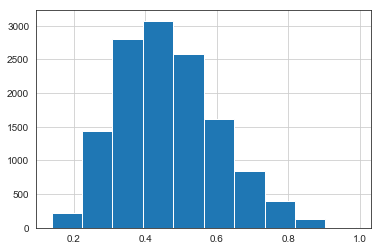

In [48]:
# check how does the model work when the customer actually bought the product on promotion at least once
res_section_0.loc[res_section_0.ever_buy_on_sale == 1, ].pred.hist()

In [49]:
res_section_0.loc[(res_section_0.ever_buy_on_sale == 0) & (res_section_0.pred > 0.2), ].shape

(2758, 4)

In [50]:
res_section_0.loc[(res_section_0.ever_buy_on_sale == 0), ].shape

(150913, 4)

In [51]:
2758/150913

0.018275430214759497

In [52]:
res_section_0.loc[(res_section_0.ever_buy_on_sale == 1) & (res_section_0.pred > 0.2), ].shape

(13025, 4)

In [53]:
res_section_0.loc[(res_section_0.ever_buy_on_sale == 1), ].shape

(13117, 4)

In [54]:
13025/13117

0.9929862011130594

#### 3.3 Decide discount level and estimated COGS

We pick a brand which has the most expected profits from this segment. The idea is to first recommend a top product in the sense of expected profits to each customer. Then we build a list of each customer within this segment being recommended a product. We aggregate the expected profits from this list by each brand. The brand with highest expected profits will be chosen. Among the products of this brand, if the top product we recommend to each customer before does not belong to this brand, we will find the products from this brand that will generate the most and positive expected profits and promote it to the customer instead. The method does not prevent promoting a product to a customer in the case that he has bought it on sale before.

To get the expected profit, we make a few assumptions.
- As the unit price of a product fluctuates, we assign the mode of prices to each product as its price.
- Based on the most frequently-used discount level in this category, we decide to set the discount_level at 0.5.
- We assume COGS is 60% of the lowest price of a product.
- We assume the number we generate with KNNWithMeans can be used as the likelihood that the customer will buy this product if it is on sale

We estimate profits (est_profits) for each product with the formula: unit_price - unit_price * 0.5 - min_price (over time)*0.6.
<br>
We estimate expected profits for each product with the formula pred_prob * est_profits.

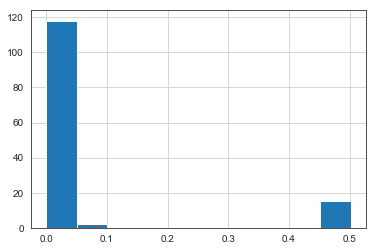

In [55]:
# normally when the products are on sale, what is the discount level
section_0.loc[section_0.price_level == 'Low', ].groupby(['prod_id']).promo_level.median().hist()

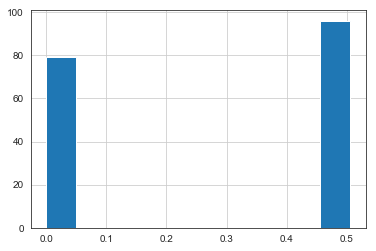

In [56]:
section_0.loc[section_0.price_level == 'Medium', ].groupby(['prod_id']).promo_level.median().hist()

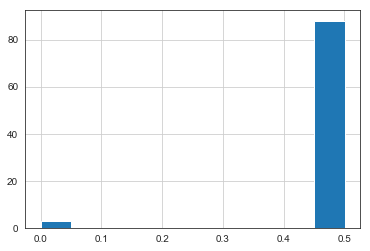

In [57]:
section_0.loc[section_0.price_level == 'High', ].groupby(['prod_id']).promo_level.median().hist()

In [58]:
price = target_brands.groupby('prod_id').prod_unit_price.agg({'min', 'max'})
price

,min,max
prod_id,,
999153511,2.64,5.29
999153512,2.64,5.29
999153661,2.64,5.29
999153662,2.64,5.29
999154430,2.64,5.29
999154972,3.24,6.49
999154976,3.49,3.49
999154978,6.99,6.99
999155420,4.49,8.99


Assume the promotion campaign we will launch provides 50% discount.
<br>
Assume COGS is 60% of the min_price (used as a proxy for pocket price) for a product.

In [59]:
discount_level = 0.5
pocket_margin = 0.4

In [60]:
min_price = target_brands.groupby('prod_id').prod_unit_price.min().to_frame('est_cost')
min_price['est_cost'] = min_price['est_cost'] * (1 - pocket_margin)

#### 3.4 Get normal price for each product

In [61]:
normal_price = target_brands.groupby('prod_id').prod_unit_price.agg(lambda x:x.value_counts().index[0]).to_frame('dist_price')
dist_price = normal_price * discount_level
est_profit = pd.concat([dist_price, min_price], axis = 1)
est_profit['est_profit'] = est_profit['dist_price'] - est_profit['est_cost']
est_profit = est_profit.reset_index()

#### 3.5 Get expected profit for each combination of customer and product if on promotion

In [62]:
res_section_0 = pd.merge(res_section_0, est_profit[['prod_id', 'est_profit']], how = 'inner', on = 'prod_id')
res_section_0['ex_profit'] = res_section_0['pred'] * res_section_0['est_profit']

#### 3.6 Get a list of top one product for each customer

In [63]:
res_section_0['profit_rank'] = res_section_0.groupby(['cust_id'])['ex_profit'].rank(method = 'dense', ascending = False).astype(int)

final_cust_prod = res_section_0[res_section_0.profit_rank == 1]

#### 3.7 Get expected profits from each brand

In [64]:
brand_prod = target_brands[['brand_desc', 'prod_id']].drop_duplicates() # is used to map back to brands

final_cust_prod = pd.merge(final_cust_prod, brand_prod, how = 'inner', on = 'prod_id')
final_cust_prod.groupby(['brand_desc']).ex_profit.sum()

brand_desc
ELVIVE         232.598140
FRUCTIS         30.479309
GLISS           67.118770
PANTENE        128.780710
TRESEMME       202.250504
ULTRA SUAVE     95.059772
Name: ex_profit, dtype: float64

#### 3.8 Finalize customer list and product list

In [65]:
ELVIVE_prod = brand_prod.loc[brand_prod.brand_desc == 'ELVIVE', 'prod_id'].unique()

# restrict to only ELVIVE
res_section_0_ELVIVE = res_section_0.loc[res_section_0.prod_id.isin(ELVIVE_prod), ]

# among the products in ELVIVE, rank the products for each customer
res_section_0_ELVIVE['ELVIVE_rank'] = res_section_0_ELVIVE.groupby(['cust_id'])['ex_profit'].rank(method = 'dense', ascending = False).astype(int)

# get the top one product from ELVIVE that should be promoted to each customer
res_section_0_ELVIVE = res_section_0_ELVIVE[res_section_0_ELVIVE.ELVIVE_rank == 1]

# make sure the expected profit is positive
res_section_0_ELVIVE = res_section_0_ELVIVE[res_section_0_ELVIVE.ex_profit > 0]

# how many profits can be earned from this target personalized campaign
res_section_0_ELVIVE.ex_profit.sum()

501.6053878650006

In [66]:
# The number of products that will be promoted, 33

res_section_0_ELVIVE.prod_id.nunique()

33

#### 3.9 Estimate redemption cost and incremental volumes

Redemption cost is calculated by summing up pred_prob*discount_value for all the products promoted.
<br>
Incremental volume is determined by adding pred_prob for all the products promoted.

In [67]:
# because the discount level is set to .5, so dist_price = dist_amount
res_section_0_ELVIVE = pd.merge(res_section_0_ELVIVE, est_profit[['prod_id', 'dist_price']], how = 'inner', on = 'prod_id')
red_cost = res_section_0_ELVIVE.dist_price.sum()

incre_volumes = res_section_0_ELVIVE.pred.sum()
print('Redemption Cost: ', red_cost)
print('Incremental Volumes: ', incre_volumes)

Redemption Cost:  2972.88
Incremental Volumes:  291.5511395001565


In [69]:
res_section_0_ELVIVE.to_csv('ELVIVE.csv', index = False)

In [70]:
res_section_0_ELVIVE.head()

,cust_id,prod_id,ever_buy_on_sale,pred,est_profit,ex_profit,profit_rank,ELVIVE_rank,dist_price
0,77539710,999246830,1.0,0.638339,1.231,0.785796,2,1,2.995
1,78669634,999246830,1.0,0.531044,1.231,0.653716,6,1,2.995
2,44299729,999246830,1.0,0.579293,1.231,0.713110,6,1,2.995
3,56839870,999246830,1.0,0.432996,1.231,0.533018,8,1,2.995
4,29079953,999246830,1.0,0.313467,1.231,0.385877,8,1,2.995
